In [71]:
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
from sklearn import svm, linear_model, naive_bayes, neural_network, neighbors, ensemble
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer, HashingVectorizer
import random, math
import numpy as np
import scipy.sparse as sp
from datetime import datetime
from collections import Counter
from itertools import combinations

import itertools
import numpy as np
import matplotlib.pyplot as plt

from sklearn import svm, datasets
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

import warnings
warnings.simplefilter("ignore")
from tqdm import tqdm_notebook as tqdm

In [8]:
cd classification_txt_filies_binary

/Volumes/S190813/Music_Box/LTSM_Generative_Music/Classification_Evaluation/classification_txt_filies_binary


In [9]:
p = !pwd
p = p.pop()
e = '/'
p = p + e
p

'/Volumes/S190813/Music_Box/LTSM_Generative_Music/Classification_Evaluation/classification_txt_filies_binary/'


## DEBUSSY

In [10]:
with open(p + 'debussy_xml_list.txt', 'r') as f:
    de_dataset = [piece.strip() for piece in f.readlines()]
    debussy_data = [f for f in de_dataset if f.replace('-', '_').split('_')[0] == 'debussy']
with open('debussy-chordsequence.txt', 'r') as f:
    DEBUSSY = [' '.join(piece.strip('[]\n').split(', ')) for piece in f.readlines()]
    DEBUSSY = [(DEBUSSY[i], debussy_data[i]) for i in range(len(DEBUSSY))]


## RAVEL

In [11]:
with open(p + 'ravel_xml_list.txt', 'r') as f:
    ra_dataset = [piece.strip() for piece in f.readlines()]
    ravel_data = [f for f in ra_dataset if f.replace('-', '_').split('_')[0] == 'ravel']
with open('ravel-chordsequence.txt', 'r') as f:
    RAVEL = [' '.join(piece.strip('[]\n').split(', ')) for piece in f.readlines()]
    RAVEL = [(RAVEL[i], ravel_data[i]) for i in range(len(RAVEL))]

In [12]:
def find_ngrams(input_list, N=4):
    return [' '.join(input_list[i:i+N]) for i in range(len(input_list)-N+1)]

def ngrams_by_composer(composer): 
    for i in range(1,5):
        ngrams = []
        for piece in composer:
            ngrams += find_ngrams(piece[0].split(' '), i)
        print(len(ngrams), '{}-grams total;'.format(str(i)), len(set(ngrams)), 'unique')
    print('-')

def show_ngrams(composer_data, composer_name):
    print(composer_name, ':', len(composer_data), 'pieces')
    ngrams_by_composer(composer_data)

In [13]:
show_ngrams(DEBUSSY,'debussy')
show_ngrams(RAVEL, 'ravel')
show_ngrams(DEBUSSY+RAVEL, 'both composers')

debussy : 20 pieces
10359 1-grams total; 174 unique
10339 2-grams total; 4183 unique
10319 3-grams total; 7326 unique
10299 4-grams total; 8389 unique
-
ravel : 6 pieces
4217 1-grams total; 172 unique
4211 2-grams total; 2613 unique
4205 3-grams total; 3678 unique
4199 4-grams total; 3904 unique
-
both composers : 26 pieces
14576 1-grams total; 181 unique
14550 2-grams total; 5884 unique
14524 3-grams total; 10813 unique
14498 4-grams total; 12247 unique
-


In [14]:
def build_Xy(composers, size=1):
    if size >= 1: # use every rows
        indices = [range(len(composer)) for composer in composers]
    else:
        indices = [random.sample(range(len(composer)), math.ceil(size*len(composer))) for composer in composers]

    y = []
    for i in range(len(composers)):
        y += [i for n in range(len(indices[i]))]
    
    X = []
    for i in range(len(composers)):
        X += [composers[i][j] for j in indices[i]]
    
    return X, np.array(y, dtype='int16')

In [72]:
classes = ['Debussy', 'Ravel']

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)


    print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="black" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    
    

def crossvalidate(X_tuple, y, classifiers, vectorizer, NGRAMRANGE, K=10):    
    for clf in classifiers:
        clf.cm_sum = np.zeros([len(set(y)),len(set(y))], dtype='int16')
        clf.accuracies, clf.fones, clf.misclassified, clf.runningtime = [], [], [], []
        clf.fones_micro, clf.fones_macro = [], []
        clf.name = str(clf).split('(')[0]

    X = np.array([piece[0] for piece in X_tuple])
    filenames = np.array([piece[1] for piece in X_tuple])
    kf = KFold(n_splits=K, shuffle=True)
    for train_index, test_index in kf.split(y):
        X_train, X_test, y_train, y_test = X[train_index], X[test_index], y[train_index], y[test_index]
        
        vct = vectorizer.set_params(lowercase=False, token_pattern=u"(?u)\\b\\w+\\b", ngram_range=NGRAMRANGE)
        X_train_tfidf = vct.fit_transform(X_train)
#         X_test_tfidf = tfidf.transform(X_test)  # i think this computes tf-idf values using the whole test set, but i want each piece to be treated separately
        X_test_tfidf = sp.vstack([vct.transform(np.array([piece])) for piece in X_test])
        
        for clf in classifiers:
            t = datetime.now()
            clf.fit(X_train_tfidf, y_train)
            y_pred = clf.predict(X_test_tfidf)
            clf.runningtime.append((datetime.now()-t).total_seconds())
#             print(y_test)
#             print(y_pred)
#             print(confusion_matrix(y_test, y_pred))
            
            clf.cm_sum += confusion_matrix(y_test, y_pred)
            clf.misclassified.append(test_index[np.where(y_test != y_pred)]) # http://stackoverflow.com/a/25570632
            clf.accuracies.append(accuracy_score(y_test, y_pred))
            clf.fones.append(f1_score(y_test, y_pred, average='weighted'))
            clf.fones_micro.append(f1_score(y_test, y_pred, average='micro'))
            clf.fones_macro.append(f1_score(y_test, y_pred, average='macro'))

    


    result = dict()
    for clf in classifiers:
        clf.misclassified = np.sort(np.hstack(clf.misclassified))
        result[clf.name] = [clf.cm_sum, clf.accuracies, clf.fones, 
                            clf.misclassified, filenames[clf.misclassified], 
                            clf.runningtime, clf.fones_micro, clf.fones_macro]

        # Plot non-normalized confusion matrix
        plt.figure()
        plot_confusion_matrix(clf.cm_sum, classes=classes,
                              title='Confusion matrix',
                              normalize = True)


        plt.show()
    return result

In [40]:
def benchmark_classifiers(composers, NGRAMRANGES, classifiers, vectorizer, n=1, retrieve_title=True):
    misclassified_list = []
    for NGRAMRANGE in tqdm(NGRAMRANGES):
        print('n-gram range', NGRAMRANGE)
        X, y = build_Xy(composers, size=n)
        cv_result = crossvalidate(X, y, classifiers, vectorizer, NGRAMRANGE)
        for clf, results in cv_result.items():
            print(clf)
            cm = results[0]
            print(cm)
            acc = results[1] # using two different f-measures, don't need this
#             print('accuracy', round(np.mean(acc)*100,2), '({})'.format(round(np.std(acc, ddof=1)*100,2)))
            fones = results[2] # weighted average, don't need this
#             print('f1', round(np.mean(fones)*100,2), '({})'.format(round(np.std(fones, ddof=1)*100,2)), fones)
            misclassified = results[3]
            misclassified_filenames = results[4]
            misclassified_list += list(misclassified_filenames)
#             print('misclassified',[(misclassified[i], misclassified_filenames[i]) for i in range(len(misclassified))])
            runningtime = results[5]
#             print('running time', np.sum(runningtime))
            fones_micro = results[6]
            fones_macro = results[7]
            print('micro-averaged f-score (std) & macro-averaged f-score (std)')
            print(round(np.mean(fones_micro),4), '({})'.format(round(np.std(fones_micro, ddof=1),4)), '&', round(np.mean(fones_macro),4), '({})'.format(round(np.std(fones_macro, ddof=1),4)))
    print('-----')
    return misclassified_list

In [73]:
COMPOSERS = [DEBUSSY, RAVEL]
NGRAMRANGES = [(1,1),(2,2),(3,3),(4,4),(1,2),(3,4),(1,4)]
CLASSIFIERS = [svm.LinearSVC(penalty='l2', C=5, loss='hinge'),
               linear_model.LogisticRegression(penalty='l2', C=100, tol=1, multi_class='multinomial', solver='sag'),
               neighbors.KNeighborsClassifier(weights='distance'),
               naive_bayes.MultinomialNB(alpha=0.00001, fit_prior=False),
               neural_network.MLPClassifier(solver='lbfgs',hidden_layer_sizes=(10,))]

n-gram range (1, 1)
[[20  9]
 [ 9 15]]


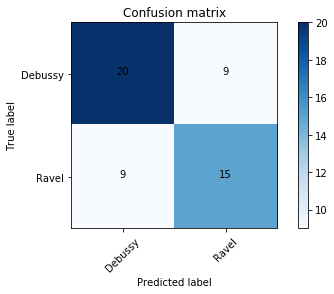

[[17 10]
 [10 10]]


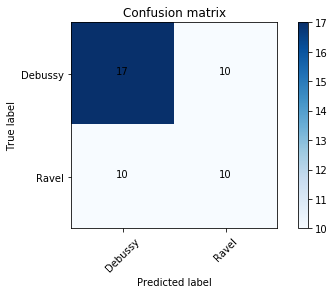

[[17  8]
 [ 5 11]]


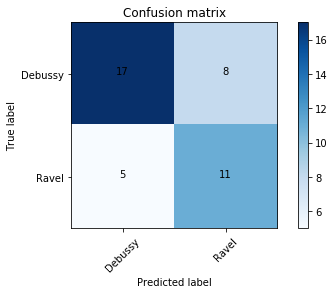

[[19 10]
 [11 13]]


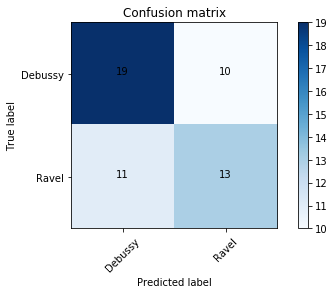

[[19 10]
 [ 9 15]]


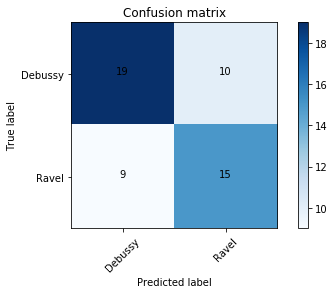

LinearSVC
[[20  9]
 [ 9 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
1.0 (0.0) & 1.0 (0.0)
LogisticRegression
[[17 10]
 [10 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2108) & 0.6533 (0.3124)
KNeighborsClassifier
[[17  8]
 [ 5 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2194) & 0.8333 (0.2833)
MultinomialNB
[[19 10]
 [11 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.84 (0.2707)
MLPClassifier
[[19 10]
 [ 9 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.9667 (0.1054)
n-gram range (2, 2)
[[20 12]
 [18 12]]


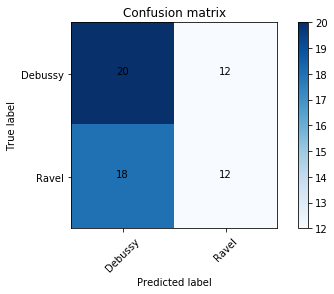

[[20 12]
 [17 13]]


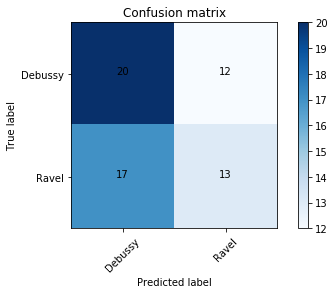

[[18 11]
 [10 14]]


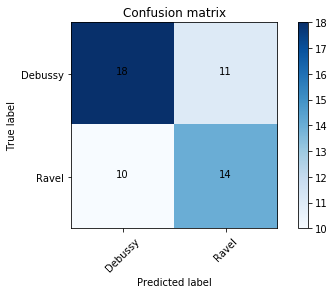

[[20 12]
 [15 15]]


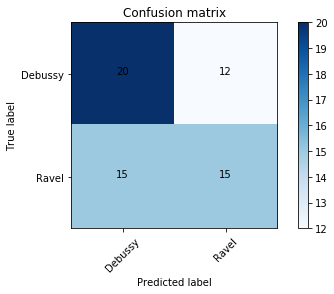

[[20 12]
 [18 12]]


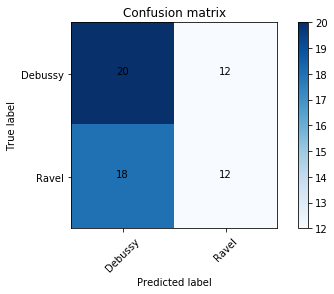

LinearSVC
[[20 12]
 [18 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.6783 (0.3419)
LogisticRegression
[[20 12]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.254) & 0.7383 (0.3403)
KNeighborsClassifier
[[18 11]
 [10 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.225) & 0.8917 (0.2486)
MultinomialNB
[[20 12]
 [15 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.84 (0.2707)
MLPClassifier
[[20 12]
 [18 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.6783 (0.3419)
n-gram range (3, 3)
[[20 11]
 [17 11]]


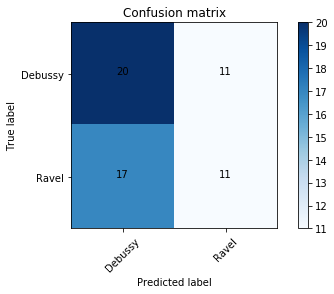

[[20 11]
 [16 12]]


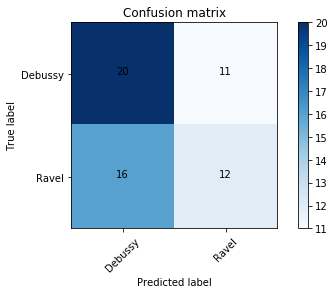

[[19 12]
 [15 13]]


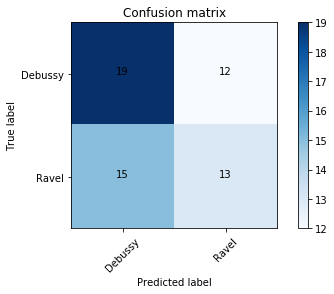

[[19 12]
 [14 14]]


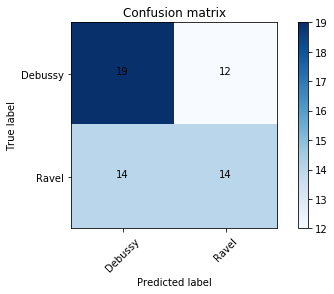

[[18 10]
 [13  9]]


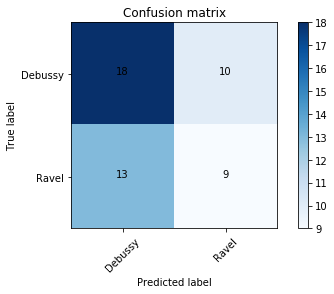

LinearSVC
[[20 11]
 [17 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.2257) & 0.62 (0.3282)
LogisticRegression
[[20 11]
 [16 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2194) & 0.6867 (0.3312)
KNeighborsClassifier
[[19 12]
 [15 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2699) & 0.7317 (0.3482)
MultinomialNB
[[19 12]
 [14 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.1995) & 0.78 (0.2966)
MLPClassifier
[[18 10]
 [13  9]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7333 (0.2509) & 0.6117 (0.3372)
n-gram range (4, 4)
[[20 11]
 [17 11]]


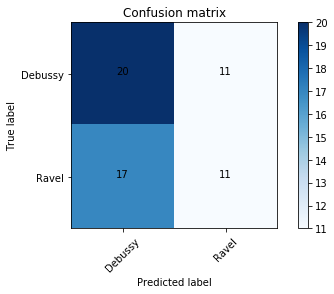

[[18 11]
 [14 10]]


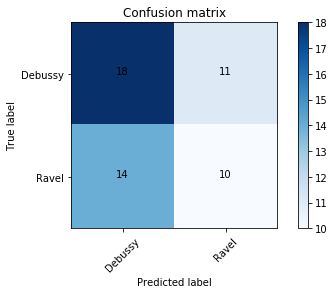

[[20 11]
 [15 13]]


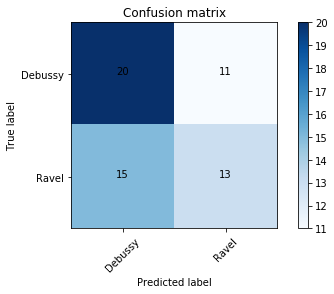

[[20 11]
 [13 15]]


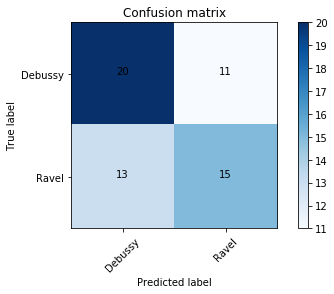

[[20 11]
 [17 11]]


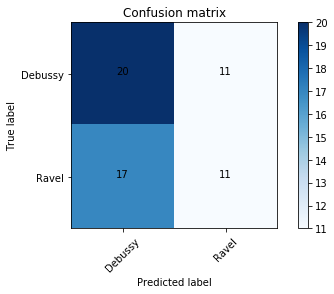

LinearSVC
[[20 11]
 [17 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2331) & 0.685 (0.335)
LogisticRegression
[[18 11]
 [14 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7333 (0.3443) & 0.645 (0.3919)
KNeighborsClassifier
[[20 11]
 [15 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2331) & 0.805 (0.3166)
MultinomialNB
[[20 11]
 [13 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.9067 (0.2066)
MLPClassifier
[[20 11]
 [17 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2331) & 0.685 (0.335)
n-gram range (1, 2)
[[20  9]
 [13 11]]


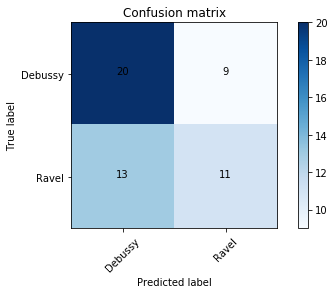

[[20  9]
 [15  9]]


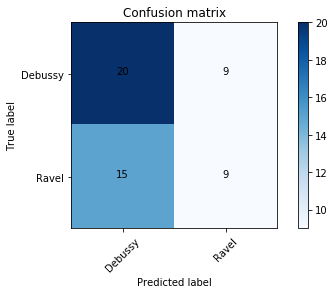

[[17  7]
 [ 4 10]]


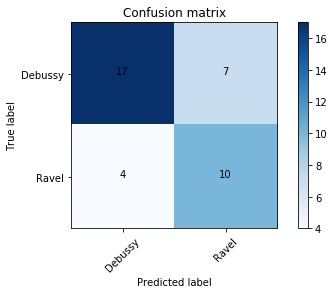

[[20  9]
 [11 13]]


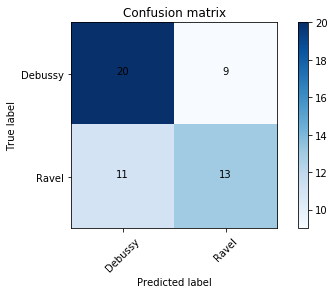

[[20  9]
 [12 12]]


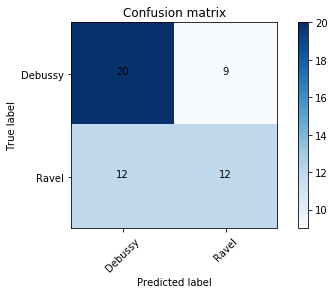

LinearSVC
[[20  9]
 [13 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.1721) & 0.76 (0.3098)
LogisticRegression
[[20  9]
 [15  9]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.1933) & 0.6333 (0.3162)
KNeighborsClassifier
[[17  7]
 [ 4 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.84 (0.2707)
MultinomialNB
[[20  9]
 [11 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.88 (0.253)
MLPClassifier
[[20  9]
 [12 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.8133 (0.3011)
n-gram range (3, 4)
[[20 14]
 [20 14]]


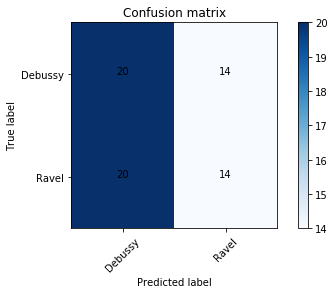

[[20 14]
 [18 16]]


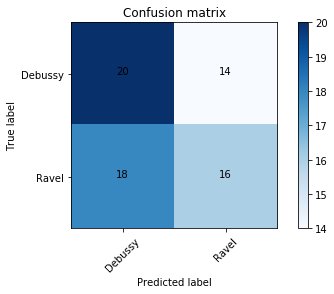

[[19 13]
 [17 13]]


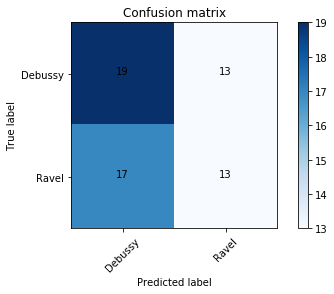

[[20 14]
 [17 17]]


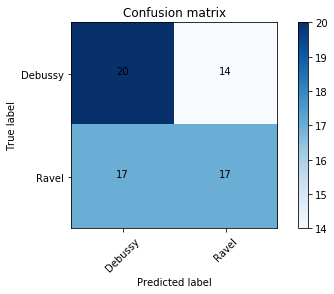

[[19 13]
 [18 12]]


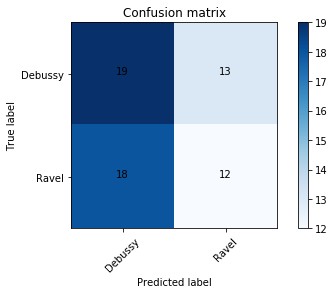

LinearSVC
[[20 14]
 [20 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2811) & 0.73 (0.3521)
LogisticRegression
[[20 14]
 [18 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2331) & 0.8317 (0.2887)
KNeighborsClassifier
[[19 13]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2945) & 0.7233 (0.3596)
MultinomialNB
[[20 14]
 [17 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.161) & 0.8733 (0.2165)
MLPClassifier
[[19 13]
 [18 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.286) & 0.6633 (0.3584)
n-gram range (1, 4)
[[20 11]
 [17 11]]


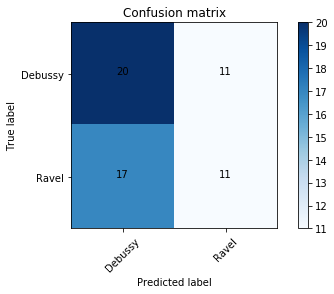

[[20 11]
 [16 12]]


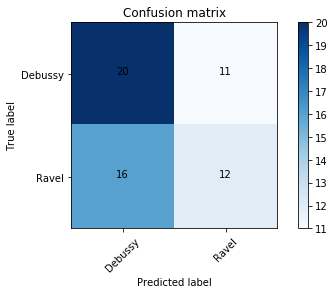

[[18 10]
 [ 8 14]]


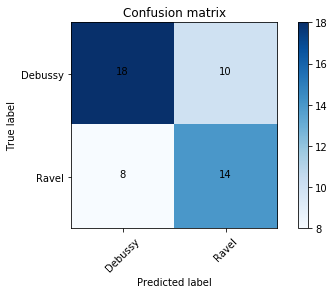

[[20 11]
 [12 16]]


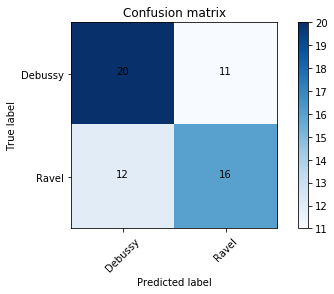

[[20 11]
 [14 14]]


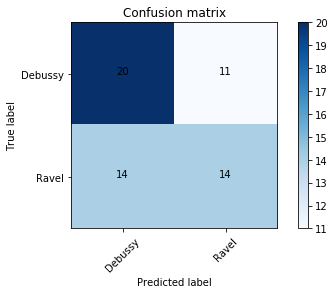

LinearSVC
[[20 11]
 [17 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.2257) & 0.62 (0.3282)
LogisticRegression
[[20 11]
 [16 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2194) & 0.6867 (0.3312)
KNeighborsClassifier
[[18 10]
 [ 8 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)
MultinomialNB
[[20 11]
 [12 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.95 (0.1581) & 0.9333 (0.2108)
MLPClassifier
[[20 11]
 [14 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2194) & 0.8067 (0.3118)

-----


['debussy_xml0.xml',
 'debussy_xml1.xml',
 'debussy_xml18.xml',
 'ravel_xml2.xml',
 'ravel_xml3.xml',
 'ravel_xml4.xml',
 'debussy_xml0.xml',
 'debussy_xml18.xml',
 'debussy_xml19.xml',
 'debussy_xml18.xml',
 'ravel_xml0.xml',
 'ravel_xml3.xml',
 'debussy_xml18.xml',
 'ravel_xml0.xml',
 'ravel_xml1.xml',
 'ravel_xml2.xml',
 'ravel_xml3.xml',
 'ravel_xml4.xml',
 'ravel_xml5.xml',
 'ravel_xml0.xml',
 'ravel_xml2.xml',
 'ravel_xml3.xml',
 'ravel_xml4.xml',
 'ravel_xml5.xml',
 'debussy_xml0.xml',
 'debussy_xml18.xml',
 'ravel_xml5.xml',
 'ravel_xml0.xml',
 'ravel_xml3.xml',
 'ravel_xml5.xml',
 'ravel_xml0.xml',
 'ravel_xml1.xml',
 'ravel_xml2.xml',
 'ravel_xml3.xml',
 'ravel_xml4.xml',
 'ravel_xml5.xml',
 'ravel_xml0.xml',
 'ravel_xml1.xml',
 'ravel_xml2.xml',
 'ravel_xml3.xml',
 'ravel_xml4.xml',
 'ravel_xml5.xml',
 'ravel_xml0.xml',
 'ravel_xml2.xml',
 'ravel_xml3.xml',
 'ravel_xml4.xml',
 'ravel_xml5.xml',
 'debussy_xml18.xml',
 'ravel_xml2.xml',
 'ravel_xml3.xml',
 'ravel_xml4.xml',
 '

In [74]:
VECTORIZER = TfidfVectorizer(sublinear_tf=True)
benchmark_classifiers(COMPOSERS,NGRAMRANGES,CLASSIFIERS,VECTORIZER)

In [19]:
VECTORIZER = CountVectorizer(binary=True)
benchmark_classifiers(COMPOSERS,NGRAMRANGES,CLASSIFIERS,VECTORIZER)

n-gram range (1, 1)
LinearSVC
[[19 10]
 [10 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.9067 (0.2066)
LogisticRegression
[[16 14]
 [12 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.3622) & 0.725 (0.389)
KNeighborsClassifier
[[20 12]
 [14 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.9067 (0.2066)
MultinomialNB
[[20 12]
 [14 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.9067 (0.2066)
MLPClassifier
[[19 10]
 [ 9 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.94 (0.1897)
n-gram range (2, 2)
LinearSVC
[[20 10]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.1995) & 0.6933 (0.3239)
LogisticRegression
[[20 10]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.1995) & 0.6933 (0.3239)
KNeighborsClassifier
[[20 10]
 [16 10]]
micro-averaged f-score (std)

['debussy_xml8.xml',
 'ravel_xml2.xml',
 'debussy_xml0.xml',
 'debussy_xml11.xml',
 'debussy_xml12.xml',
 'debussy_xml6.xml',
 'ravel_xml0.xml',
 'ravel_xml2.xml',
 'ravel_xml1.xml',
 'ravel_xml2.xml',
 'ravel_xml2.xml',
 'ravel_xml3.xml',
 'debussy_xml8.xml',
 'ravel_xml0.xml',
 'ravel_xml2.xml',
 'ravel_xml3.xml',
 'ravel_xml4.xml',
 'ravel_xml5.xml',
 'ravel_xml0.xml',
 'ravel_xml2.xml',
 'ravel_xml3.xml',
 'ravel_xml4.xml',
 'ravel_xml5.xml',
 'ravel_xml0.xml',
 'ravel_xml1.xml',
 'ravel_xml2.xml',
 'ravel_xml3.xml',
 'ravel_xml4.xml',
 'ravel_xml5.xml',
 'ravel_xml0.xml',
 'ravel_xml3.xml',
 'ravel_xml4.xml',
 'ravel_xml5.xml',
 'ravel_xml0.xml',
 'ravel_xml1.xml',
 'ravel_xml2.xml',
 'ravel_xml3.xml',
 'ravel_xml4.xml',
 'ravel_xml0.xml',
 'ravel_xml1.xml',
 'ravel_xml2.xml',
 'ravel_xml3.xml',
 'ravel_xml4.xml',
 'ravel_xml5.xml',
 'ravel_xml0.xml',
 'ravel_xml1.xml',
 'ravel_xml2.xml',
 'ravel_xml3.xml',
 'ravel_xml4.xml',
 'ravel_xml5.xml',
 'ravel_xml0.xml',
 'ravel_xml1.xml'

n-gram range (1, 1)
[[18  8]
 [ 6 12]]


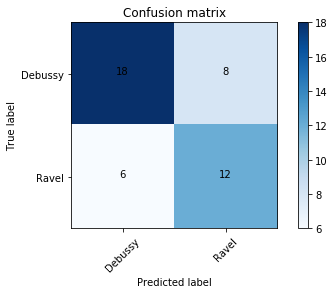

[[20 11]
 [17 11]]


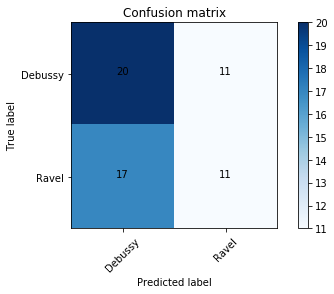

[[20 11]
 [15 13]]


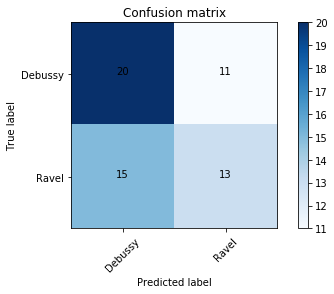

[[18 11]
 [10 14]]


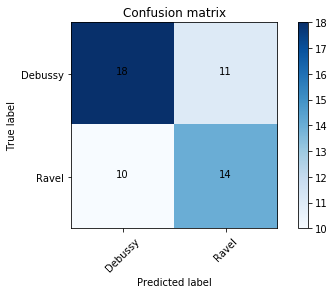

[[19  9]
 [10 12]]


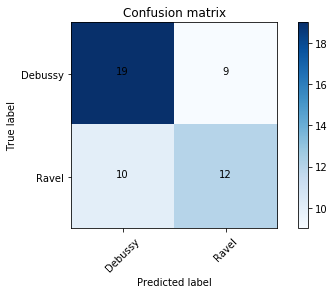

LinearSVC
[[18  8]
 [ 6 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)
LogisticRegression
[[20 11]
 [17 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.2257) & 0.62 (0.3282)
KNeighborsClassifier
[[20 11]
 [15 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.2415) & 0.74 (0.3362)
MultinomialNB
[[18 11]
 [10 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.84 (0.2707)
MLPClassifier
[[19  9]
 [10 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.8133 (0.3011)
n-gram range (2, 2)
[[20 13]
 [17 15]]


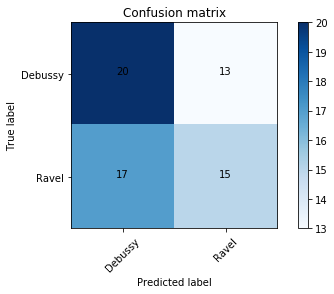

[[20 13]
 [19 13]]


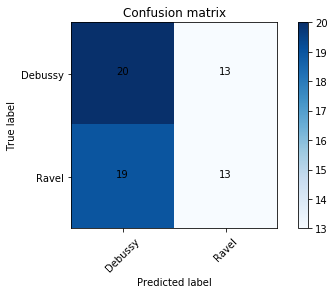

[[20 13]
 [19 13]]


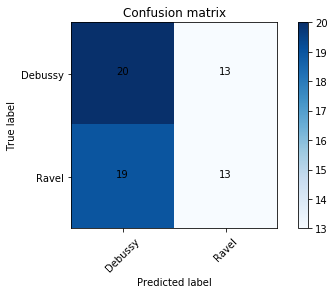

[[20 13]
 [17 15]]


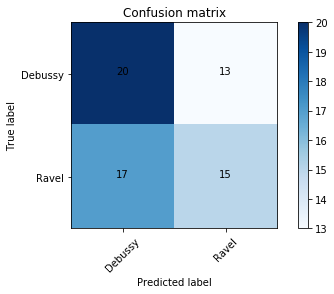

[[20 13]
 [18 14]]


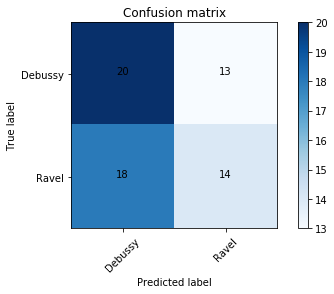

LinearSVC
[[20 13]
 [17 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2222) & 0.7733 (0.3066)
LogisticRegression
[[20 13]
 [19 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2629) & 0.6717 (0.3485)
KNeighborsClassifier
[[20 13]
 [19 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2629) & 0.6717 (0.3485)
MultinomialNB
[[20 13]
 [17 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.1995) & 0.78 (0.2966)
MLPClassifier
[[20 13]
 [18 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2194) & 0.7133 (0.3159)
n-gram range (3, 3)
[[19 13]
 [17 13]]


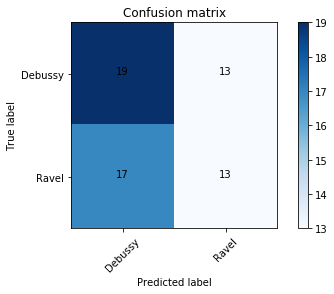

[[17 10]
 [12  8]]


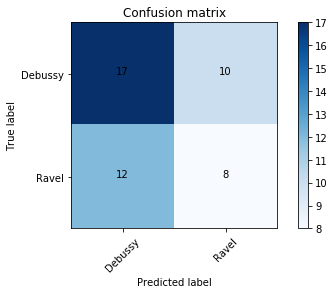

[[19 12]
 [17 11]]


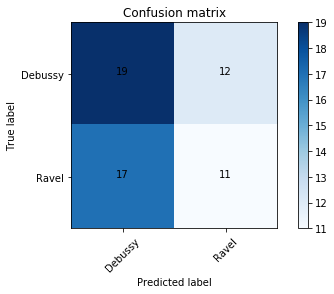

[[20 14]
 [18 16]]


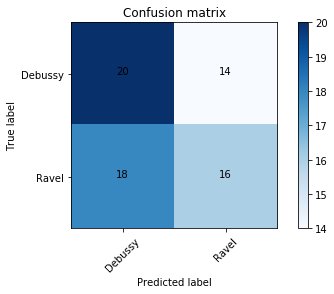

[[17 15]
 [17 13]]


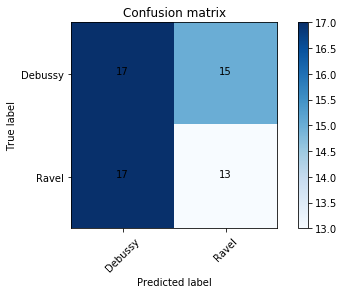

LinearSVC
[[19 13]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.3338) & 0.7133 (0.3862)
LogisticRegression
[[17 10]
 [12  8]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7 (0.322) & 0.5867 (0.3742)
KNeighborsClassifier
[[19 12]
 [17 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.3162) & 0.66 (0.3777)
MultinomialNB
[[20 14]
 [18 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.322) & 0.84 (0.3502)
MLPClassifier
[[17 15]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7167 (0.3518) & 0.6383 (0.3971)
n-gram range (4, 4)
[[19 13]
 [17 13]]


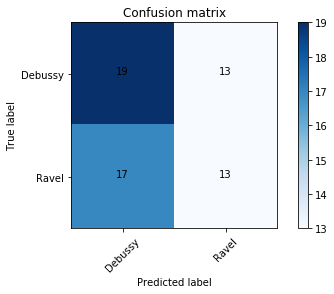

[[19 13]
 [17 13]]


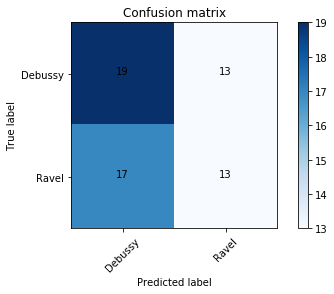

[[19 13]
 [18 12]]


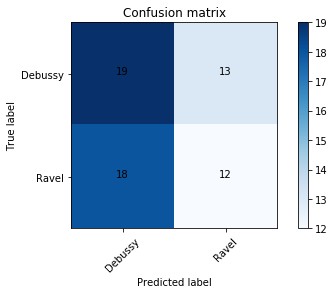

[[19 13]
 [15 15]]


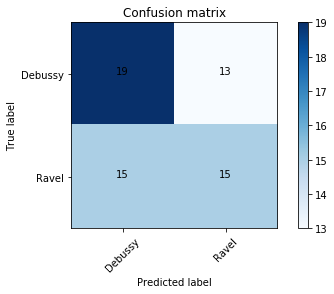

[[17 12]
 [15  9]]


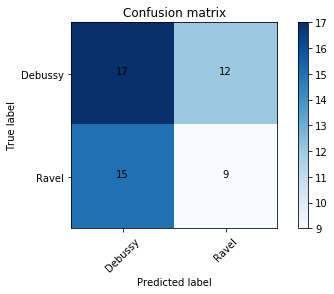

LinearSVC
[[19 13]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.3338) & 0.7133 (0.3862)
LogisticRegression
[[19 13]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.3338) & 0.7133 (0.3862)
KNeighborsClassifier
[[19 13]
 [18 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.3263) & 0.6533 (0.3834)
MultinomialNB
[[19 13]
 [15 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2331) & 0.805 (0.3166)
MLPClassifier
[[17 12]
 [15  9]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.6833 (0.3375) & 0.5783 (0.3814)
n-gram range (1, 2)
[[19 11]
 [11 15]]


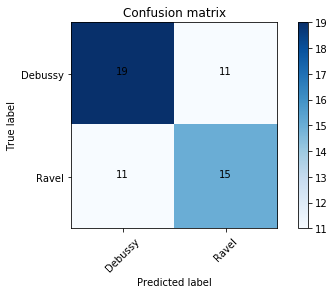

[[17 13]
 [14 12]]


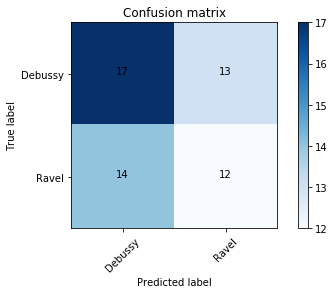

[[20 13]
 [17 15]]


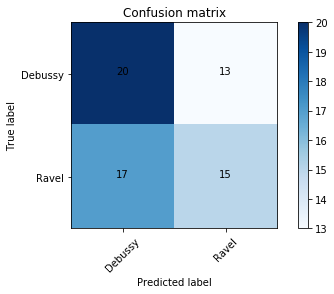

[[20 13]
 [16 16]]


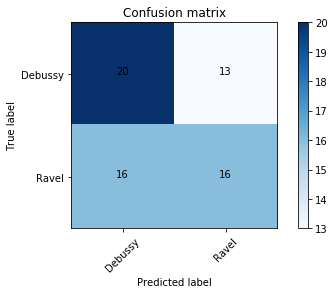

[[19 14]
 [15 17]]


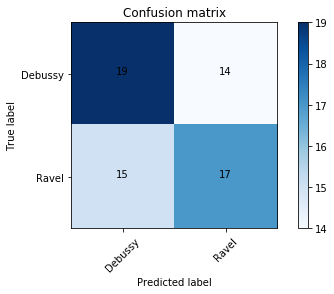

LinearSVC
[[19 11]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.88 (0.253)
LogisticRegression
[[17 13]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.286) & 0.6633 (0.3584)
KNeighborsClassifier
[[20 13]
 [17 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2222) & 0.7733 (0.3066)
MultinomialNB
[[20 13]
 [16 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.84 (0.2707)
MLPClassifier
[[19 14]
 [15 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.84 (0.2707)
n-gram range (3, 4)
[[19 11]
 [15 11]]


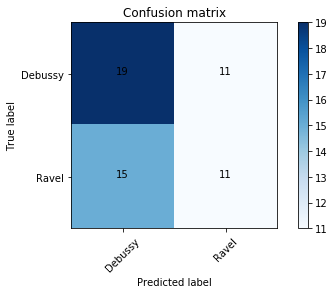

[[18 10]
 [13  9]]


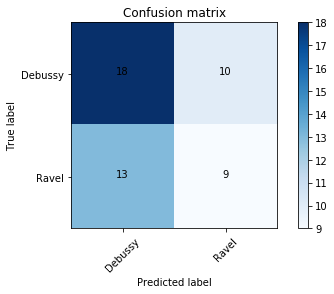

[[19 11]
 [16 10]]


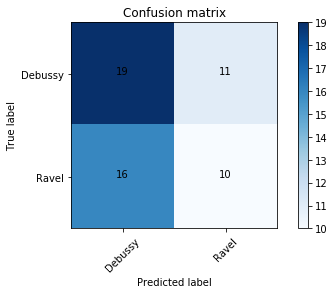

[[20 10]
 [14 12]]


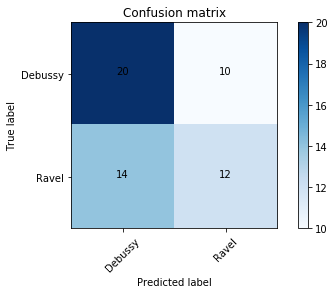

[[19 11]
 [15 11]]


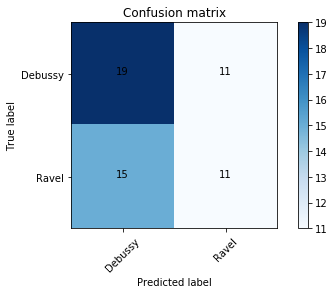

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.6783 (0.3419)
LogisticRegression
[[18 10]
 [13  9]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7167 (0.2612) & 0.605 (0.3425)
KNeighborsClassifier
[[19 11]
 [16 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7333 (0.2509) & 0.6117 (0.3372)
MultinomialNB
[[20 10]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.1995) & 0.7533 (0.319)
MLPClassifier
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.6783 (0.3419)
n-gram range (1, 4)
[[19 16]
 [18 18]]


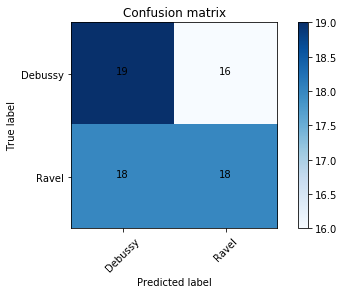

[[20 15]
 [20 16]]


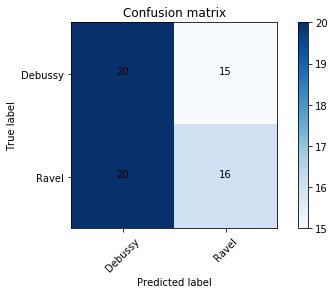

[[20 15]
 [20 16]]


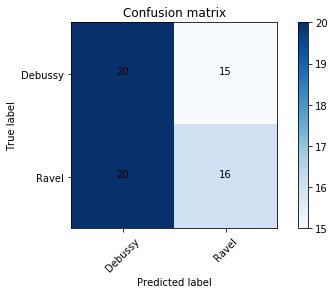

[[20 15]
 [19 17]]


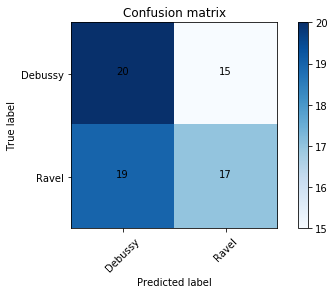

[[19 16]
 [18 18]]


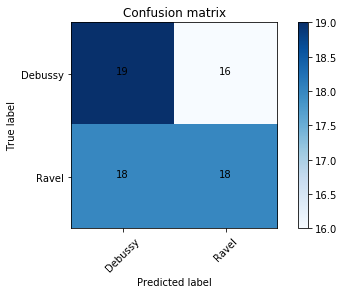

LinearSVC
[[19 16]
 [18 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.254) & 0.825 (0.3003)
LogisticRegression
[[20 15]
 [20 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.3583) & 0.765 (0.3902)
KNeighborsClassifier
[[20 15]
 [20 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.3583) & 0.765 (0.3902)
MultinomialNB
[[20 15]
 [19 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.36) & 0.825 (0.3736)
MLPClassifier
[[19 16]
 [18 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.254) & 0.825 (0.3003)

-----


['debussy_xml0.xml',
 'debussy_xml5.xml',
 'ravel_xml0.xml',
 'ravel_xml1.xml',
 'ravel_xml2.xml',
 'ravel_xml3.xml',
 'ravel_xml4.xml',
 'ravel_xml5.xml',
 'ravel_xml0.xml',
 'ravel_xml1.xml',
 'ravel_xml2.xml',
 'ravel_xml4.xml',
 'debussy_xml0.xml',
 'debussy_xml18.xml',
 'ravel_xml0.xml',
 'debussy_xml16.xml',
 'ravel_xml4.xml',
 'ravel_xml5.xml',
 'ravel_xml0.xml',
 'ravel_xml2.xml',
 'ravel_xml3.xml',
 'ravel_xml4.xml',
 'ravel_xml0.xml',
 'ravel_xml1.xml',
 'ravel_xml2.xml',
 'ravel_xml3.xml',
 'ravel_xml4.xml',
 'ravel_xml5.xml',
 'ravel_xml0.xml',
 'ravel_xml1.xml',
 'ravel_xml2.xml',
 'ravel_xml3.xml',
 'ravel_xml4.xml',
 'ravel_xml5.xml',
 'ravel_xml0.xml',
 'ravel_xml3.xml',
 'ravel_xml4.xml',
 'ravel_xml5.xml',
 'ravel_xml0.xml',
 'ravel_xml2.xml',
 'ravel_xml3.xml',
 'ravel_xml4.xml',
 'ravel_xml5.xml',
 'debussy_xml5.xml',
 'ravel_xml0.xml',
 'ravel_xml2.xml',
 'ravel_xml3.xml',
 'ravel_xml4.xml',
 'ravel_xml5.xml',
 'debussy_xml11.xml',
 'debussy_xml18.xml',
 'debussy_x

In [75]:
VECTORIZER = CountVectorizer()
benchmark_classifiers(COMPOSERS,NGRAMRANGES,CLASSIFIERS,VECTORIZER)

n-gram range (1, 1)
[[18 10]
 [ 8 14]]


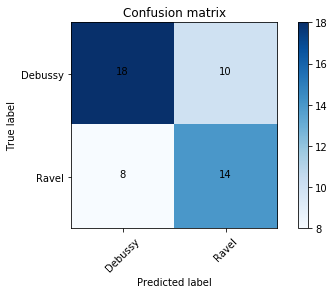

LinearSVC
[[18 10]
 [ 8 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.9 (0.225)
n-gram range (2, 2)
[[20 15]
 [18 18]]


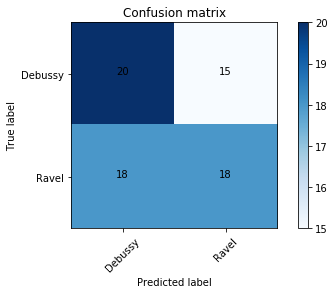

LinearSVC
[[20 15]
 [18 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.84 (0.2707)
n-gram range (3, 3)
[[19 13]
 [17 13]]


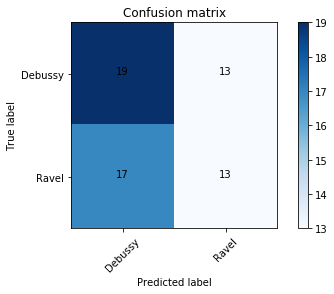

LinearSVC
[[19 13]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.705 (0.3279)
n-gram range (4, 4)
[[19 11]
 [14 12]]


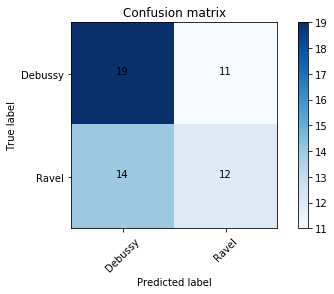

LinearSVC
[[19 11]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.3338) & 0.7133 (0.3862)
n-gram range (1, 2)
[[21 15]
 [15 17]]


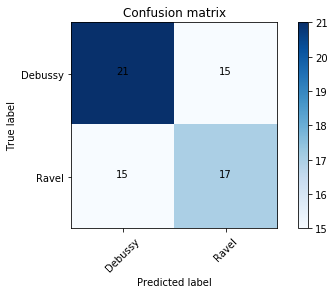

LinearSVC
[[21 15]
 [15 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.9067 (0.2066)
n-gram range (3, 4)
[[19  9]
 [13  9]]


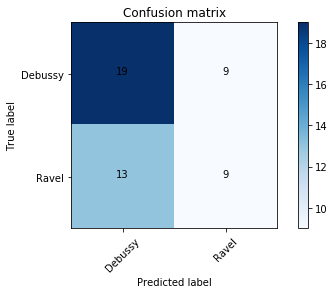

LinearSVC
[[19  9]
 [13  9]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2108) & 0.6267 (0.3223)
n-gram range (1, 4)
[[18 13]
 [12 16]]


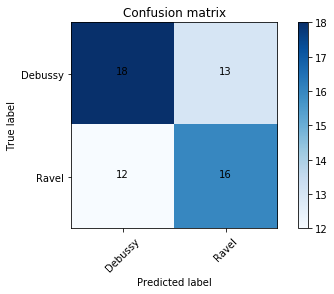

LinearSVC
[[18 13]
 [12 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.225) & 0.865 (0.2868)

-----


n-gram range (1, 1)
[[20 11]
 [ 9 13]]


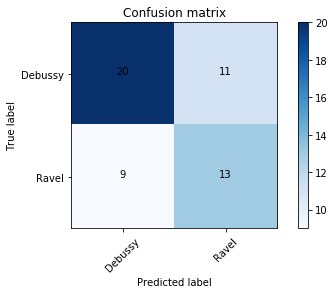

LinearSVC
[[20 11]
 [ 9 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.88 (0.253)
n-gram range (2, 2)
[[20 16]
 [19 19]]


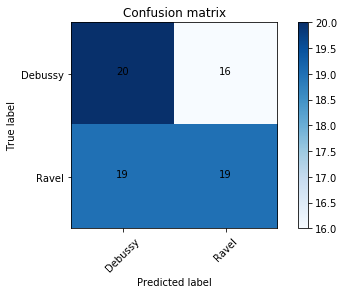

LinearSVC
[[20 16]
 [19 19]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.8667 (0.2331)
n-gram range (3, 3)
[[20 13]
 [18 14]]


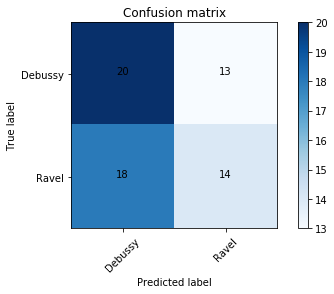

LinearSVC
[[20 13]
 [18 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.322) & 0.72 (0.3795)
n-gram range (4, 4)
[[19  9]
 [12 10]]


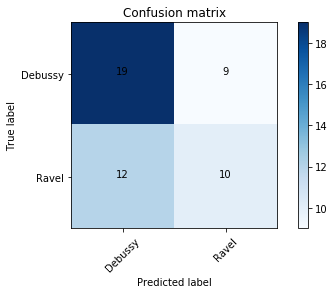

LinearSVC
[[19  9]
 [12 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2194) & 0.6867 (0.3312)
n-gram range (1, 2)
[[18 12]
 [11 15]]


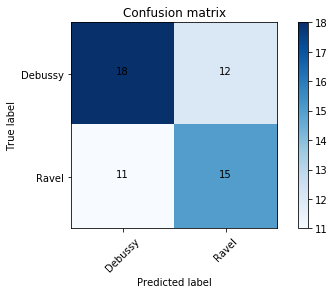

LinearSVC
[[18 12]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.84 (0.2707)
n-gram range (3, 4)
[[19 13]
 [17 13]]


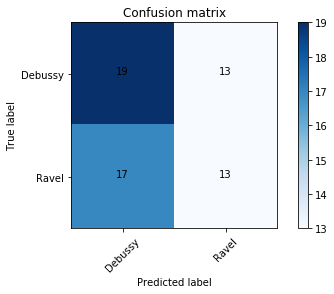

LinearSVC
[[19 13]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2945) & 0.7233 (0.3596)
n-gram range (1, 4)
[[19 15]
 [15 19]]


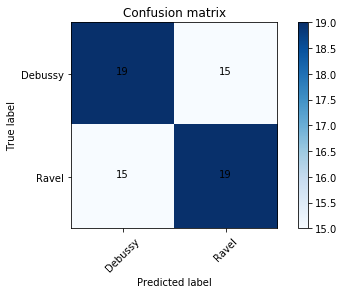

LinearSVC
[[19 15]
 [15 19]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.9 (0.225)

-----


n-gram range (1, 1)
[[19  8]
 [ 7 13]]


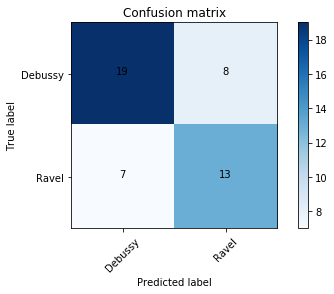

LinearSVC
[[19  8]
 [ 7 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.94 (0.1897)
n-gram range (2, 2)
[[20 13]
 [17 15]]


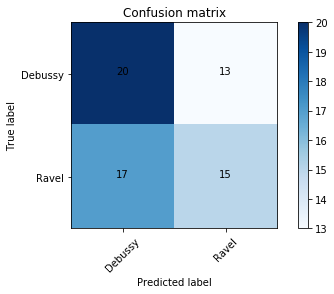

LinearSVC
[[20 13]
 [17 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2331) & 0.805 (0.3166)
n-gram range (3, 3)
[[18  9]
 [12  8]]


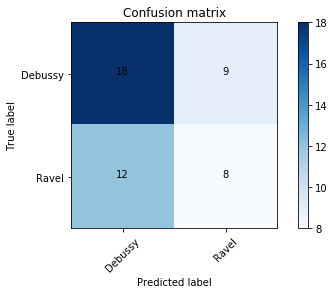

LinearSVC
[[18  9]
 [12  8]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.239) & 0.6183 (0.3317)
n-gram range (4, 4)
[[19  8]
 [11  9]]


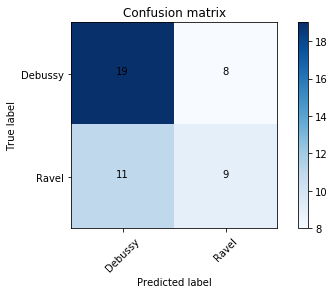

LinearSVC
[[19  8]
 [11  9]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.1995) & 0.6933 (0.3239)
n-gram range (1, 2)
[[18  9]
 [ 8 12]]


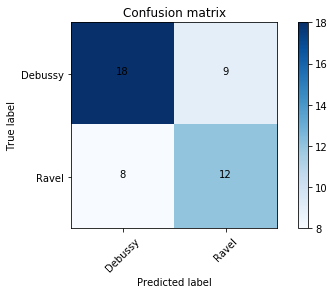

LinearSVC
[[18  9]
 [ 8 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.161) & 0.8467 (0.2573)
n-gram range (3, 4)
[[19 11]
 [15 11]]


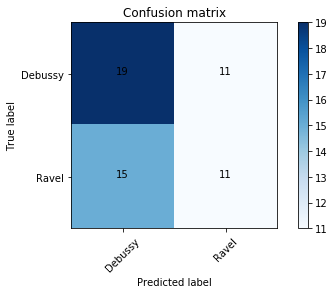

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2629) & 0.6717 (0.3485)
n-gram range (1, 4)
[[19 14]
 [15 17]]


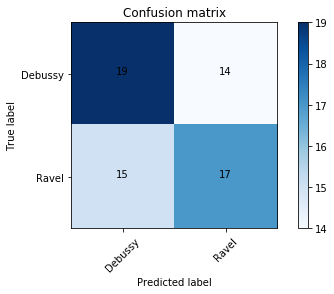

LinearSVC
[[19 14]
 [15 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.225) & 0.865 (0.2868)

-----


n-gram range (1, 1)
[[19 11]
 [10 16]]


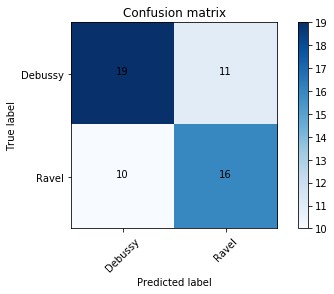

LinearSVC
[[19 11]
 [10 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.95 (0.1581) & 0.9333 (0.2108)
n-gram range (2, 2)
[[20 16]
 [20 18]]


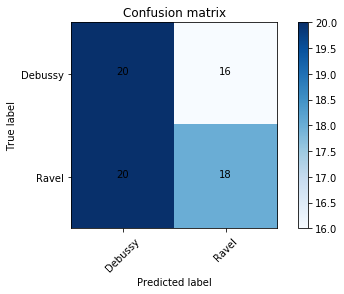

LinearSVC
[[20 16]
 [20 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.254) & 0.825 (0.3003)
n-gram range (3, 3)
[[19 10]
 [14 10]]


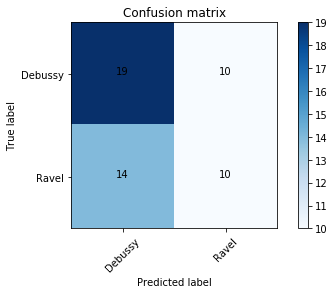

LinearSVC
[[19 10]
 [14 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.1933) & 0.66 (0.3054)
n-gram range (4, 4)
[[19 10]
 [13 11]]


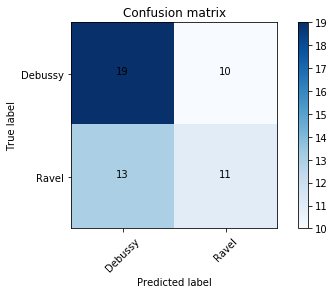

LinearSVC
[[19 10]
 [13 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.254) & 0.7383 (0.3403)
n-gram range (1, 2)
[[19 11]
 [11 15]]


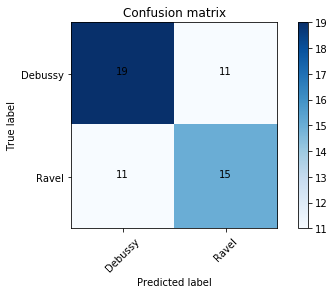

LinearSVC
[[19 11]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.9067 (0.2066)
n-gram range (3, 4)
[[19 13]
 [16 14]]


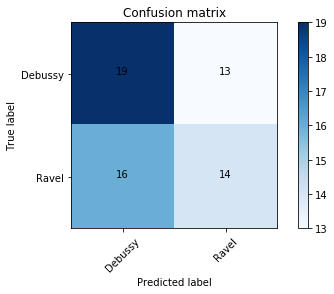

LinearSVC
[[19 13]
 [16 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.3375) & 0.7733 (0.3787)
n-gram range (1, 4)
[[19 11]
 [11 15]]


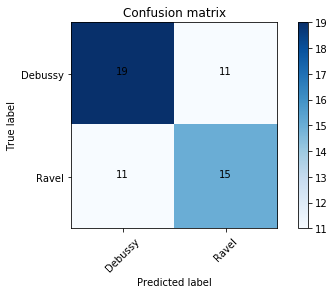

LinearSVC
[[19 11]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.9067 (0.2066)

-----


n-gram range (1, 1)
[[21 14]
 [13 17]]


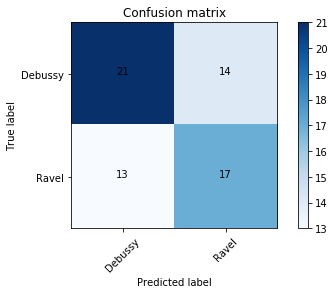

LinearSVC
[[21 14]
 [13 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.94 (0.1897)
n-gram range (2, 2)
[[19 12]
 [15 13]]


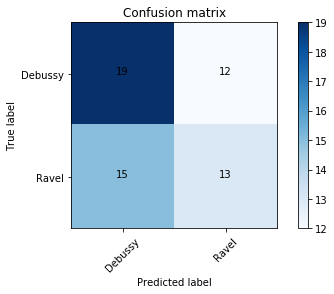

LinearSVC
[[19 12]
 [15 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.3443) & 0.7067 (0.3928)
n-gram range (3, 3)
[[19 11]
 [15 11]]


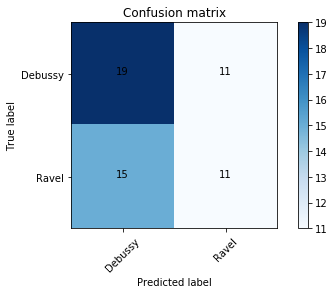

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.6783 (0.3419)
n-gram range (4, 4)
[[19  8]
 [11  9]]


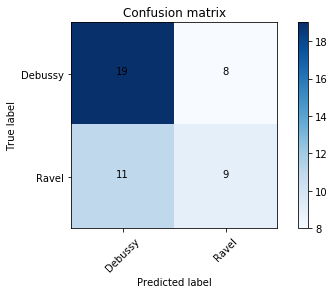

LinearSVC
[[19  8]
 [11  9]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2194) & 0.6867 (0.3312)
n-gram range (1, 2)
[[19 10]
 [10 14]]


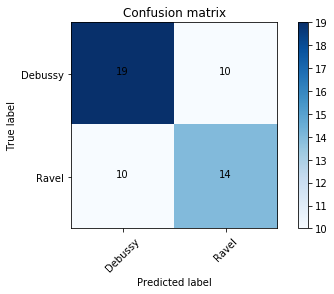

LinearSVC
[[19 10]
 [10 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.9067 (0.2066)
n-gram range (3, 4)
[[19 11]
 [15 11]]


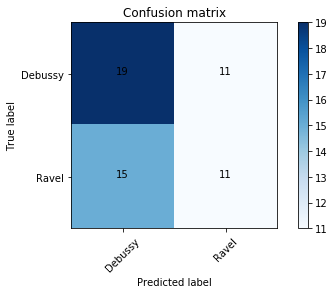

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.6783 (0.3419)
n-gram range (1, 4)
[[18 15]
 [14 18]]


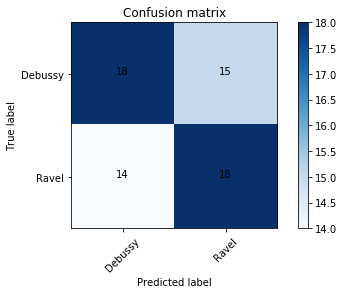

LinearSVC
[[18 15]
 [14 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.84 (0.2707)

-----


n-gram range (1, 1)
[[19 14]
 [15 17]]


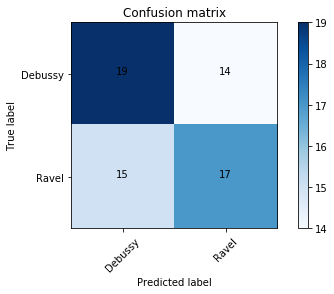

LinearSVC
[[19 14]
 [15 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.2491) & 0.8583 (0.2993)
n-gram range (2, 2)
[[18 14]
 [16 14]]


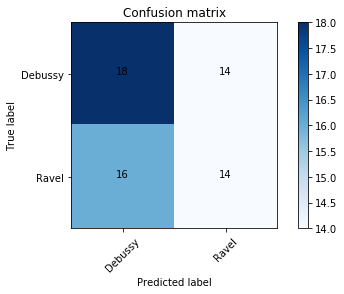

LinearSVC
[[18 14]
 [16 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2945) & 0.7233 (0.3596)
n-gram range (3, 3)
[[19 11]
 [15 11]]


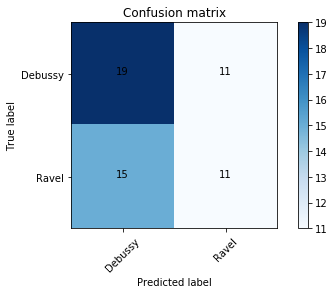

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2629) & 0.6717 (0.3485)
n-gram range (4, 4)
[[19 14]
 [18 14]]


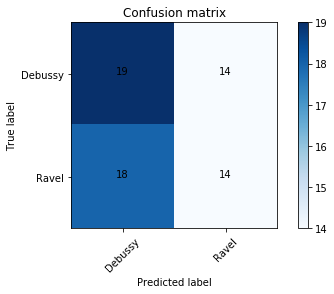

LinearSVC
[[19 14]
 [18 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2629) & 0.6983 (0.3354)
n-gram range (1, 2)
[[19 14]
 [14 18]]


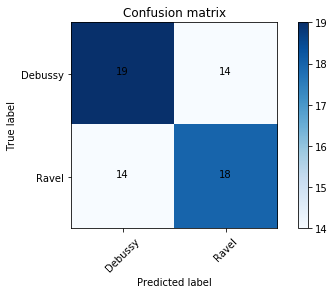

LinearSVC
[[19 14]
 [14 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.9333 (0.1405)
n-gram range (3, 4)
[[19 13]
 [17 13]]


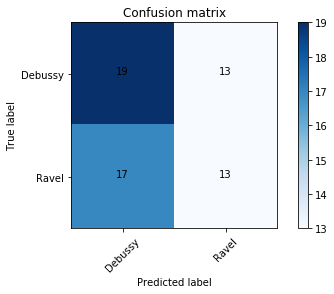

LinearSVC
[[19 13]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.322) & 0.72 (0.3795)
n-gram range (1, 4)
[[20 14]
 [16 18]]


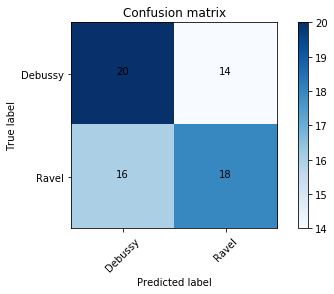

LinearSVC
[[20 14]
 [16 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.3162) & 0.9 (0.3162)

-----


n-gram range (1, 1)
[[18 10]
 [ 9 13]]


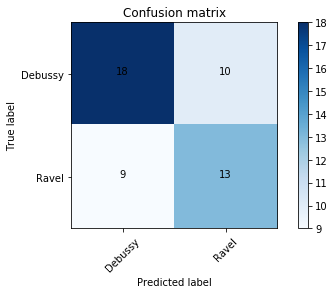

LinearSVC
[[18 10]
 [ 9 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2194) & 0.8067 (0.3118)
n-gram range (2, 2)
[[19 13]
 [16 14]]


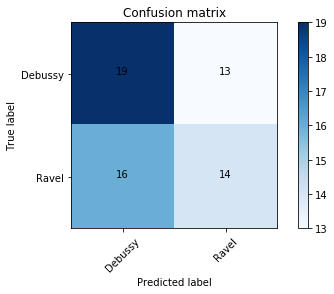

LinearSVC
[[19 13]
 [16 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.254) & 0.7383 (0.3403)
n-gram range (3, 3)
[[19 14]
 [18 14]]


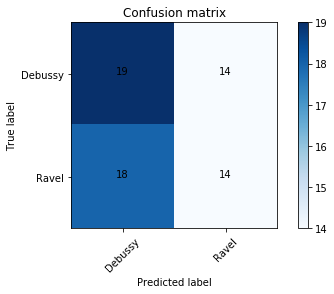

LinearSVC
[[19 14]
 [18 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2945) & 0.7233 (0.3596)
n-gram range (4, 4)
[[17 10]
 [11  9]]


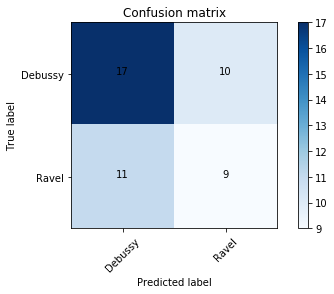

LinearSVC
[[17 10]
 [11  9]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7333 (0.2509) & 0.6383 (0.3291)
n-gram range (1, 2)
[[20 10]
 [11 15]]


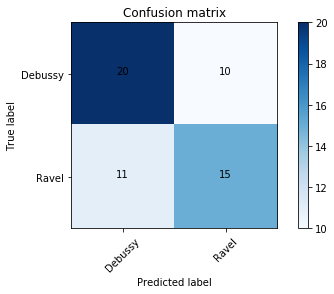

LinearSVC
[[20 10]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.94 (0.1897)
n-gram range (3, 4)
[[19 11]
 [15 11]]


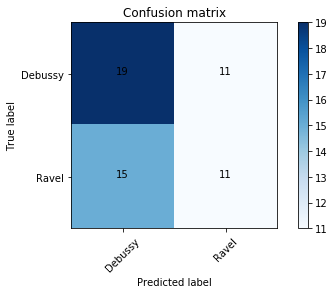

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.6783 (0.3419)
n-gram range (1, 4)
[[19 13]
 [14 16]]


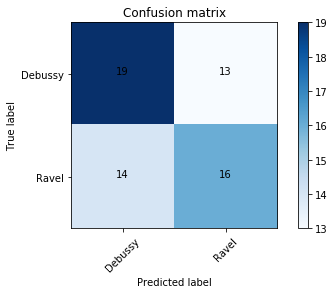

LinearSVC
[[19 13]
 [14 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.322) & 0.8667 (0.322)

-----


n-gram range (1, 1)
[[18 11]
 [ 9 15]]


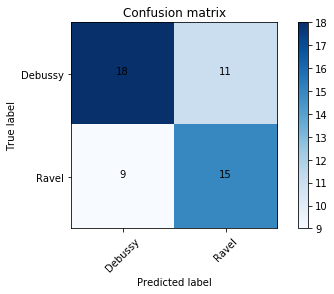

LinearSVC
[[18 11]
 [ 9 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.9333 (0.1405)
n-gram range (2, 2)
[[20 12]
 [16 14]]


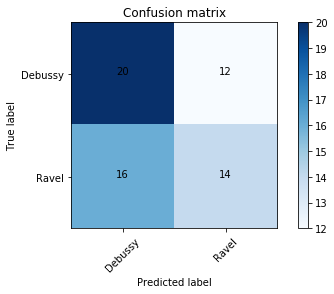

LinearSVC
[[20 12]
 [16 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.1995) & 0.78 (0.2966)
n-gram range (3, 3)
[[19 10]
 [14 10]]


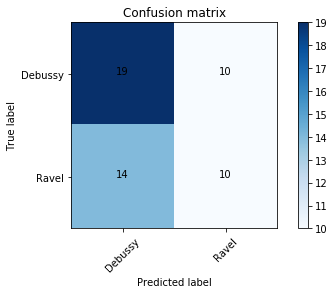

LinearSVC
[[19 10]
 [14 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.2257) & 0.62 (0.3282)
n-gram range (4, 4)
[[19 16]
 [19 17]]


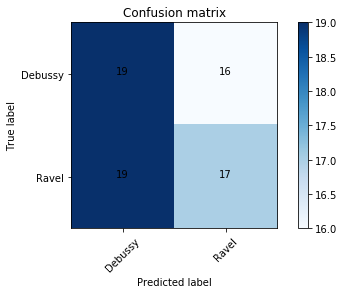

LinearSVC
[[19 16]
 [19 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2833) & 0.8167 (0.3162)
n-gram range (1, 2)
[[19  9]
 [ 9 13]]


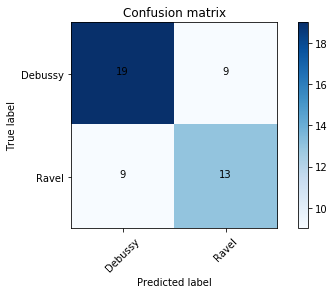

LinearSVC
[[19  9]
 [ 9 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.88 (0.253)
n-gram range (3, 4)
[[19 13]
 [17 13]]


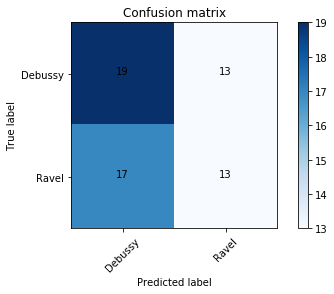

LinearSVC
[[19 13]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2945) & 0.7233 (0.3596)
n-gram range (1, 4)
[[19 13]
 [14 16]]


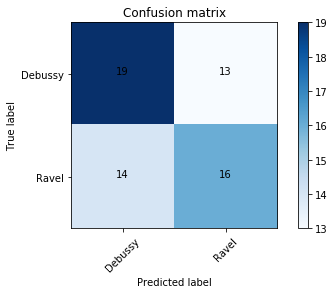

LinearSVC
[[19 13]
 [14 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.84 (0.2707)

-----


n-gram range (1, 1)
[[19 13]
 [13 17]]


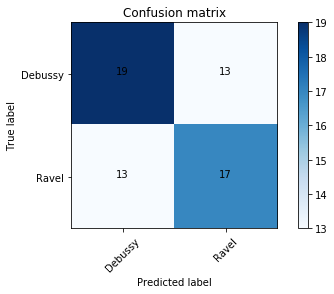

LinearSVC
[[19 13]
 [13 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.9067 (0.2066)
n-gram range (2, 2)
[[20 12]
 [16 14]]


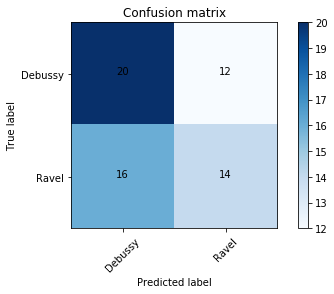

LinearSVC
[[20 12]
 [16 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.1721) & 0.7867 (0.286)
n-gram range (3, 3)
[[19 14]
 [18 14]]


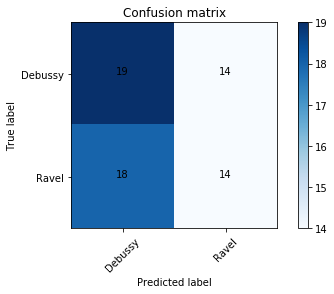

LinearSVC
[[19 14]
 [18 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.3443) & 0.7067 (0.3928)
n-gram range (4, 4)
[[19 15]
 [18 16]]


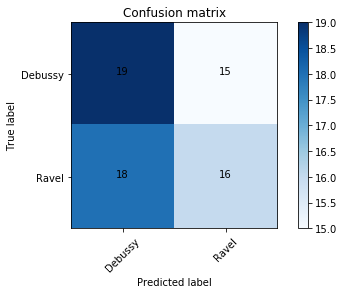

LinearSVC
[[19 15]
 [18 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2364) & 0.7067 (0.3239)
n-gram range (1, 2)
[[19  8]
 [ 8 12]]


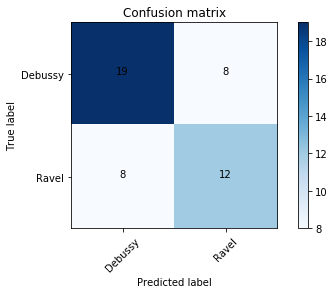

LinearSVC
[[19  8]
 [ 8 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.88 (0.253)
n-gram range (3, 4)
[[19 13]
 [17 13]]


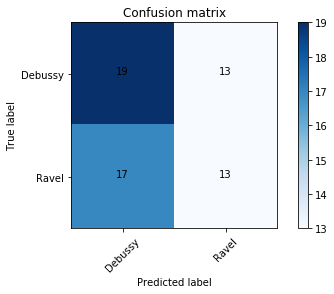

LinearSVC
[[19 13]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.705 (0.3279)
n-gram range (1, 4)
[[19  8]
 [ 8 12]]


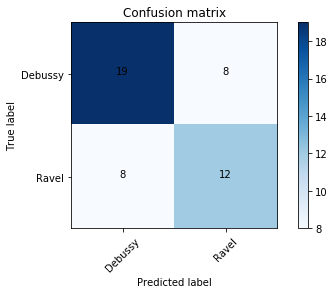

LinearSVC
[[19  8]
 [ 8 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.88 (0.253)

-----


n-gram range (1, 1)
[[18  7]
 [ 5 11]]


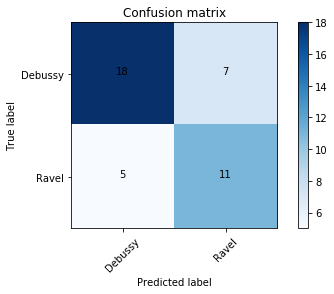

LinearSVC
[[18  7]
 [ 5 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)
n-gram range (2, 2)
[[20 13]
 [16 16]]


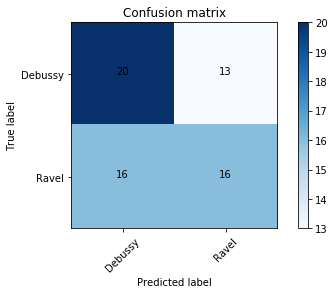

LinearSVC
[[20 13]
 [16 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2194) & 0.8333 (0.2833)
n-gram range (3, 3)
[[19 12]
 [16 12]]


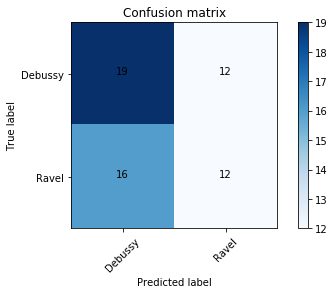

LinearSVC
[[19 12]
 [16 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.2257) & 0.6467 (0.319)
n-gram range (4, 4)
[[19 11]
 [14 12]]


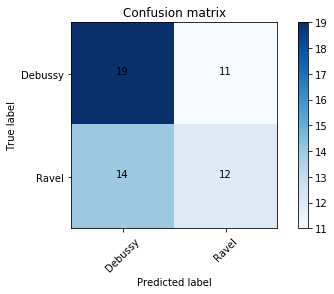

LinearSVC
[[19 11]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.254) & 0.7383 (0.3403)
n-gram range (1, 2)
[[19 11]
 [11 15]]


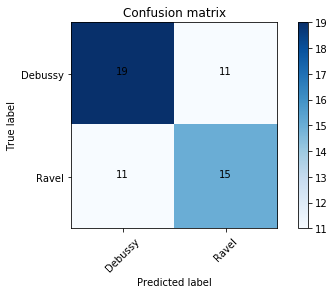

LinearSVC
[[19 11]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.9 (0.225)
n-gram range (3, 4)
[[19 11]
 [14 12]]


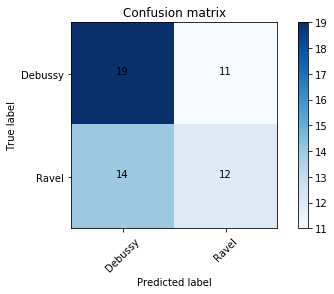

LinearSVC
[[19 11]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.1995) & 0.72 (0.3076)
n-gram range (1, 4)
[[18 10]
 [10 12]]


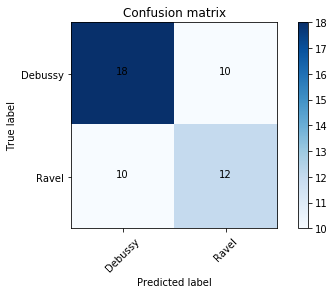

LinearSVC
[[18 10]
 [10 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2222) & 0.7467 (0.3278)

-----


n-gram range (1, 1)
[[18  8]
 [ 8 10]]


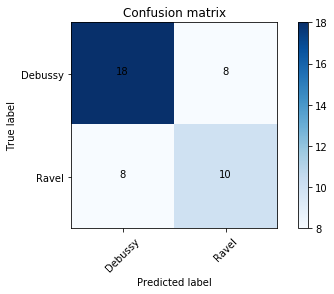

LinearSVC
[[18  8]
 [ 8 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2331) & 0.805 (0.3166)
n-gram range (2, 2)
[[19 11]
 [14 12]]


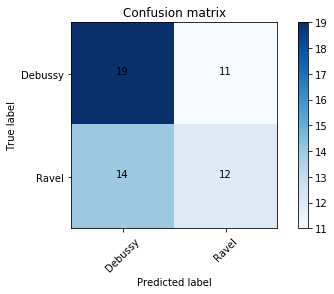

LinearSVC
[[19 11]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.1995) & 0.72 (0.3076)
n-gram range (3, 3)
[[19 14]
 [18 14]]


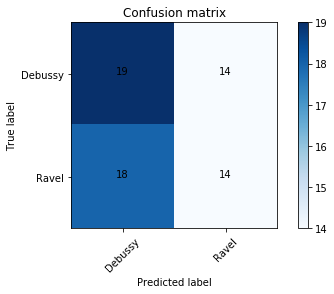

LinearSVC
[[19 14]
 [18 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.3622) & 0.6983 (0.4023)
n-gram range (4, 4)
[[19 12]
 [14 14]]


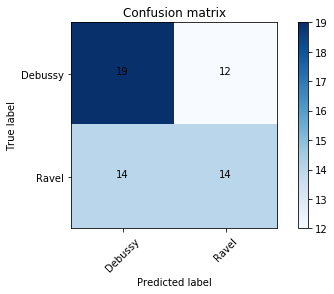

LinearSVC
[[19 12]
 [14 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.1995) & 0.78 (0.2966)
n-gram range (1, 2)
[[19 12]
 [12 16]]


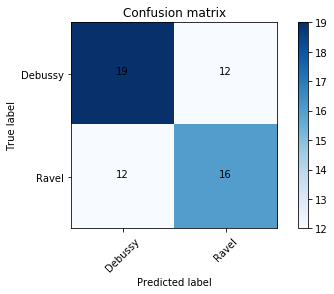

LinearSVC
[[19 12]
 [12 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)
n-gram range (3, 4)
[[19 11]
 [15 11]]


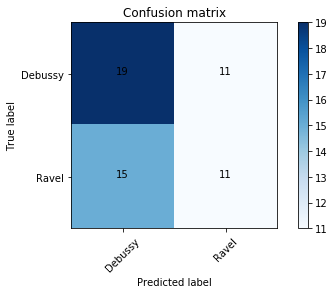

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2629) & 0.6717 (0.3485)
n-gram range (1, 4)
[[17  6]
 [ 4  8]]


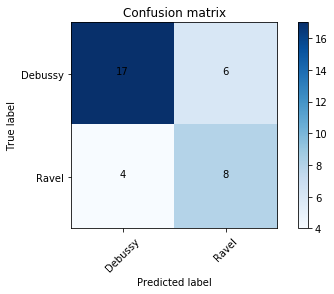

LinearSVC
[[17  6]
 [ 4  8]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.1721) & 0.76 (0.3098)

-----


n-gram range (1, 1)
[[19 11]
 [10 16]]


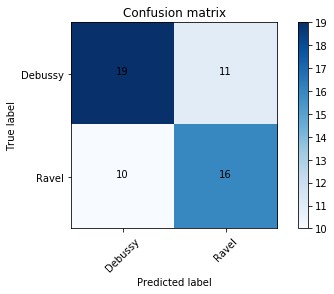

LinearSVC
[[19 11]
 [10 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.9667 (0.1054)
n-gram range (2, 2)
[[20 13]
 [17 15]]


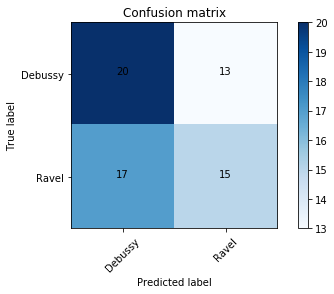

LinearSVC
[[20 13]
 [17 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2722) & 0.7917 (0.3362)
n-gram range (3, 3)
[[19 11]
 [14 12]]


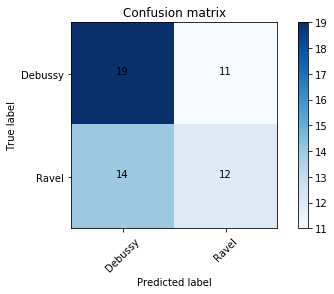

LinearSVC
[[19 11]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.254) & 0.7383 (0.3403)
n-gram range (4, 4)
[[19 14]
 [16 16]]


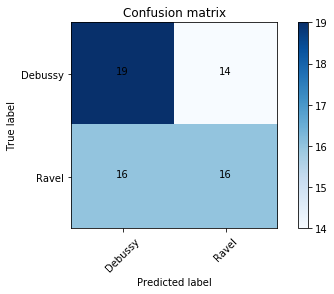

LinearSVC
[[19 14]
 [16 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2331) & 0.8317 (0.2887)
n-gram range (1, 2)
[[19 14]
 [14 18]]


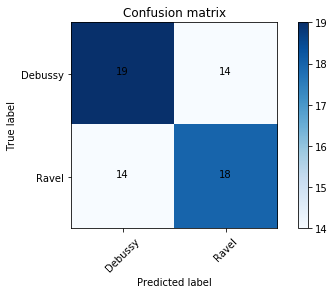

LinearSVC
[[19 14]
 [14 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)
n-gram range (3, 4)
[[19 13]
 [17 13]]


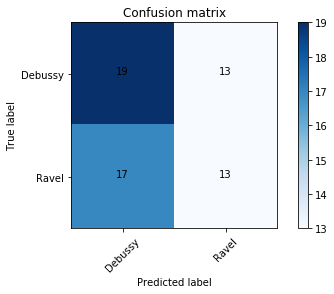

LinearSVC
[[19 13]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2945) & 0.7233 (0.3596)
n-gram range (1, 4)
[[19 13]
 [13 17]]


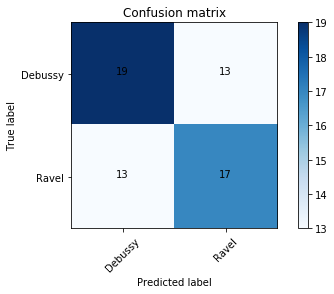

LinearSVC
[[19 13]
 [13 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.88 (0.253)

-----


n-gram range (1, 1)
[[18 10]
 [ 8 14]]


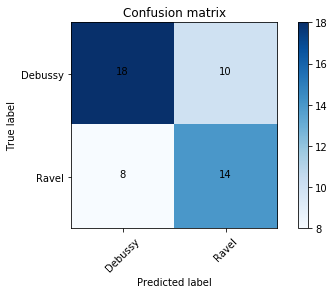

LinearSVC
[[18 10]
 [ 8 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)
n-gram range (2, 2)
[[19 11]
 [14 12]]


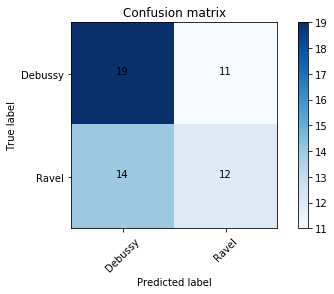

LinearSVC
[[19 11]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2194) & 0.6867 (0.3312)
n-gram range (3, 3)
[[19 12]
 [16 12]]


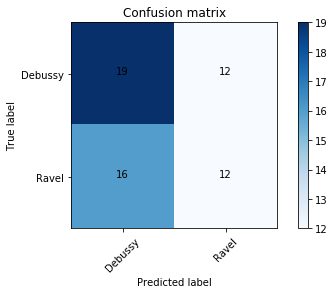

LinearSVC
[[19 12]
 [16 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2629) & 0.6717 (0.3485)
n-gram range (4, 4)
[[19 14]
 [17 15]]


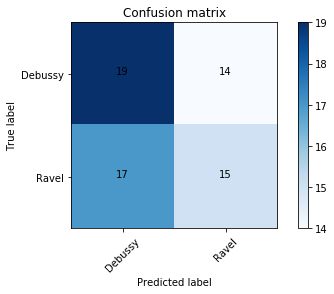

LinearSVC
[[19 14]
 [17 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2699) & 0.7317 (0.3482)
n-gram range (1, 2)
[[19  9]
 [ 9 13]]


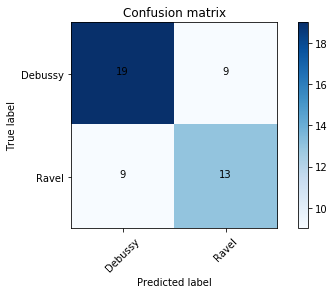

LinearSVC
[[19  9]
 [ 9 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.88 (0.253)
n-gram range (3, 4)
[[19 15]
 [19 15]]


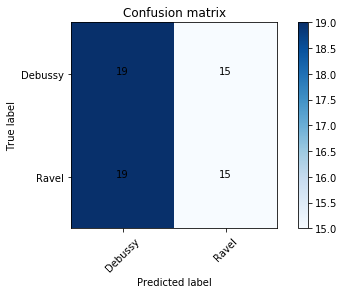

LinearSVC
[[19 15]
 [19 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7333 (0.3352) & 0.6467 (0.3888)
n-gram range (1, 4)
[[19 11]
 [11 15]]


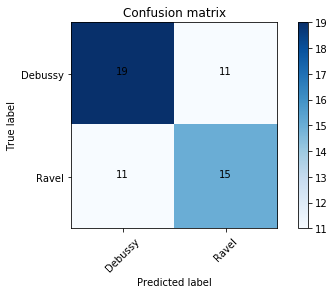

LinearSVC
[[19 11]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.2108) & 0.925 (0.2372)

-----


n-gram range (1, 1)
[[17 11]
 [ 8 14]]


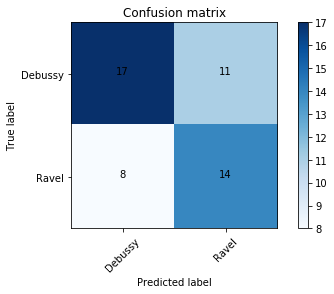

LinearSVC
[[17 11]
 [ 8 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.8133 (0.3011)
n-gram range (2, 2)
[[20 10]
 [14 12]]


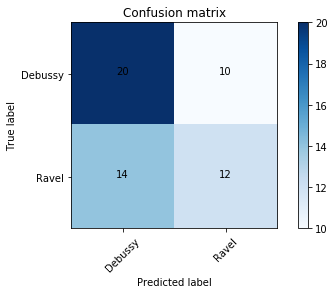

LinearSVC
[[20 10]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.1995) & 0.7533 (0.319)
n-gram range (3, 3)
[[19 12]
 [16 12]]


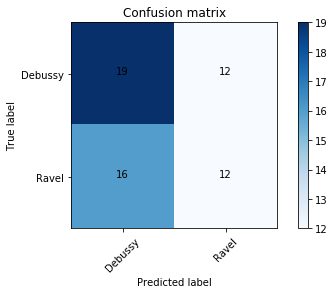

LinearSVC
[[19 12]
 [16 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.2257) & 0.62 (0.3282)
n-gram range (4, 4)
[[19 11]
 [13 13]]


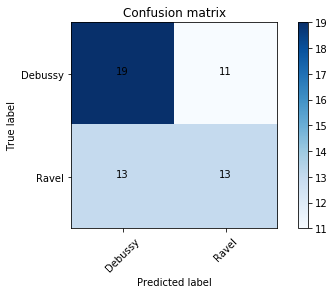

LinearSVC
[[19 11]
 [13 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2222) & 0.7467 (0.3278)
n-gram range (1, 2)
[[18 14]
 [13 17]]


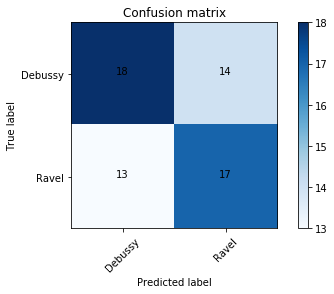

LinearSVC
[[18 14]
 [13 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.8667 (0.2331)
n-gram range (3, 4)
[[19 11]
 [14 12]]


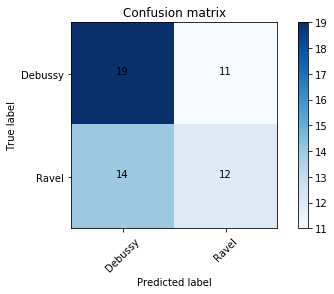

LinearSVC
[[19 11]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.3338) & 0.7133 (0.3862)
n-gram range (1, 4)
[[19 11]
 [11 15]]


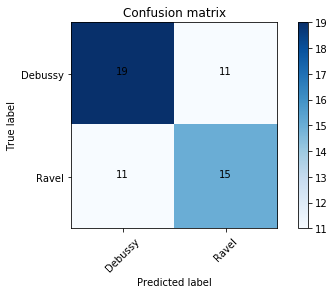

LinearSVC
[[19 11]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)

-----


n-gram range (1, 1)
[[20 12]
 [12 18]]


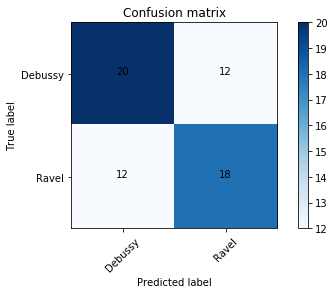

LinearSVC
[[20 12]
 [12 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
1.0 (0.0) & 1.0 (0.0)
n-gram range (2, 2)
[[20 14]
 [18 16]]


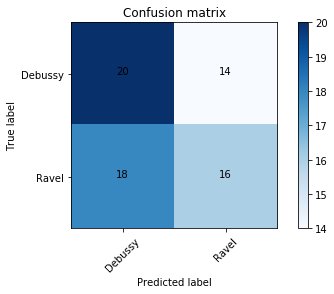

LinearSVC
[[20 14]
 [18 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2222) & 0.7467 (0.3278)
n-gram range (3, 3)
[[19  9]
 [13  9]]


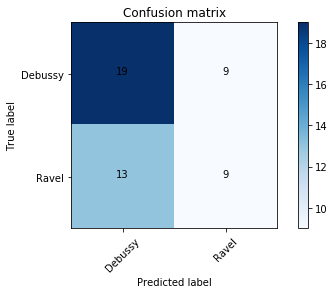

LinearSVC
[[19  9]
 [13  9]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2108) & 0.6267 (0.3223)
n-gram range (4, 4)
[[17 12]
 [13 11]]


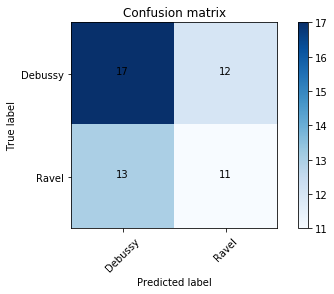

LinearSVC
[[17 12]
 [13 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.3162) & 0.715 (0.3705)
n-gram range (1, 2)
[[19 14]
 [14 18]]


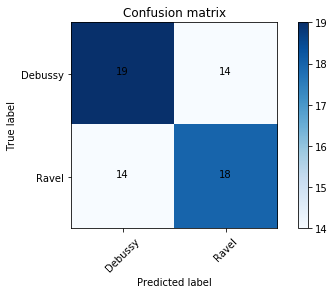

LinearSVC
[[19 14]
 [14 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)
n-gram range (3, 4)
[[19  9]
 [13  9]]


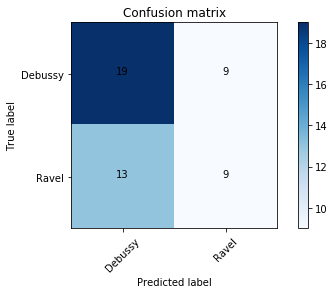

LinearSVC
[[19  9]
 [13  9]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.2257) & 0.62 (0.3282)
n-gram range (1, 4)
[[19  8]
 [ 8 12]]


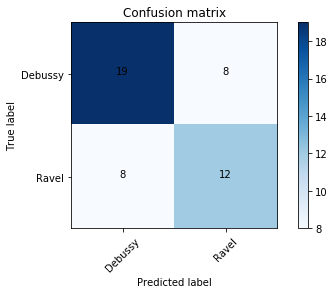

LinearSVC
[[19  8]
 [ 8 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)

-----


n-gram range (1, 1)
[[19 10]
 [10 14]]


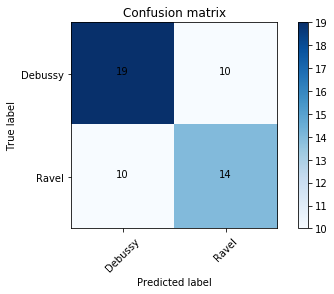

LinearSVC
[[19 10]
 [10 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.9067 (0.2066)
n-gram range (2, 2)
[[20  9]
 [13 11]]


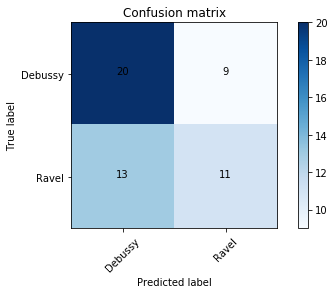

LinearSVC
[[20  9]
 [13 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.1995) & 0.7533 (0.319)
n-gram range (3, 3)
[[19  8]
 [12  8]]


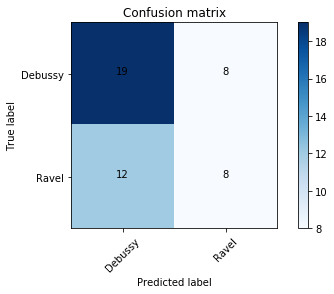

LinearSVC
[[19  8]
 [12  8]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2108) & 0.6267 (0.3223)
n-gram range (4, 4)
[[19 11]
 [14 12]]


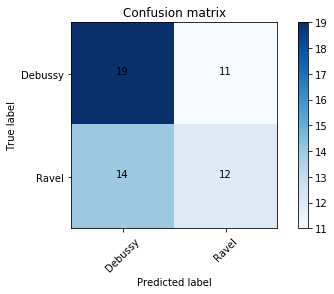

LinearSVC
[[19 11]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.1995) & 0.6933 (0.3239)
n-gram range (1, 2)
[[18 11]
 [10 14]]


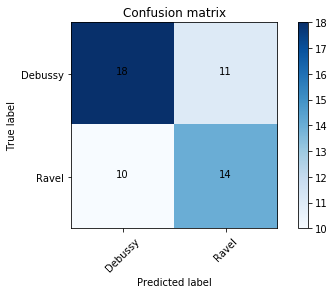

LinearSVC
[[18 11]
 [10 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.84 (0.2707)
n-gram range (3, 4)
[[19 12]
 [16 12]]


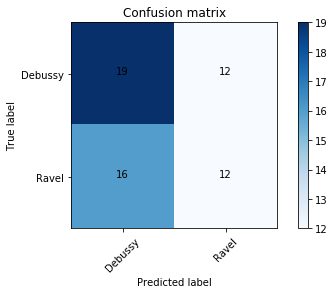

LinearSVC
[[19 12]
 [16 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.3263) & 0.6533 (0.3834)
n-gram range (1, 4)
[[17 13]
 [11 15]]


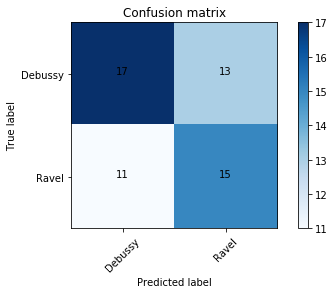

LinearSVC
[[17 13]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.1721) & 0.7867 (0.286)

-----


n-gram range (1, 1)
[[18  9]
 [ 8 12]]


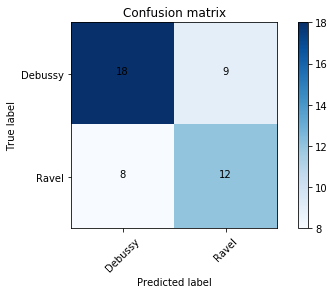

LinearSVC
[[18  9]
 [ 8 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.84 (0.2707)
n-gram range (2, 2)
[[19 14]
 [17 15]]


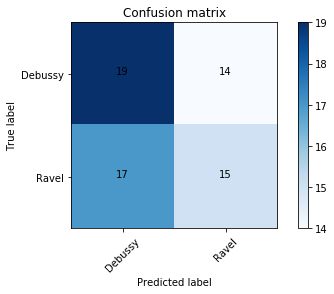

LinearSVC
[[19 14]
 [17 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2194) & 0.7133 (0.3159)
n-gram range (3, 3)
[[18  7]
 [10  6]]


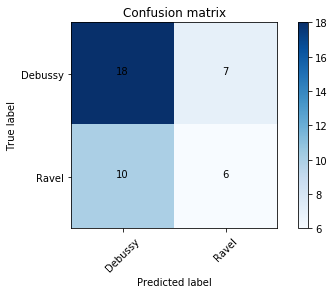

LinearSVC
[[18  7]
 [10  6]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7167 (0.2086) & 0.56 (0.305)
n-gram range (4, 4)
[[19  9]
 [12 10]]


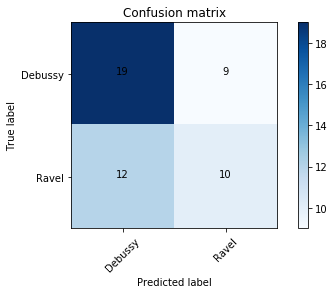

LinearSVC
[[19  9]
 [12 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.1995) & 0.6933 (0.3239)
n-gram range (1, 2)
[[20 11]
 [12 16]]


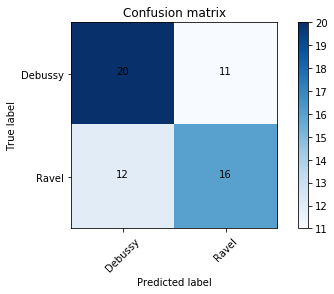

LinearSVC
[[20 11]
 [12 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.95 (0.1581) & 0.9333 (0.2108)
n-gram range (3, 4)
[[19 12]
 [16 12]]


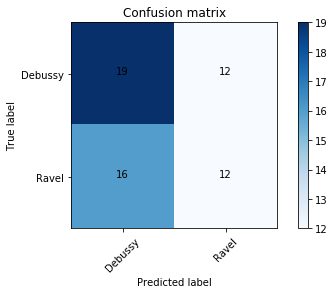

LinearSVC
[[19 12]
 [16 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7333 (0.3352) & 0.6467 (0.3888)
n-gram range (1, 4)
[[21 13]
 [13 15]]


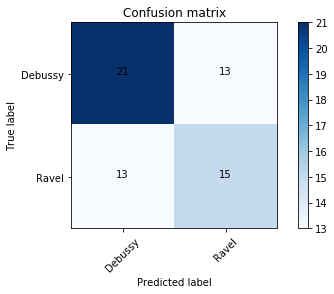

LinearSVC
[[21 13]
 [13 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)

-----


n-gram range (1, 1)
[[19  8]
 [ 7 13]]


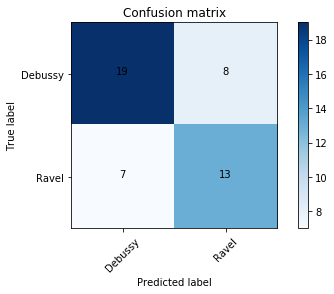

LinearSVC
[[19  8]
 [ 7 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.95 (0.1581) & 0.9333 (0.2108)
n-gram range (2, 2)
[[20 13]
 [17 15]]


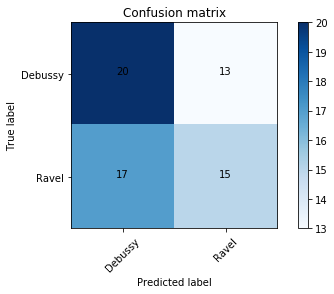

LinearSVC
[[20 13]
 [17 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.1995) & 0.78 (0.2966)
n-gram range (3, 3)
[[19 12]
 [16 12]]


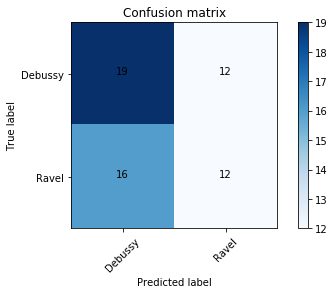

LinearSVC
[[19 12]
 [16 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2331) & 0.7117 (0.3201)
n-gram range (4, 4)
[[19 11]
 [14 12]]


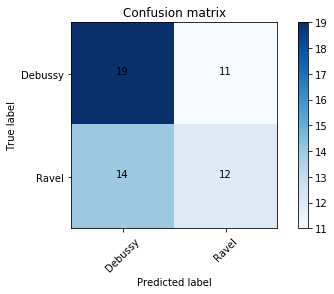

LinearSVC
[[19 11]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2194) & 0.7133 (0.3159)
n-gram range (1, 2)
[[19 14]
 [15 17]]


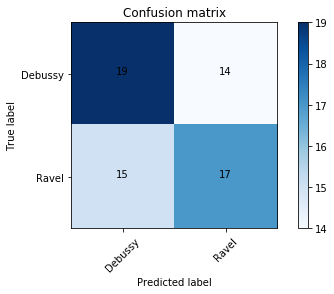

LinearSVC
[[19 14]
 [15 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.2491) & 0.8583 (0.2993)
n-gram range (3, 4)
[[20 10]
 [14 12]]


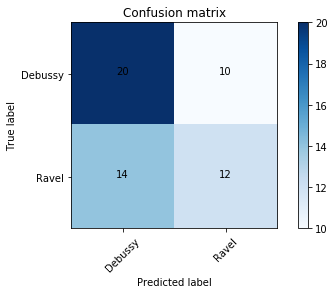

LinearSVC
[[20 10]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2222) & 0.7467 (0.3278)
n-gram range (1, 4)
[[19 11]
 [11 15]]


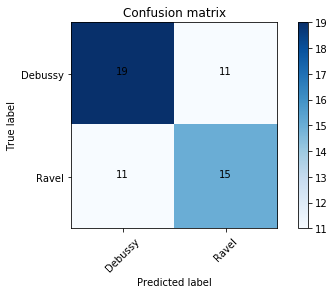

LinearSVC
[[19 11]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.9067 (0.2066)

-----


n-gram range (1, 1)
[[18 12]
 [12 14]]


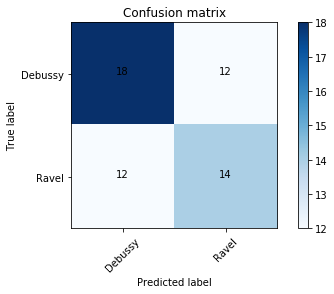

LinearSVC
[[18 12]
 [12 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.254) & 0.825 (0.3003)
n-gram range (2, 2)
[[20 14]
 [18 16]]


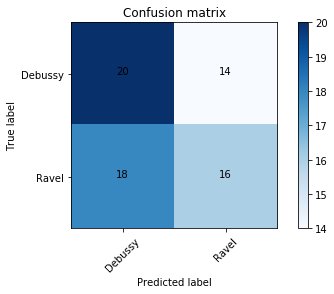

LinearSVC
[[20 14]
 [18 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.1721) & 0.76 (0.3098)
n-gram range (3, 3)
[[19 11]
 [15 11]]


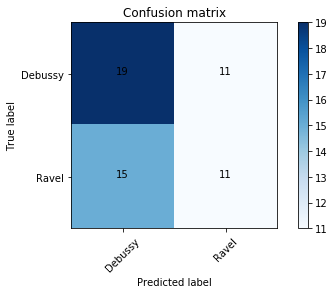

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2108) & 0.6533 (0.3124)
n-gram range (4, 4)
[[19 11]
 [14 12]]


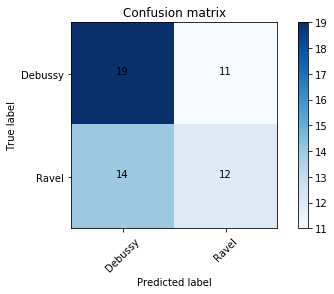

LinearSVC
[[19 11]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.254) & 0.7383 (0.3403)
n-gram range (1, 2)
[[19  9]
 [ 9 13]]


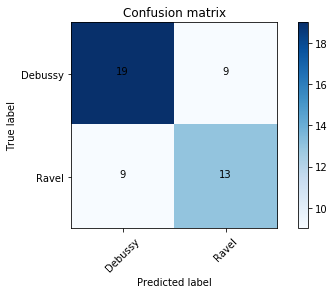

LinearSVC
[[19  9]
 [ 9 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.9067 (0.2066)
n-gram range (3, 4)
[[19 14]
 [18 14]]


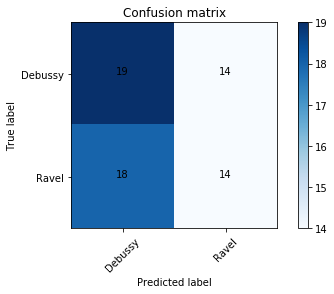

LinearSVC
[[19 14]
 [18 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2629) & 0.6983 (0.3354)
n-gram range (1, 4)
[[19 11]
 [11 15]]


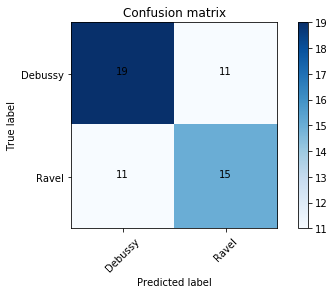

LinearSVC
[[19 11]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.9067 (0.2066)

-----


n-gram range (1, 1)
[[18 11]
 [ 9 15]]


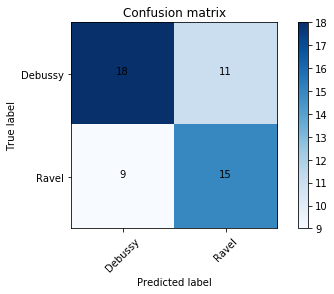

LinearSVC
[[18 11]
 [ 9 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.9 (0.225)
n-gram range (2, 2)
[[19 11]
 [14 12]]


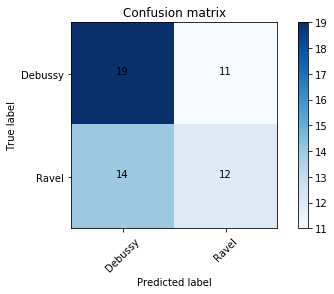

LinearSVC
[[19 11]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2194) & 0.6867 (0.3312)
n-gram range (3, 3)
[[19 11]
 [15 11]]


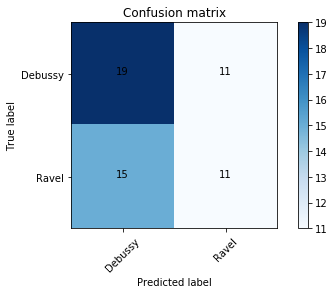

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.6783 (0.3419)
n-gram range (4, 4)
[[19 15]
 [19 15]]


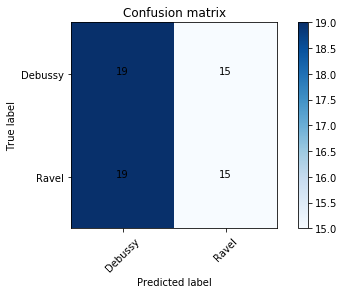

LinearSVC
[[19 15]
 [19 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7333 (0.3352) & 0.6733 (0.379)
n-gram range (1, 2)
[[18  7]
 [ 6 10]]


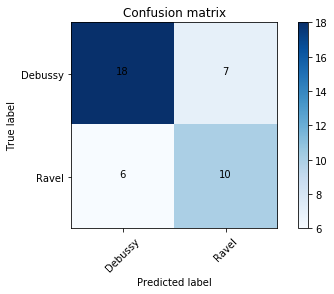

LinearSVC
[[18  7]
 [ 6 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.8133 (0.3011)
n-gram range (3, 4)
[[19 14]
 [18 14]]


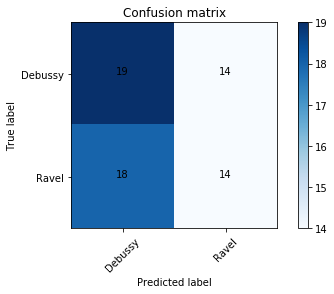

LinearSVC
[[19 14]
 [18 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2629) & 0.6983 (0.3354)
n-gram range (1, 4)
[[18  6]
 [ 5  9]]


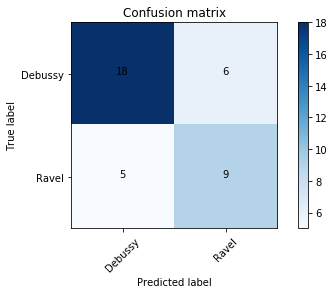

LinearSVC
[[18  6]
 [ 5  9]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.8133 (0.3011)

-----


n-gram range (1, 1)
[[22 18]
 [19 21]]


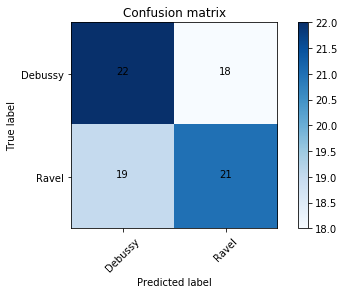

LinearSVC
[[22 18]
 [19 21]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.9667 (0.1054)
n-gram range (2, 2)
[[20 11]
 [15 13]]


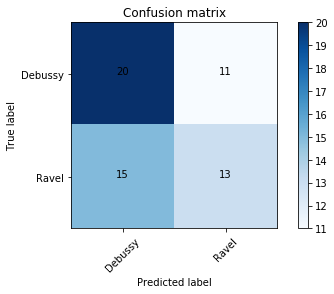

LinearSVC
[[20 11]
 [15 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2222) & 0.7467 (0.3278)
n-gram range (3, 3)
[[19 10]
 [14 10]]


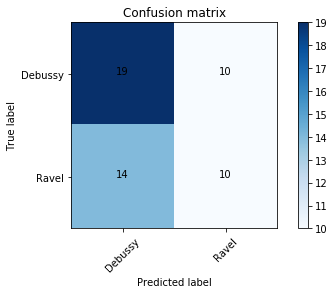

LinearSVC
[[19 10]
 [14 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.6783 (0.3419)
n-gram range (4, 4)
[[19 13]
 [16 14]]


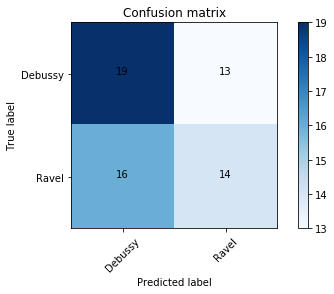

LinearSVC
[[19 13]
 [16 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.254) & 0.765 (0.3207)
n-gram range (1, 2)
[[19 11]
 [11 15]]


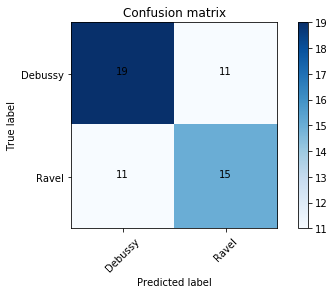

LinearSVC
[[19 11]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)
n-gram range (3, 4)
[[19 15]
 [19 15]]


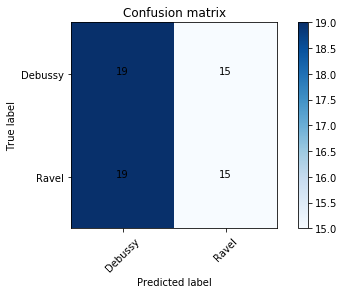

LinearSVC
[[19 15]
 [19 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2811) & 0.7567 (0.334)
n-gram range (1, 4)
[[18 13]
 [12 16]]


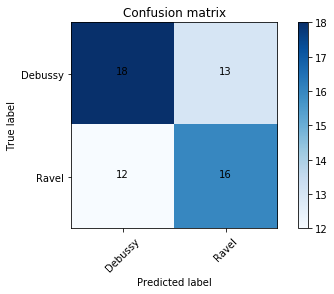

LinearSVC
[[18 13]
 [12 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.8667 (0.2331)

-----


n-gram range (1, 1)
[[19 10]
 [ 9 15]]


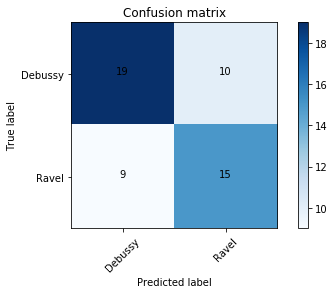

LinearSVC
[[19 10]
 [ 9 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.94 (0.1897)
n-gram range (2, 2)
[[20 11]
 [15 13]]


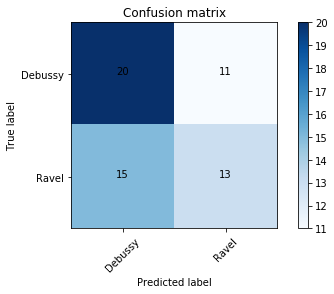

LinearSVC
[[20 11]
 [15 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.2415) & 0.74 (0.3362)
n-gram range (3, 3)
[[19 11]
 [15 11]]


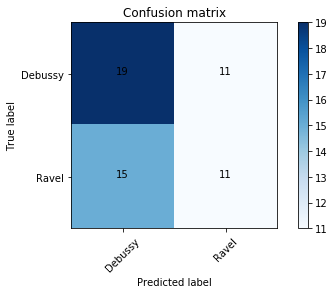

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2108) & 0.6533 (0.3124)
n-gram range (4, 4)
[[17 11]
 [12 10]]


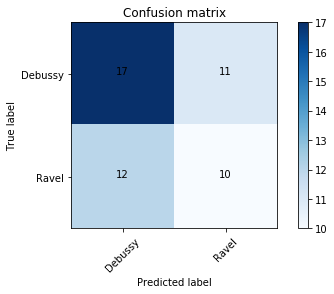

LinearSVC
[[17 11]
 [12 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7333 (0.2509) & 0.6383 (0.3291)
n-gram range (1, 2)
[[20 16]
 [15 17]]


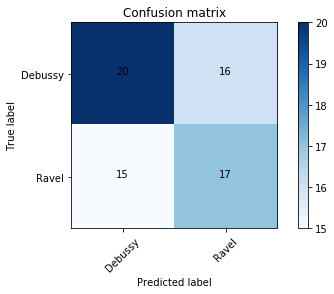

LinearSVC
[[20 16]
 [15 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.161) & 0.8467 (0.2573)
n-gram range (3, 4)
[[19 11]
 [15 11]]


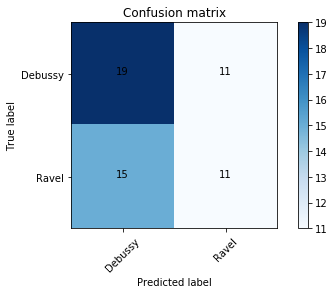

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.6783 (0.3419)
n-gram range (1, 4)
[[20 15]
 [14 16]]


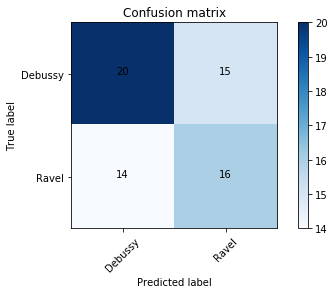

LinearSVC
[[20 15]
 [14 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2194) & 0.8067 (0.3118)

-----


n-gram range (1, 1)
[[19 12]
 [11 17]]


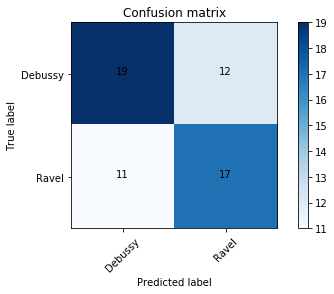

LinearSVC
[[19 12]
 [11 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.94 (0.1897)
n-gram range (2, 2)
[[20 14]
 [18 16]]


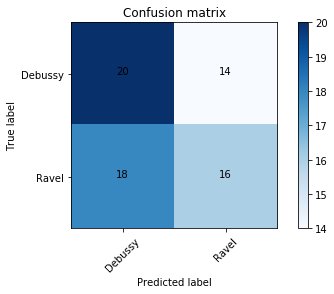

LinearSVC
[[20 14]
 [18 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.254) & 0.7983 (0.3266)
n-gram range (3, 3)
[[19  8]
 [12  8]]


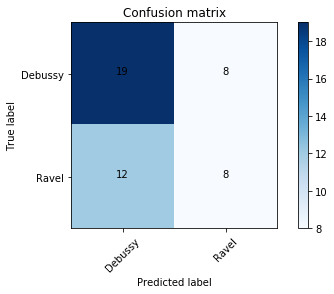

LinearSVC
[[19  8]
 [12  8]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.1933) & 0.6333 (0.3162)
n-gram range (4, 4)
[[19 12]
 [15 13]]


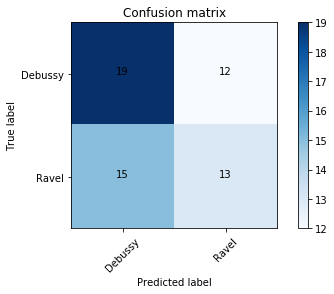

LinearSVC
[[19 12]
 [15 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2364) & 0.7067 (0.3239)
n-gram range (1, 2)
[[18 13]
 [12 16]]


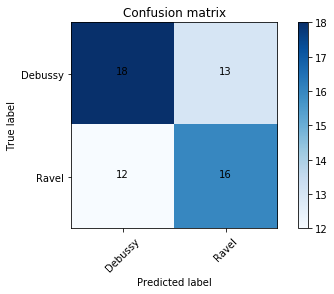

LinearSVC
[[18 13]
 [12 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2194) & 0.8067 (0.3118)
n-gram range (3, 4)
[[19 15]
 [19 15]]


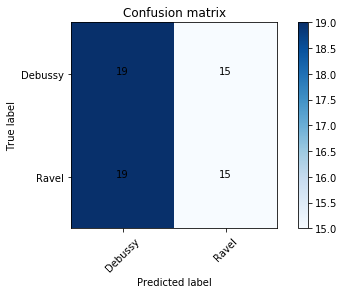

LinearSVC
[[19 15]
 [19 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7333 (0.3352) & 0.6733 (0.379)
n-gram range (1, 4)
[[18 11]
 [11 13]]


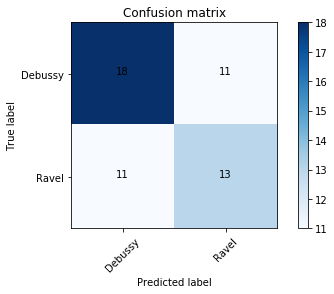

LinearSVC
[[18 11]
 [11 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2331) & 0.8317 (0.2887)

-----


n-gram range (1, 1)
[[20 14]
 [14 20]]


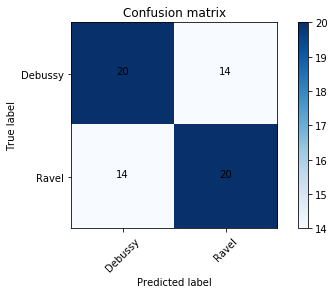

LinearSVC
[[20 14]
 [14 20]]
micro-averaged f-score (std) & macro-averaged f-score (std)
1.0 (0.0) & 1.0 (0.0)
n-gram range (2, 2)
[[19 13]
 [16 14]]


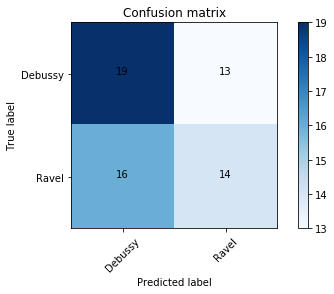

LinearSVC
[[19 13]
 [16 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.254) & 0.7383 (0.3403)
n-gram range (3, 3)
[[20 15]
 [20 16]]


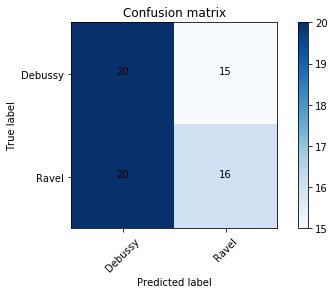

LinearSVC
[[20 15]
 [20 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.254) & 0.7383 (0.3403)
n-gram range (4, 4)
[[19 11]
 [14 12]]


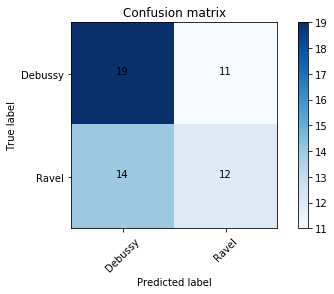

LinearSVC
[[19 11]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.1995) & 0.72 (0.3076)
n-gram range (1, 2)
[[19  8]
 [ 8 12]]


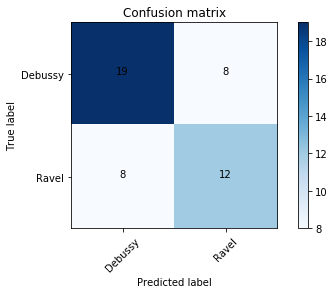

LinearSVC
[[19  8]
 [ 8 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)
n-gram range (3, 4)
[[19 10]
 [14 10]]


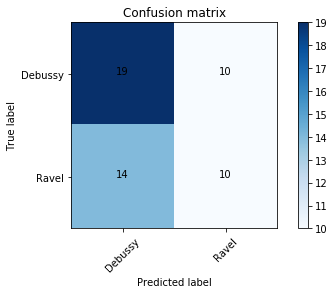

LinearSVC
[[19 10]
 [14 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.3162) & 0.66 (0.3777)
n-gram range (1, 4)
[[19 10]
 [11 13]]


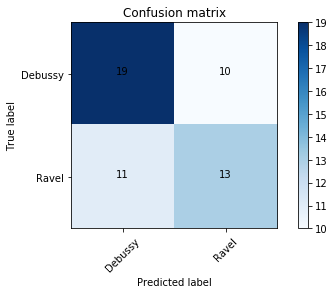

LinearSVC
[[19 10]
 [11 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.225) & 0.865 (0.2868)

-----


n-gram range (1, 1)
[[21 17]
 [16 20]]


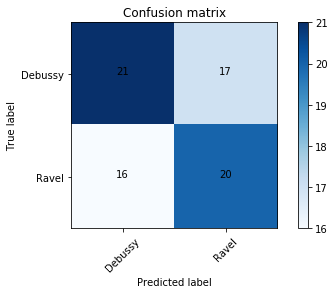

LinearSVC
[[21 17]
 [16 20]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.95 (0.1581) & 0.9333 (0.2108)
n-gram range (2, 2)
[[20 10]
 [13 13]]


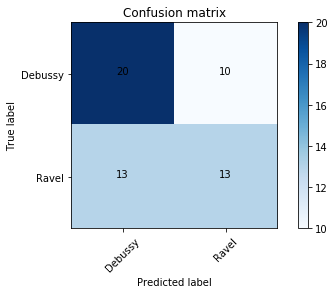

LinearSVC
[[20 10]
 [13 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.8133 (0.3011)
n-gram range (3, 3)
[[18 12]
 [15 11]]


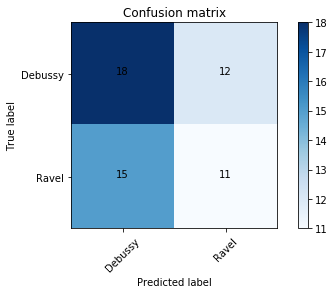

LinearSVC
[[18 12]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7167 (0.3148) & 0.62 (0.3639)
n-gram range (4, 4)
[[19 12]
 [15 13]]


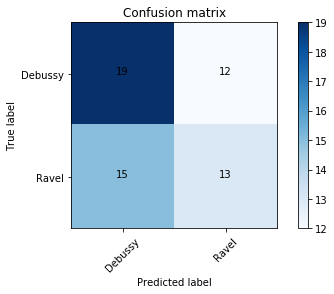

LinearSVC
[[19 12]
 [15 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2364) & 0.68 (0.3382)
n-gram range (1, 2)
[[19 11]
 [11 15]]


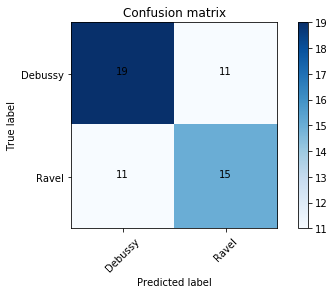

LinearSVC
[[19 11]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)
n-gram range (3, 4)
[[19 13]
 [17 13]]


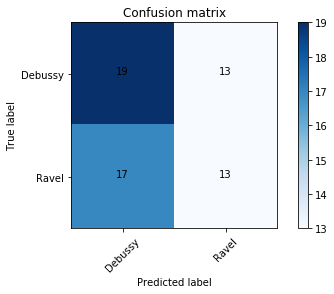

LinearSVC
[[19 13]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.3162) & 0.6867 (0.3666)
n-gram range (1, 4)
[[21 13]
 [13 15]]


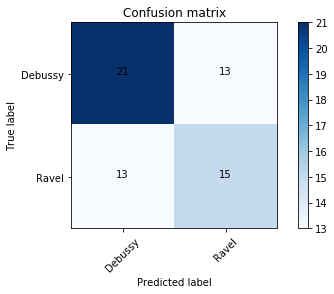

LinearSVC
[[21 13]
 [13 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.88 (0.253)

-----


n-gram range (1, 1)
[[19 11]
 [10 16]]


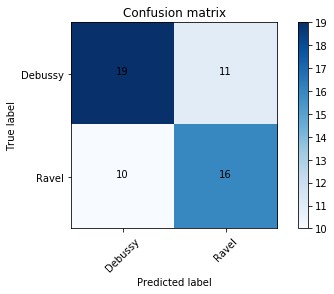

LinearSVC
[[19 11]
 [10 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.94 (0.1897)
n-gram range (2, 2)
[[20  9]
 [13 11]]


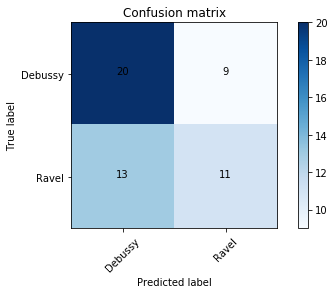

LinearSVC
[[20  9]
 [13 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.1721) & 0.76 (0.3098)
n-gram range (3, 3)
[[17 10]
 [11  9]]


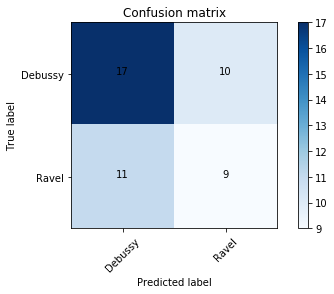

LinearSVC
[[17 10]
 [11  9]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.286) & 0.6633 (0.3584)
n-gram range (4, 4)
[[19 14]
 [16 16]]


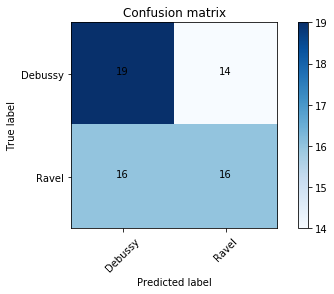

LinearSVC
[[19 14]
 [16 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.3239) & 0.8067 (0.3492)
n-gram range (1, 2)
[[20 13]
 [14 18]]


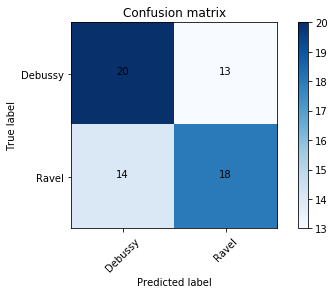

LinearSVC
[[20 13]
 [14 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.95 (0.1581) & 0.9333 (0.2108)
n-gram range (3, 4)
[[19 16]
 [20 16]]


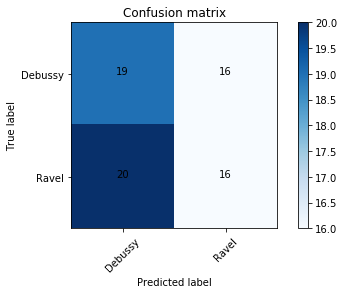

LinearSVC
[[19 16]
 [20 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.3689) & 0.7583 (0.3976)
n-gram range (1, 4)
[[19 17]
 [18 20]]


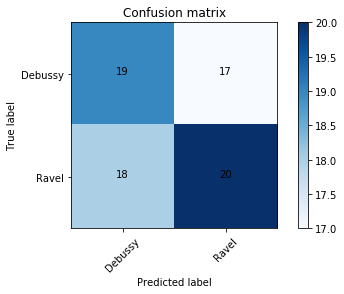

LinearSVC
[[19 17]
 [18 20]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.2491) & 0.8583 (0.2993)

-----


n-gram range (1, 1)
[[18 14]
 [15 15]]


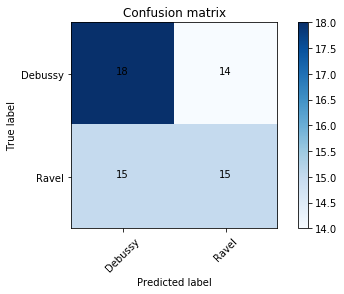

LinearSVC
[[18 14]
 [15 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2357) & 0.745 (0.332)
n-gram range (2, 2)
[[18 14]
 [16 14]]


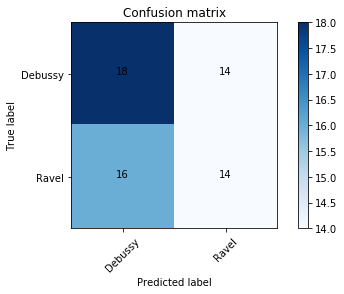

LinearSVC
[[18 14]
 [16 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2945) & 0.7233 (0.3596)
n-gram range (3, 3)
[[19 13]
 [17 13]]


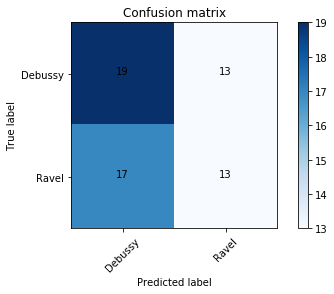

LinearSVC
[[19 13]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.705 (0.3279)
n-gram range (4, 4)
[[17  8]
 [ 8  8]]


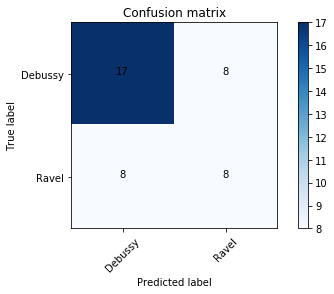

LinearSVC
[[17  8]
 [ 8  8]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2629) & 0.6717 (0.3485)
n-gram range (1, 2)
[[21 14]
 [14 16]]


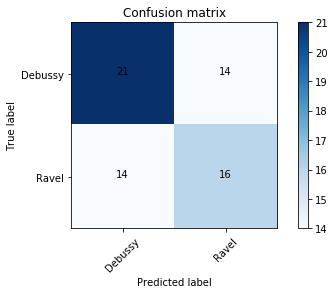

LinearSVC
[[21 14]
 [14 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)
n-gram range (3, 4)
[[18 13]
 [16 12]]


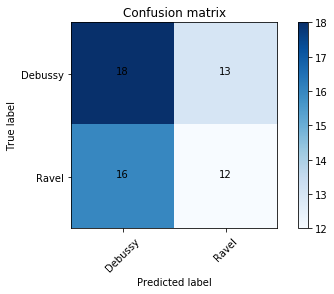

LinearSVC
[[18 13]
 [16 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7333 (0.2961) & 0.6567 (0.3644)
n-gram range (1, 4)
[[18 12]
 [11 15]]


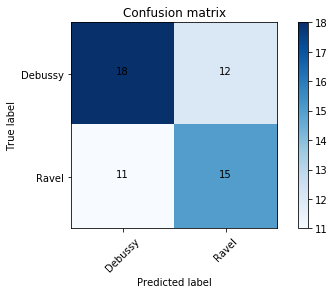

LinearSVC
[[18 12]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.84 (0.2707)

-----


n-gram range (1, 1)
[[19 14]
 [13 19]]


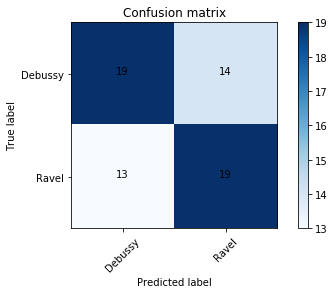

LinearSVC
[[19 14]
 [13 19]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.9667 (0.1054)
n-gram range (2, 2)
[[20 18]
 [23 19]]


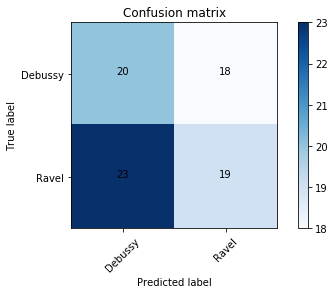

LinearSVC
[[20 18]
 [23 19]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.3375) & 0.8 (0.3583)
n-gram range (3, 3)
[[19 10]
 [13 11]]


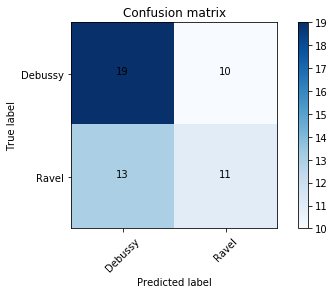

LinearSVC
[[19 10]
 [13 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.1995) & 0.72 (0.3076)
n-gram range (4, 4)
[[19 13]
 [16 14]]


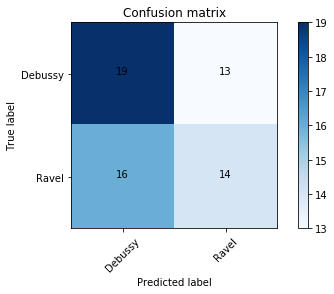

LinearSVC
[[19 13]
 [16 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.1995) & 0.7467 (0.2877)
n-gram range (1, 2)
[[19 14]
 [14 18]]


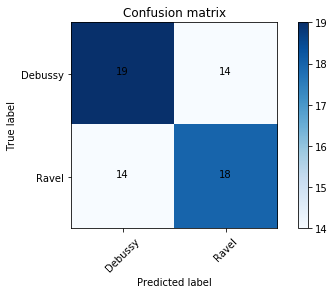

LinearSVC
[[19 14]
 [14 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.9 (0.225)
n-gram range (3, 4)
[[19  9]
 [13  9]]


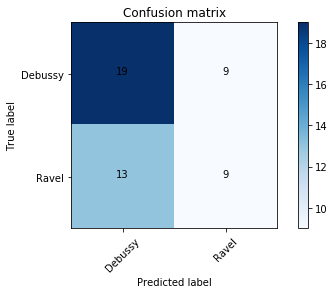

LinearSVC
[[19  9]
 [13  9]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.2257) & 0.62 (0.3282)
n-gram range (1, 4)
[[19 10]
 [10 14]]


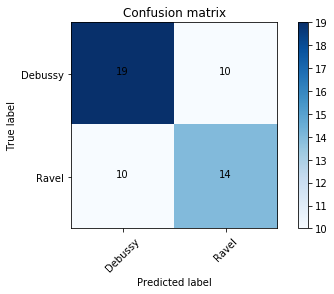

LinearSVC
[[19 10]
 [10 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.88 (0.253)

-----


n-gram range (1, 1)
[[19 11]
 [10 16]]


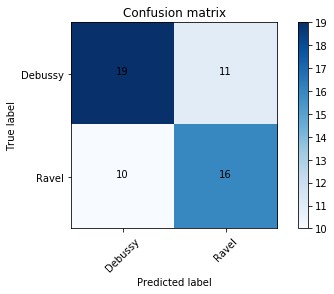

LinearSVC
[[19 11]
 [10 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.94 (0.1897)
n-gram range (2, 2)
[[19 11]
 [14 12]]


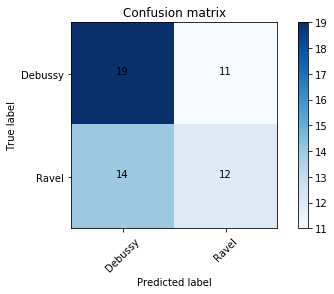

LinearSVC
[[19 11]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2194) & 0.7133 (0.3159)
n-gram range (3, 3)
[[19  9]
 [13  9]]


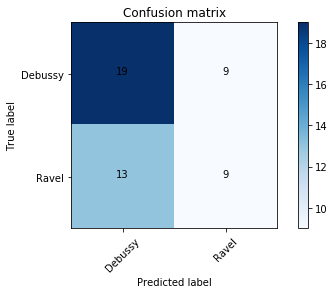

LinearSVC
[[19  9]
 [13  9]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2108) & 0.6267 (0.3223)
n-gram range (4, 4)
[[19 13]
 [16 14]]


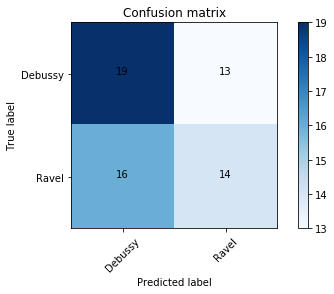

LinearSVC
[[19 13]
 [16 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2838) & 0.725 (0.3558)
n-gram range (1, 2)
[[19 11]
 [11 15]]


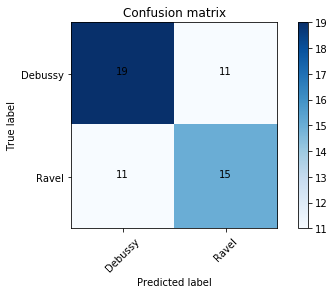

LinearSVC
[[19 11]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.9067 (0.2066)
n-gram range (3, 4)
[[19 13]
 [17 13]]


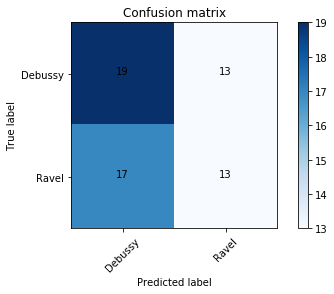

LinearSVC
[[19 13]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7333 (0.3352) & 0.6467 (0.3888)
n-gram range (1, 4)
[[19 13]
 [14 16]]


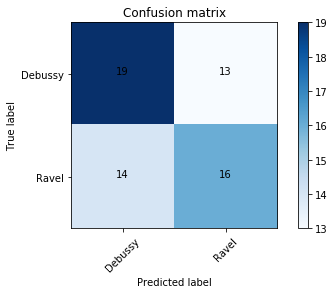

LinearSVC
[[19 13]
 [14 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.225) & 0.8917 (0.2486)

-----


n-gram range (1, 1)
[[19 16]
 [15 21]]


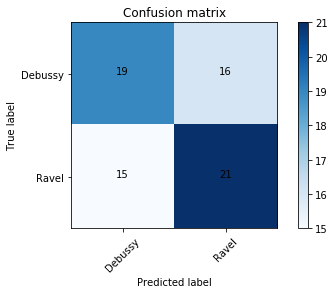

LinearSVC
[[19 16]
 [15 21]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.9667 (0.1054)
n-gram range (2, 2)
[[20 10]
 [14 12]]


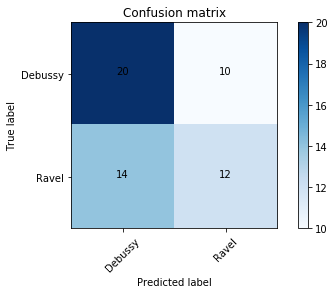

LinearSVC
[[20 10]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2222) & 0.7467 (0.3278)
n-gram range (3, 3)
[[20 10]
 [15 11]]


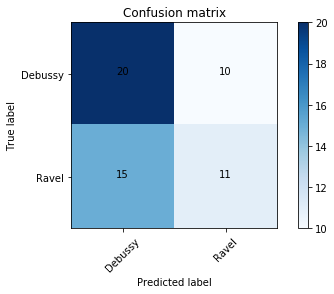

LinearSVC
[[20 10]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.1995) & 0.6933 (0.3239)
n-gram range (4, 4)
[[19 11]
 [14 12]]


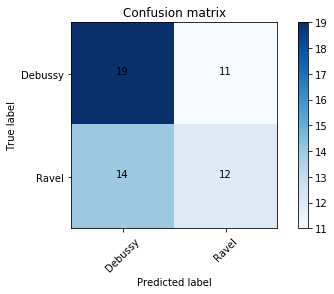

LinearSVC
[[19 11]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.254) & 0.7383 (0.3403)
n-gram range (1, 2)
[[18  9]
 [ 9 11]]


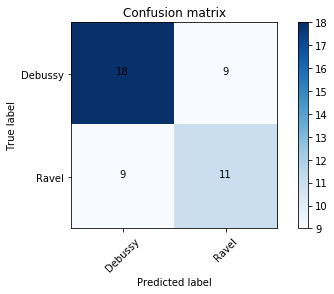

LinearSVC
[[18  9]
 [ 9 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.254) & 0.7983 (0.3266)
n-gram range (3, 4)
[[19 17]
 [21 17]]


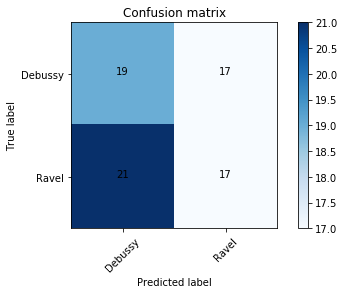

LinearSVC
[[19 17]
 [21 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7333 (0.4098) & 0.7067 (0.423)
n-gram range (1, 4)
[[18  8]
 [ 7 11]]


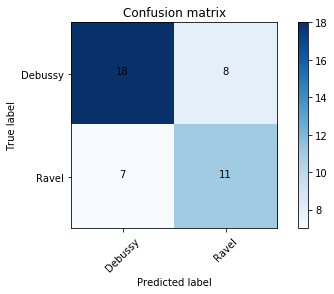

LinearSVC
[[18  8]
 [ 7 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.161) & 0.8467 (0.2573)

-----


n-gram range (1, 1)
[[17 13]
 [10 16]]


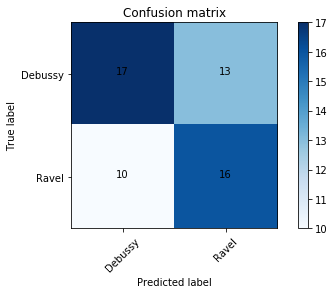

LinearSVC
[[17 13]
 [10 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.8667 (0.2331)
n-gram range (2, 2)
[[19 11]
 [14 12]]


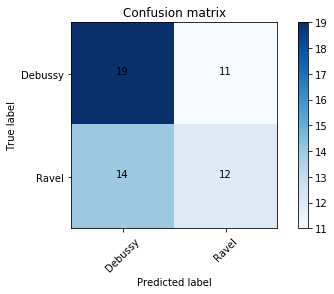

LinearSVC
[[19 11]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.254) & 0.7383 (0.3403)
n-gram range (3, 3)
[[19 14]
 [18 14]]


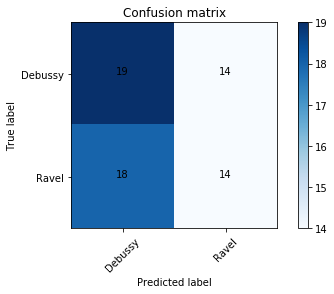

LinearSVC
[[19 14]
 [18 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.3063) & 0.7167 (0.3668)
n-gram range (4, 4)
[[18 14]
 [16 14]]


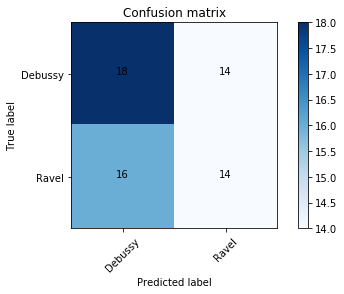

LinearSVC
[[18 14]
 [16 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.7317 (0.3108)
n-gram range (1, 2)
[[19 16]
 [17 19]]


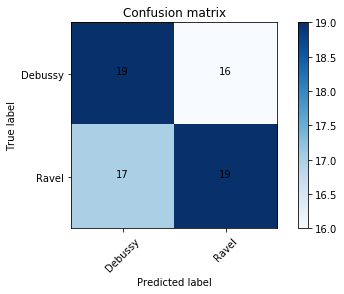

LinearSVC
[[19 16]
 [17 19]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.225) & 0.8917 (0.2486)
n-gram range (3, 4)
[[19 12]
 [16 12]]


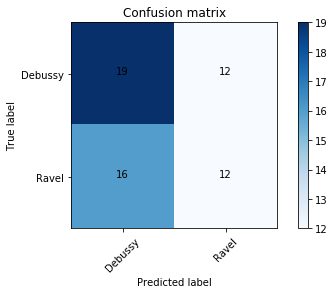

LinearSVC
[[19 12]
 [16 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.2257) & 0.6467 (0.319)
n-gram range (1, 4)
[[19  9]
 [ 9 13]]


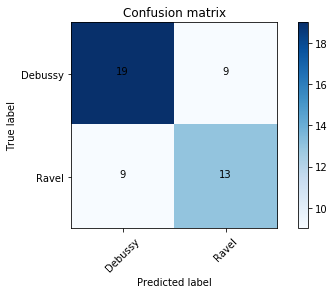

LinearSVC
[[19  9]
 [ 9 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.88 (0.253)

-----


n-gram range (1, 1)
[[19 13]
 [15 15]]


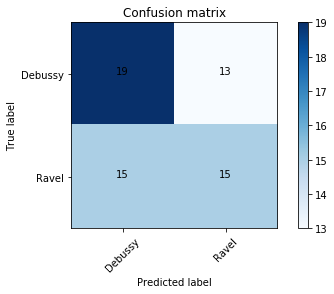

LinearSVC
[[19 13]
 [15 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.322) & 0.84 (0.3502)
n-gram range (2, 2)
[[18 14]
 [16 14]]


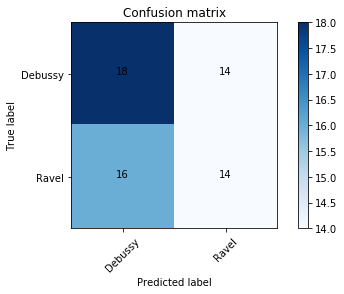

LinearSVC
[[18 14]
 [16 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.7317 (0.3108)
n-gram range (3, 3)
[[19 12]
 [16 12]]


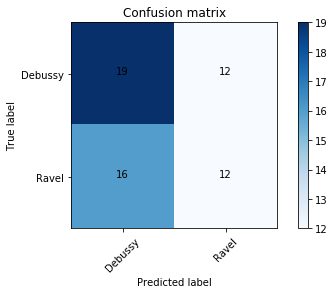

LinearSVC
[[19 12]
 [16 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7333 (0.3352) & 0.6467 (0.3888)
n-gram range (4, 4)
[[19 11]
 [14 12]]


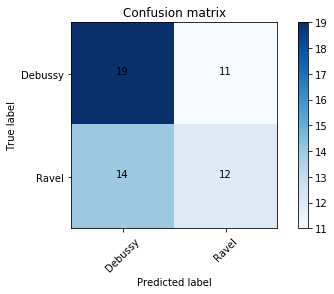

LinearSVC
[[19 11]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2699) & 0.7317 (0.3482)
n-gram range (1, 2)
[[18 13]
 [12 16]]


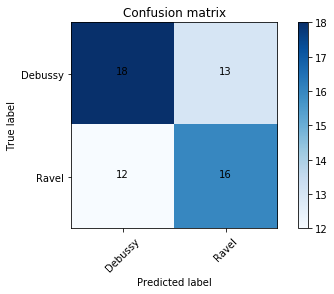

LinearSVC
[[18 13]
 [12 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.2415) & 0.8 (0.322)
n-gram range (3, 4)
[[18 13]
 [16 12]]


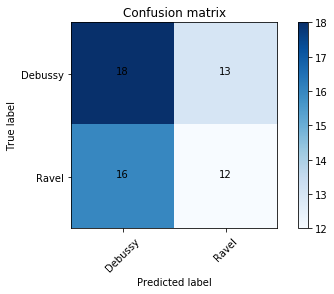

LinearSVC
[[18 13]
 [16 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.3162) & 0.715 (0.3705)
n-gram range (1, 4)
[[19  8]
 [ 8 12]]


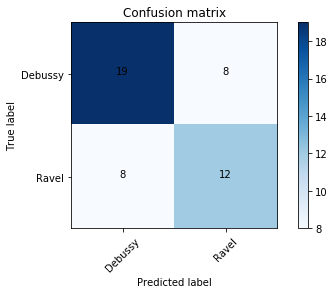

LinearSVC
[[19  8]
 [ 8 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)

-----


n-gram range (1, 1)
[[19 10]
 [ 9 15]]


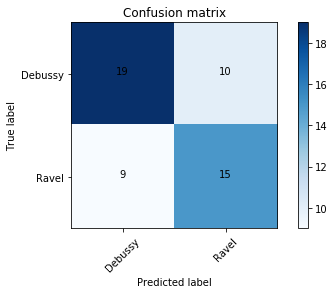

LinearSVC
[[19 10]
 [ 9 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.9667 (0.1054)
n-gram range (2, 2)
[[20 13]
 [17 15]]


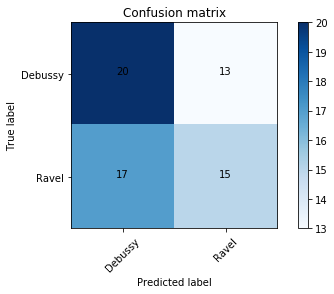

LinearSVC
[[20 13]
 [17 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2222) & 0.7467 (0.3278)
n-gram range (3, 3)
[[19  9]
 [12 10]]


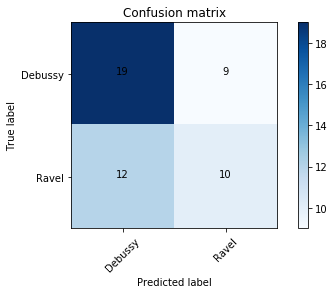

LinearSVC
[[19  9]
 [12 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2194) & 0.6867 (0.3312)
n-gram range (4, 4)
[[19 12]
 [15 13]]


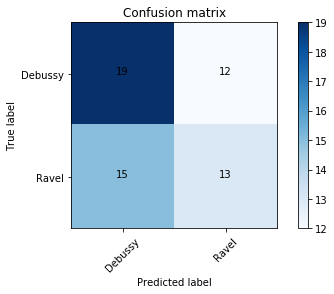

LinearSVC
[[19 12]
 [15 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2194) & 0.7133 (0.3159)
n-gram range (1, 2)
[[21 15]
 [15 17]]


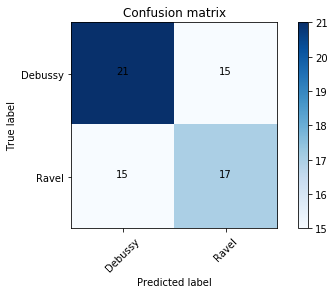

LinearSVC
[[21 15]
 [15 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.9067 (0.2066)
n-gram range (3, 4)
[[19 10]
 [14 10]]


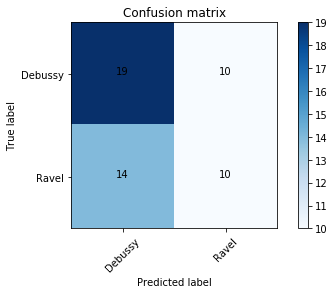

LinearSVC
[[19 10]
 [14 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.6783 (0.3419)
n-gram range (1, 4)
[[21 15]
 [16 16]]


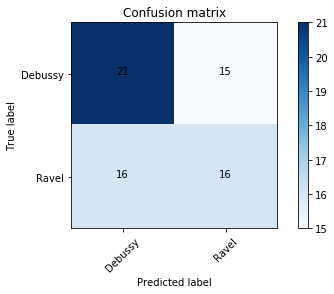

LinearSVC
[[21 15]
 [16 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.161) & 0.8467 (0.2573)

-----


n-gram range (1, 1)
[[19 11]
 [10 16]]


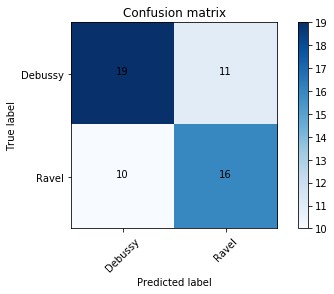

LinearSVC
[[19 11]
 [10 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.9667 (0.1054)
n-gram range (2, 2)
[[20 13]
 [17 15]]


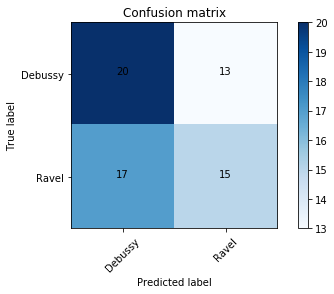

LinearSVC
[[20 13]
 [17 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.1995) & 0.78 (0.2966)
n-gram range (3, 3)
[[18 13]
 [16 12]]


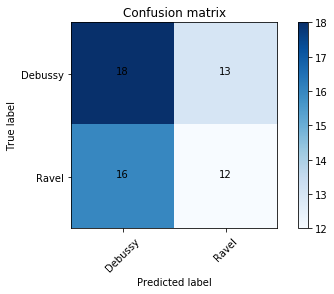

LinearSVC
[[18 13]
 [16 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.6833 (0.4041) & 0.6133 (0.4307)
n-gram range (4, 4)
[[16 12]
 [12 10]]


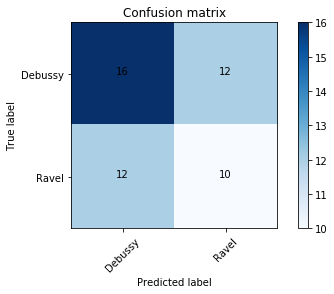

LinearSVC
[[16 12]
 [12 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.6833 (0.3723) & 0.6233 (0.4097)
n-gram range (1, 2)
[[18 10]
 [ 9 13]]


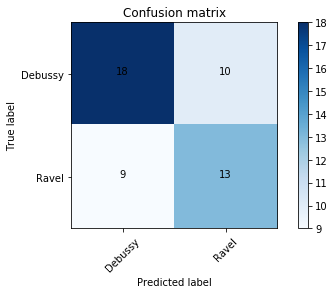

LinearSVC
[[18 10]
 [ 9 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.161) & 0.8467 (0.2573)
n-gram range (3, 4)
[[19 13]
 [17 13]]


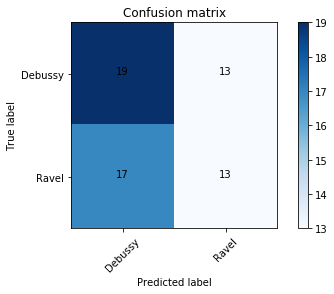

LinearSVC
[[19 13]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2945) & 0.7233 (0.3596)
n-gram range (1, 4)
[[18 11]
 [10 14]]


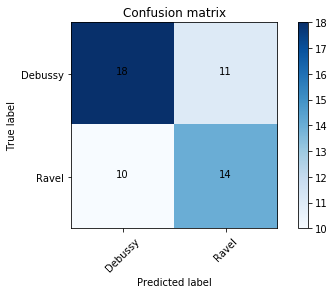

LinearSVC
[[18 11]
 [10 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.161) & 0.8733 (0.2165)

-----


n-gram range (1, 1)
[[19 10]
 [ 9 15]]


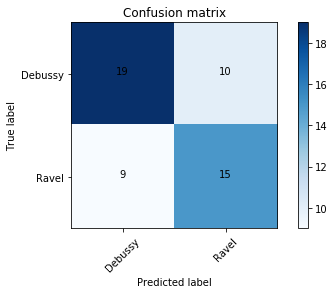

LinearSVC
[[19 10]
 [ 9 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.94 (0.1897)
n-gram range (2, 2)
[[20 12]
 [16 14]]


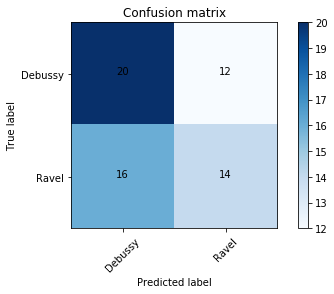

LinearSVC
[[20 12]
 [16 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.254) & 0.7983 (0.3266)
n-gram range (3, 3)
[[19 14]
 [17 15]]


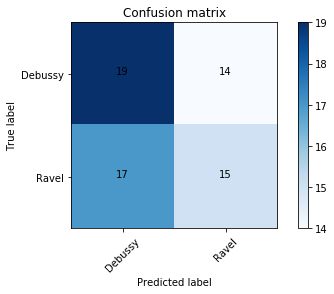

LinearSVC
[[19 14]
 [17 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.3338) & 0.74 (0.3711)
n-gram range (4, 4)
[[19 14]
 [17 15]]


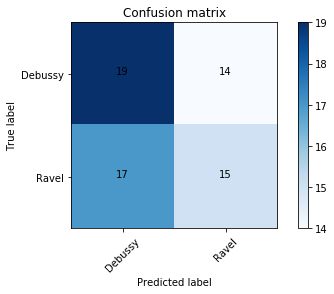

LinearSVC
[[19 14]
 [17 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2699) & 0.7317 (0.3482)
n-gram range (1, 2)
[[19 14]
 [14 18]]


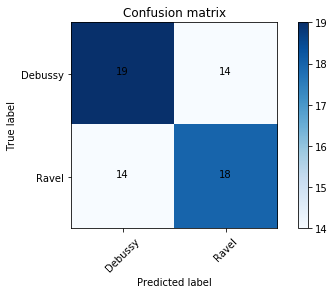

LinearSVC
[[19 14]
 [14 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)
n-gram range (3, 4)
[[19 11]
 [15 11]]


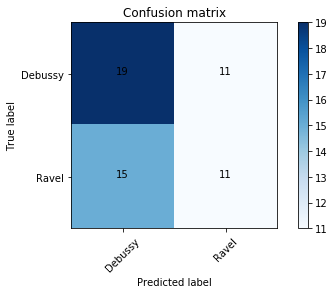

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.3263) & 0.6533 (0.3834)
n-gram range (1, 4)
[[19 14]
 [14 18]]


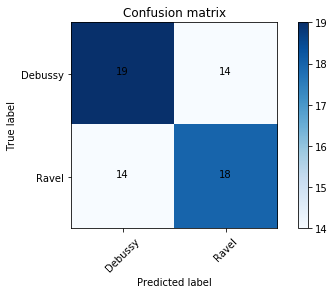

LinearSVC
[[19 14]
 [14 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.2108) & 0.8667 (0.2811)

-----


n-gram range (1, 1)
[[18 10]
 [ 8 14]]


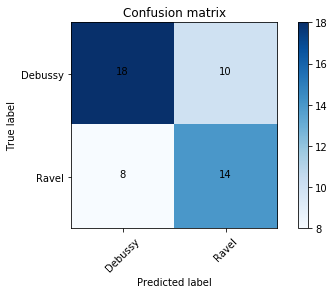

LinearSVC
[[18 10]
 [ 8 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.9 (0.225)
n-gram range (2, 2)
[[20 14]
 [18 16]]


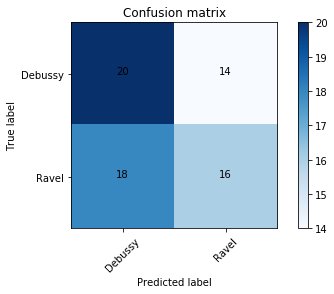

LinearSVC
[[20 14]
 [18 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2222) & 0.7467 (0.3278)
n-gram range (3, 3)
[[19 13]
 [17 13]]


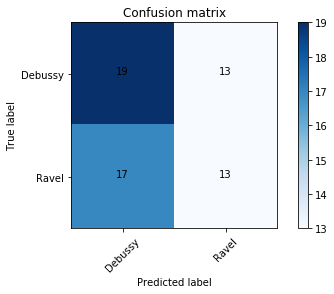

LinearSVC
[[19 13]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7333 (0.3352) & 0.6467 (0.3888)
n-gram range (4, 4)
[[19 12]
 [15 13]]


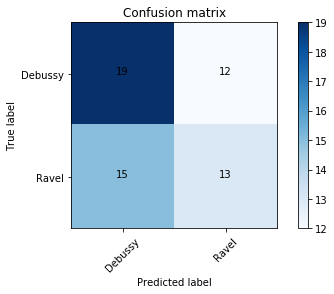

LinearSVC
[[19 12]
 [15 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2194) & 0.7133 (0.3159)
n-gram range (1, 2)
[[19 13]
 [13 17]]


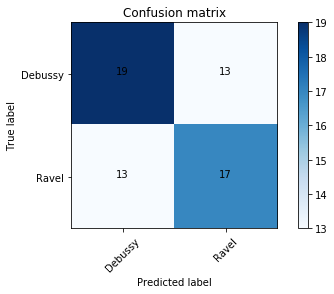

LinearSVC
[[19 13]
 [13 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.9333 (0.1405)
n-gram range (3, 4)
[[18 11]
 [14 10]]


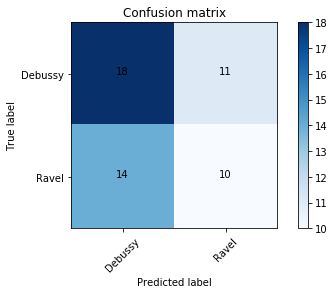

LinearSVC
[[18 11]
 [14 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.239) & 0.645 (0.3228)
n-gram range (1, 4)
[[19 11]
 [11 15]]


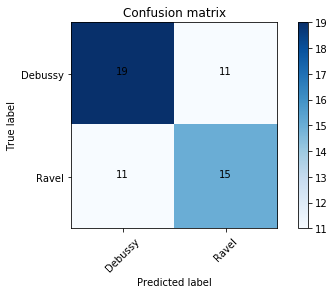

LinearSVC
[[19 11]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.9 (0.225)

-----


n-gram range (1, 1)
[[19 11]
 [10 16]]


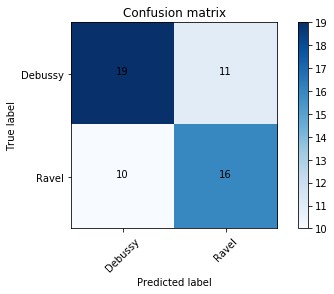

LinearSVC
[[19 11]
 [10 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.9667 (0.1054)
n-gram range (2, 2)
[[20 14]
 [18 16]]


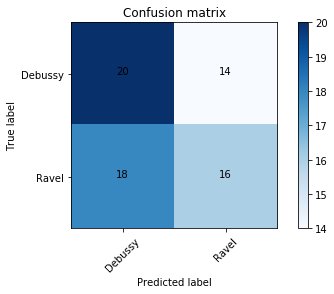

LinearSVC
[[20 14]
 [18 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2331) & 0.8317 (0.2887)
n-gram range (3, 3)
[[18 12]
 [15 11]]


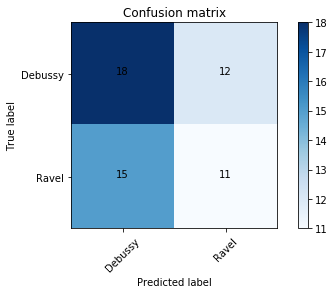

LinearSVC
[[18 12]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7167 (0.3518) & 0.6383 (0.3971)
n-gram range (4, 4)
[[19 16]
 [19 17]]


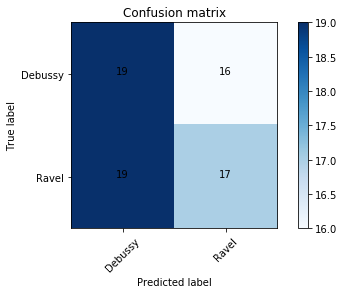

LinearSVC
[[19 16]
 [19 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.2987) & 0.7833 (0.3496)
n-gram range (1, 2)
[[18  9]
 [ 8 12]]


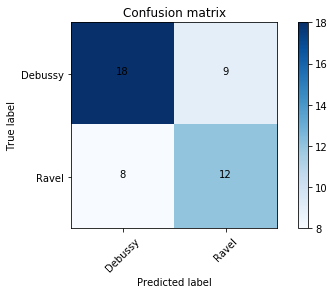

LinearSVC
[[18  9]
 [ 8 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.161) & 0.8467 (0.2573)
n-gram range (3, 4)
[[19 13]
 [17 13]]


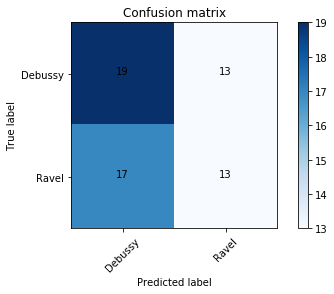

LinearSVC
[[19 13]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2945) & 0.7233 (0.3596)
n-gram range (1, 4)
[[19  8]
 [ 8 12]]


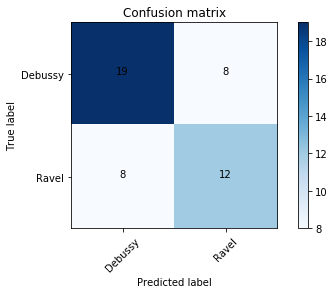

LinearSVC
[[19  8]
 [ 8 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.88 (0.253)

-----


n-gram range (1, 1)
[[21 18]
 [16 19]]


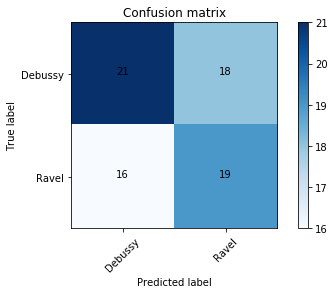

LinearSVC
[[21 18]
 [16 19]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.2108) & 0.8667 (0.2811)
n-gram range (2, 2)
[[20 11]
 [15 13]]


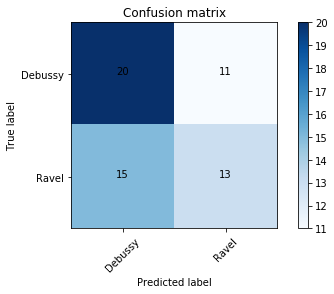

LinearSVC
[[20 11]
 [15 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.2415) & 0.74 (0.3362)
n-gram range (3, 3)
[[20 15]
 [20 16]]


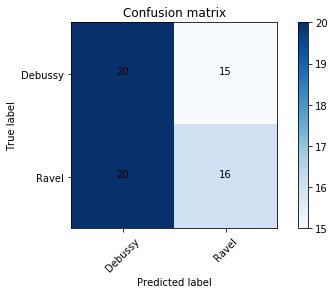

LinearSVC
[[20 15]
 [20 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.254) & 0.765 (0.3207)
n-gram range (4, 4)
[[19 11]
 [14 12]]


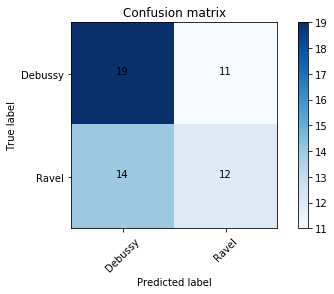

LinearSVC
[[19 11]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2194) & 0.7133 (0.3159)
n-gram range (1, 2)
[[18 11]
 [10 14]]


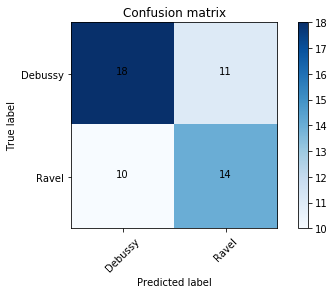

LinearSVC
[[18 11]
 [10 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.161) & 0.8467 (0.2573)
n-gram range (3, 4)
[[20 10]
 [15 11]]


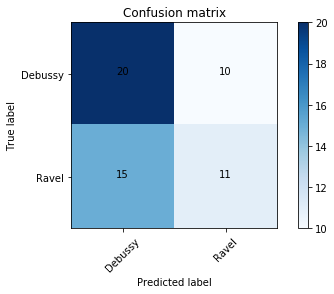

LinearSVC
[[20 10]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2194) & 0.6867 (0.3312)
n-gram range (1, 4)
[[19 12]
 [13 15]]


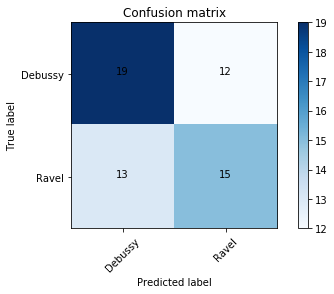

LinearSVC
[[19 12]
 [13 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2194) & 0.8333 (0.2833)

-----


n-gram range (1, 1)
[[17 10]
 [ 7 13]]


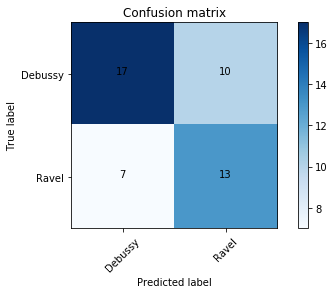

LinearSVC
[[17 10]
 [ 7 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.8667 (0.2331)
n-gram range (2, 2)
[[19 11]
 [14 12]]


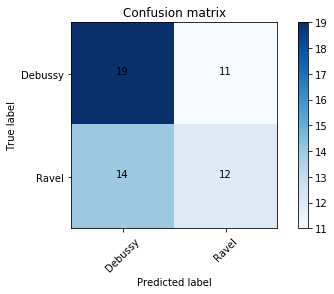

LinearSVC
[[19 11]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.322) & 0.72 (0.3795)
n-gram range (3, 3)
[[18  9]
 [12  8]]


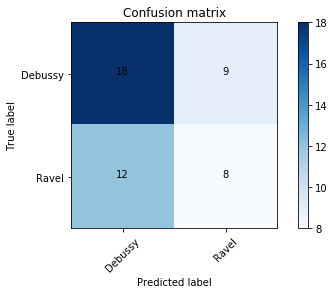

LinearSVC
[[18  9]
 [12  8]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7333 (0.2509) & 0.6117 (0.3372)
n-gram range (4, 4)
[[19 12]
 [14 14]]


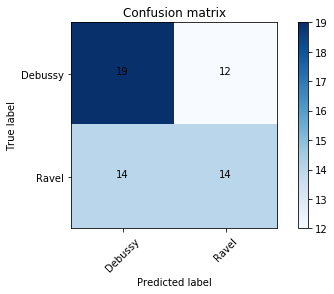

LinearSVC
[[19 12]
 [14 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2222) & 0.7733 (0.3066)
n-gram range (1, 2)
[[18 10]
 [ 9 13]]


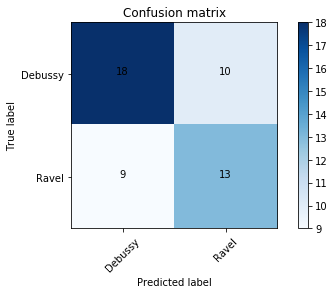

LinearSVC
[[18 10]
 [ 9 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2194) & 0.8067 (0.3118)
n-gram range (3, 4)
[[19 14]
 [18 14]]


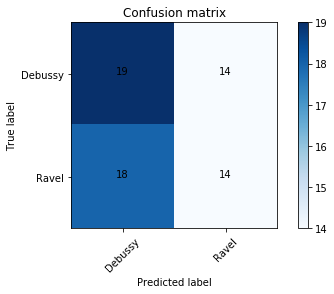

LinearSVC
[[19 14]
 [18 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2629) & 0.6717 (0.3485)
n-gram range (1, 4)
[[18 10]
 [10 12]]


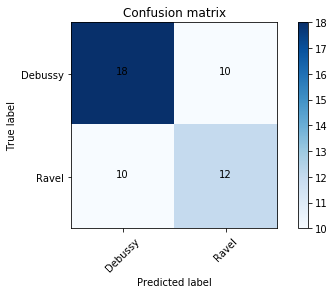

LinearSVC
[[18 10]
 [10 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.254) & 0.7983 (0.3266)

-----


n-gram range (1, 1)
[[21 15]
 [13 16]]


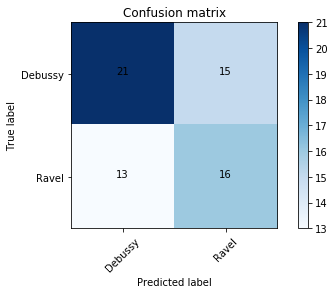

LinearSVC
[[21 15]
 [13 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)
n-gram range (2, 2)
[[20  9]
 [13 11]]


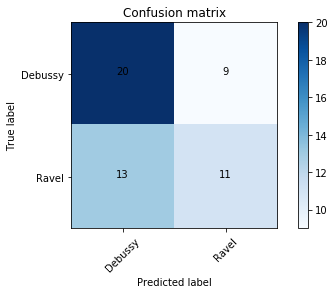

LinearSVC
[[20  9]
 [13 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.1995) & 0.7533 (0.319)
n-gram range (3, 3)
[[19  7]
 [11  7]]


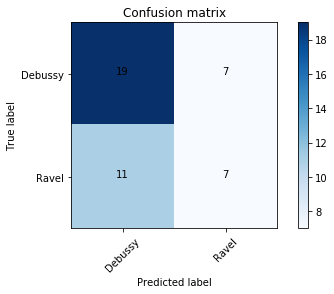

LinearSVC
[[19  7]
 [11  7]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.1933) & 0.6333 (0.3162)
n-gram range (4, 4)
[[19 10]
 [13 11]]


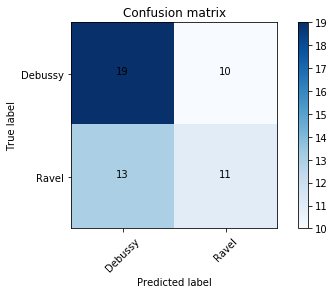

LinearSVC
[[19 10]
 [13 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.1757) & 0.7267 (0.2989)
n-gram range (1, 2)
[[19 14]
 [14 18]]


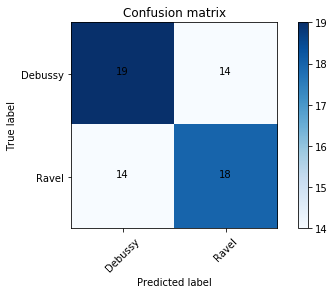

LinearSVC
[[19 14]
 [14 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.9 (0.225)
n-gram range (3, 4)
[[19  9]
 [13  9]]


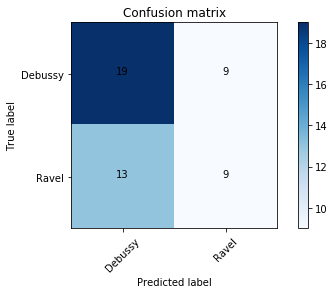

LinearSVC
[[19  9]
 [13  9]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.2257) & 0.62 (0.3282)
n-gram range (1, 4)
[[19 11]
 [13 13]]


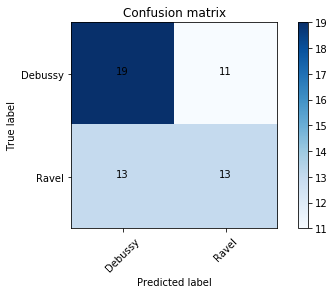

LinearSVC
[[19 11]
 [13 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2331) & 0.805 (0.3166)

-----


n-gram range (1, 1)
[[20 12]
 [13 17]]


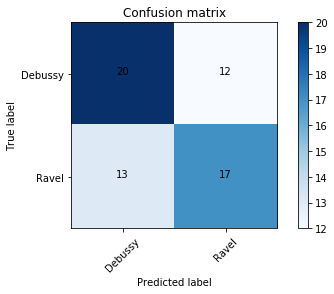

LinearSVC
[[20 12]
 [13 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.9667 (0.1054)
n-gram range (2, 2)
[[20 16]
 [19 19]]


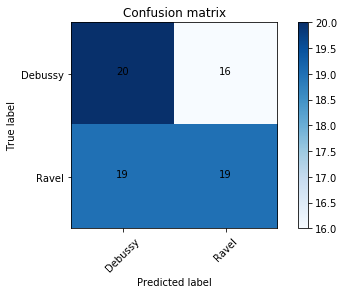

LinearSVC
[[20 16]
 [19 19]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.8133 (0.3011)
n-gram range (3, 3)
[[20 14]
 [19 15]]


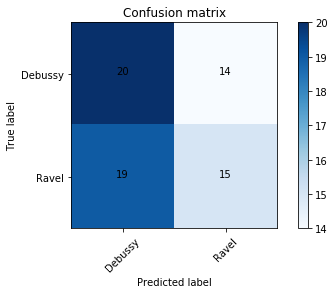

LinearSVC
[[20 14]
 [19 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2833) & 0.79 (0.3406)
n-gram range (4, 4)
[[19 11]
 [14 12]]


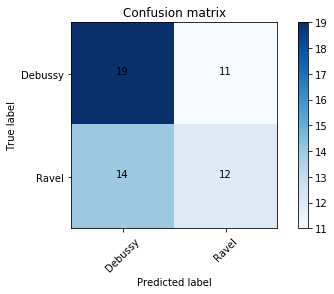

LinearSVC
[[19 11]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.254) & 0.7383 (0.3403)
n-gram range (1, 2)
[[18 11]
 [10 14]]


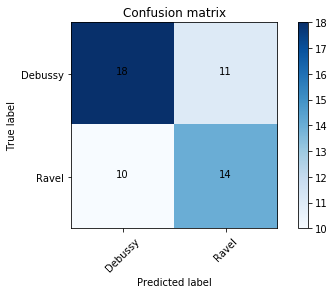

LinearSVC
[[18 11]
 [10 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.161) & 0.8467 (0.2573)
n-gram range (3, 4)
[[19  8]
 [11  9]]


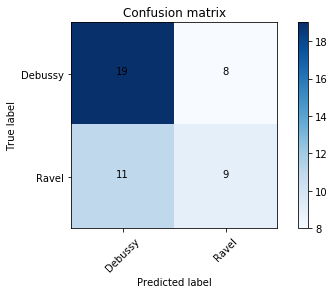

LinearSVC
[[19  8]
 [11  9]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.1995) & 0.6933 (0.3239)
n-gram range (1, 4)
[[19 11]
 [11 15]]


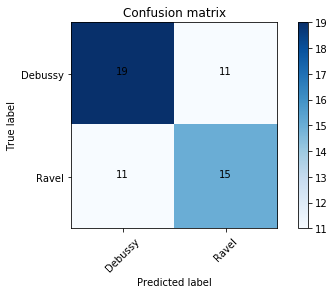

LinearSVC
[[19 11]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.2108) & 0.925 (0.2372)

-----


n-gram range (1, 1)
[[20 17]
 [15 19]]


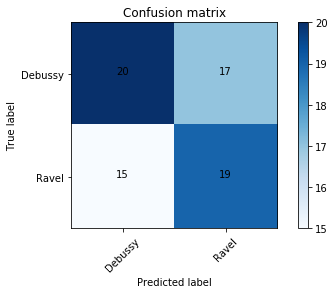

LinearSVC
[[20 17]
 [15 19]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.9333 (0.1405)
n-gram range (2, 2)
[[18 13]
 [15 13]]


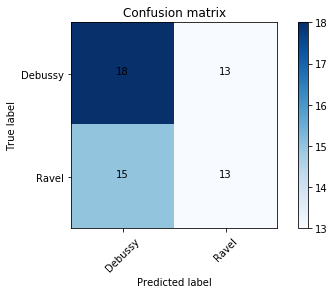

LinearSVC
[[18 13]
 [15 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7333 (0.3352) & 0.6733 (0.379)
n-gram range (3, 3)
[[19 14]
 [18 14]]


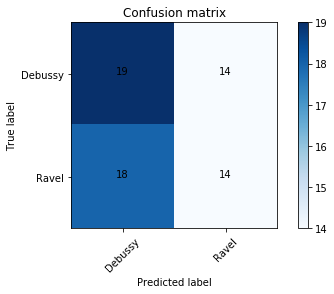

LinearSVC
[[19 14]
 [18 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.3531) & 0.705 (0.3961)
n-gram range (4, 4)
[[19 12]
 [15 13]]


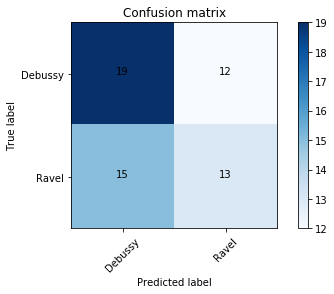

LinearSVC
[[19 12]
 [15 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2194) & 0.6867 (0.3312)
n-gram range (1, 2)
[[18 10]
 [ 9 13]]


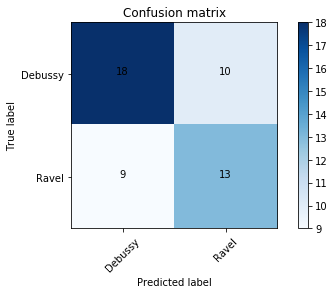

LinearSVC
[[18 10]
 [ 9 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.84 (0.2707)
n-gram range (3, 4)
[[19 10]
 [14 10]]


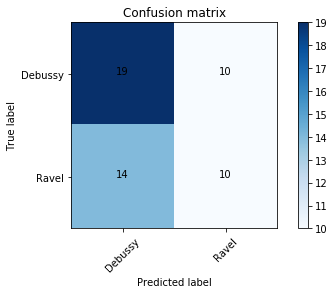

LinearSVC
[[19 10]
 [14 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.6783 (0.3419)
n-gram range (1, 4)
[[21 13]
 [13 15]]


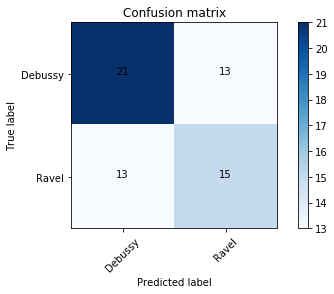

LinearSVC
[[21 13]
 [13 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)

-----


n-gram range (1, 1)
[[19  9]
 [ 8 14]]


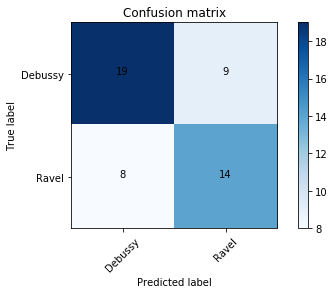

LinearSVC
[[19  9]
 [ 8 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.94 (0.1897)
n-gram range (2, 2)
[[20 11]
 [15 13]]


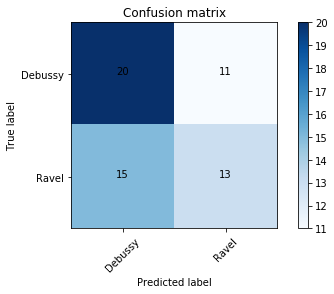

LinearSVC
[[20 11]
 [15 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2222) & 0.7467 (0.3278)
n-gram range (3, 3)
[[19 15]
 [19 15]]


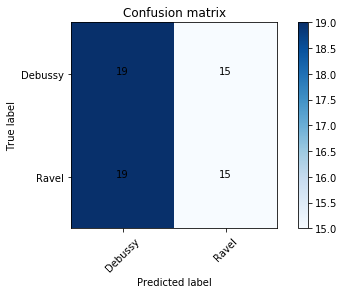

LinearSVC
[[19 15]
 [19 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2811) & 0.7567 (0.334)
n-gram range (4, 4)
[[19 11]
 [14 12]]


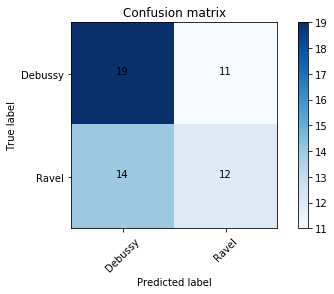

LinearSVC
[[19 11]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2194) & 0.7133 (0.3159)
n-gram range (1, 2)
[[18  9]
 [ 8 12]]


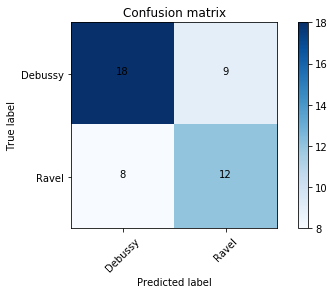

LinearSVC
[[18  9]
 [ 8 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.161) & 0.8467 (0.2573)
n-gram range (3, 4)
[[19 17]
 [21 17]]


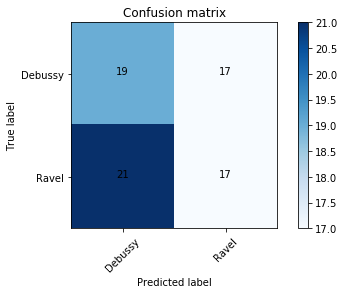

LinearSVC
[[19 17]
 [21 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.3063) & 0.7167 (0.3668)
n-gram range (1, 4)
[[21 18]
 [20 18]]


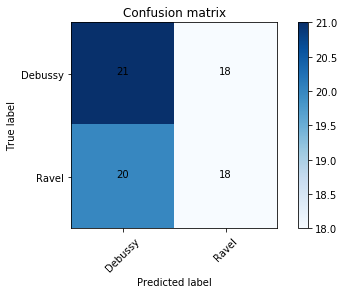

LinearSVC
[[21 18]
 [20 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.322) & 0.84 (0.3502)

-----


n-gram range (1, 1)
[[18 17]
 [16 20]]


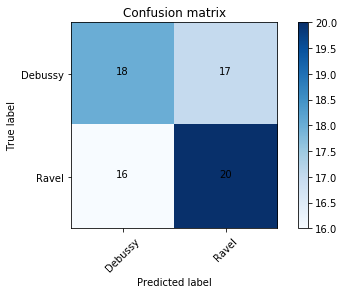

LinearSVC
[[18 17]
 [16 20]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.225) & 0.865 (0.2868)
n-gram range (2, 2)
[[19 10]
 [14 10]]


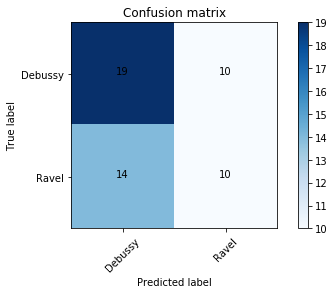

LinearSVC
[[19 10]
 [14 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.6783 (0.3419)
n-gram range (3, 3)
[[20 15]
 [20 16]]


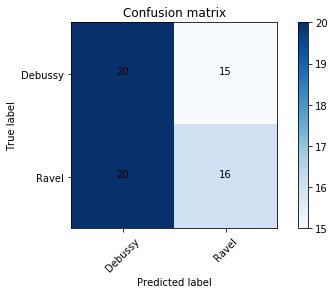

LinearSVC
[[20 15]
 [20 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.2987) & 0.7833 (0.3496)
n-gram range (4, 4)
[[19 13]
 [16 14]]


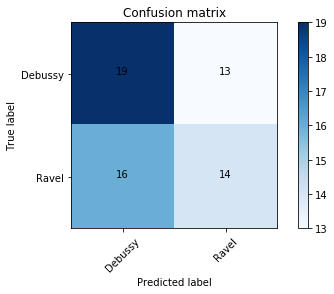

LinearSVC
[[19 13]
 [16 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.254) & 0.765 (0.3207)
n-gram range (1, 2)
[[18 10]
 [ 9 13]]


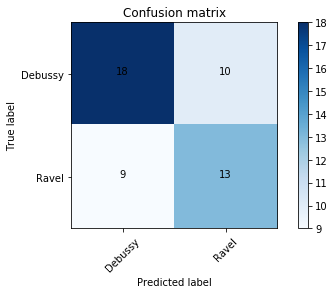

LinearSVC
[[18 10]
 [ 9 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2194) & 0.8067 (0.3118)
n-gram range (3, 4)
[[18 16]
 [19 15]]


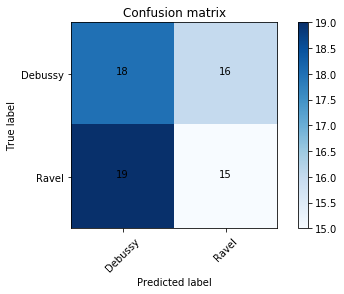

LinearSVC
[[18 16]
 [19 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.3531) & 0.7317 (0.382)
n-gram range (1, 4)
[[19 11]
 [11 15]]


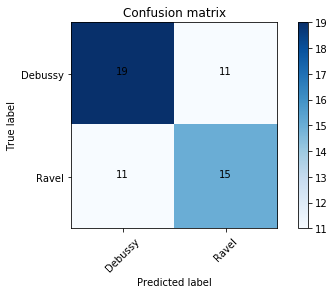

LinearSVC
[[19 11]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.9 (0.225)

-----


n-gram range (1, 1)
[[19  9]
 [ 8 14]]


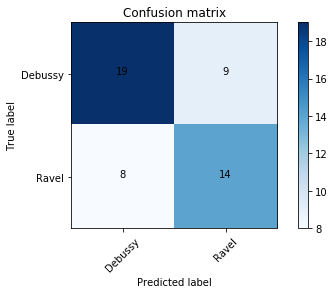

LinearSVC
[[19  9]
 [ 8 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.95 (0.1581) & 0.9333 (0.2108)
n-gram range (2, 2)
[[20 10]
 [14 12]]


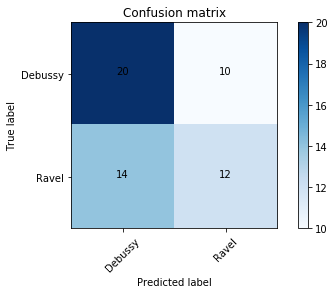

LinearSVC
[[20 10]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.1721) & 0.76 (0.3098)
n-gram range (3, 3)
[[18 10]
 [13  9]]


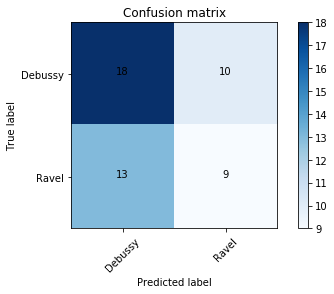

LinearSVC
[[18 10]
 [13  9]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7167 (0.2612) & 0.605 (0.3425)
n-gram range (4, 4)
[[19  8]
 [10 10]]


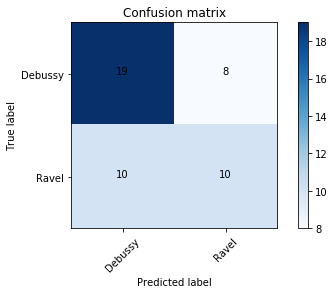

LinearSVC
[[19  8]
 [10 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.1995) & 0.7533 (0.319)
n-gram range (1, 2)
[[20 10]
 [11 15]]


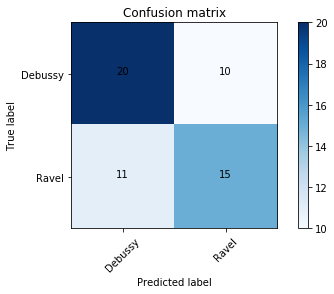

LinearSVC
[[20 10]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.94 (0.1897)
n-gram range (3, 4)
[[19 11]
 [15 11]]


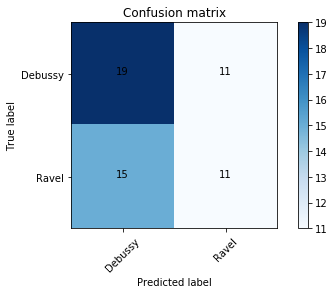

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2629) & 0.6717 (0.3485)
n-gram range (1, 4)
[[18  9]
 [ 8 12]]


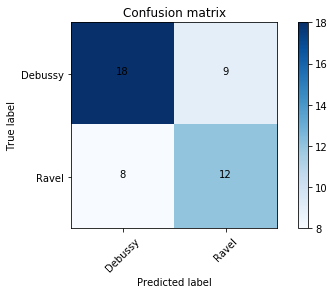

LinearSVC
[[18  9]
 [ 8 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2194) & 0.8067 (0.3118)

-----


n-gram range (1, 1)
[[20 10]
 [10 16]]


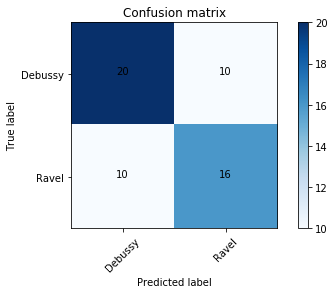

LinearSVC
[[20 10]
 [10 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
1.0 (0.0) & 1.0 (0.0)
n-gram range (2, 2)
[[20 12]
 [16 14]]


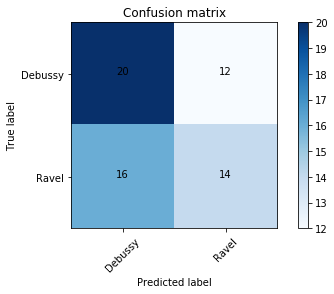

LinearSVC
[[20 12]
 [16 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.1995) & 0.78 (0.2966)
n-gram range (3, 3)
[[18  7]
 [10  6]]


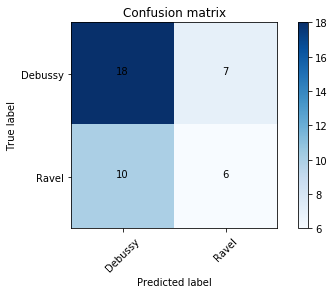

LinearSVC
[[18  7]
 [10  6]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7333 (0.1956) & 0.5667 (0.3002)
n-gram range (4, 4)
[[19 11]
 [14 12]]


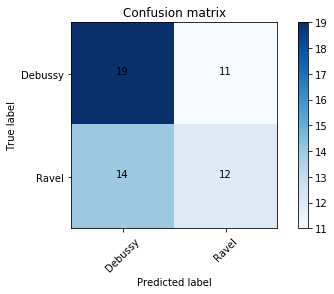

LinearSVC
[[19 11]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2194) & 0.6867 (0.3312)
n-gram range (1, 2)
[[19 12]
 [12 16]]


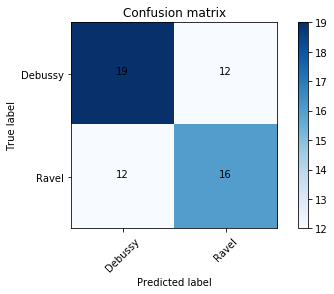

LinearSVC
[[19 12]
 [12 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.9 (0.225)
n-gram range (3, 4)
[[19  9]
 [13  9]]


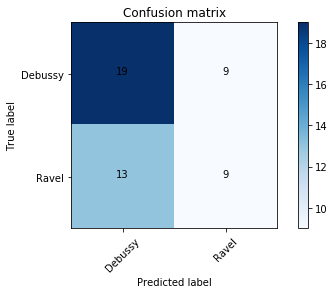

LinearSVC
[[19  9]
 [13  9]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2108) & 0.6267 (0.3223)
n-gram range (1, 4)
[[18  9]
 [ 8 12]]


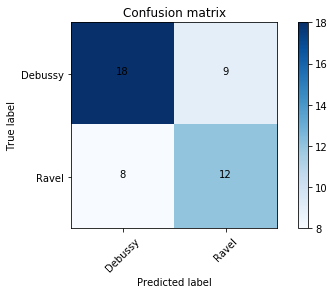

LinearSVC
[[18  9]
 [ 8 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.225) & 0.865 (0.2868)

-----


n-gram range (1, 1)
[[18 10]
 [ 9 13]]


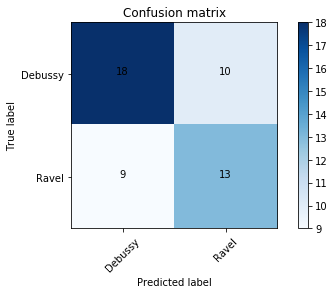

LinearSVC
[[18 10]
 [ 9 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.84 (0.2707)
n-gram range (2, 2)
[[20 13]
 [17 15]]


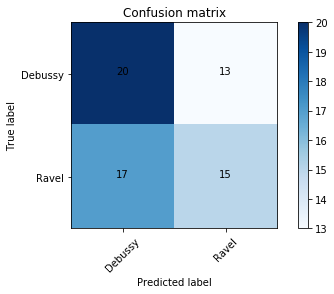

LinearSVC
[[20 13]
 [17 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.254) & 0.7983 (0.3266)
n-gram range (3, 3)
[[19 13]
 [17 13]]


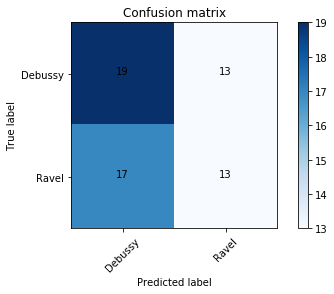

LinearSVC
[[19 13]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.705 (0.3279)
n-gram range (4, 4)
[[19 15]
 [18 16]]


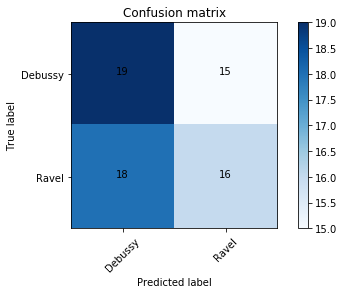

LinearSVC
[[19 15]
 [18 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2833) & 0.79 (0.3406)
n-gram range (1, 2)
[[18 10]
 [ 9 13]]


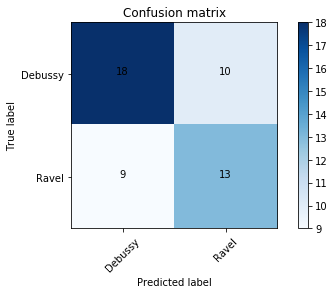

LinearSVC
[[18 10]
 [ 9 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.161) & 0.82 (0.2898)
n-gram range (3, 4)
[[19 14]
 [18 14]]


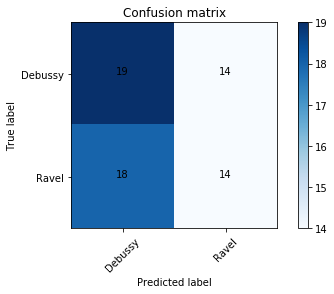

LinearSVC
[[19 14]
 [18 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.3622) & 0.6983 (0.4023)
n-gram range (1, 4)
[[19 12]
 [12 16]]


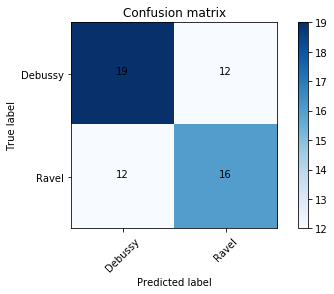

LinearSVC
[[19 12]
 [12 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)

-----


n-gram range (1, 1)
[[18 10]
 [ 8 14]]


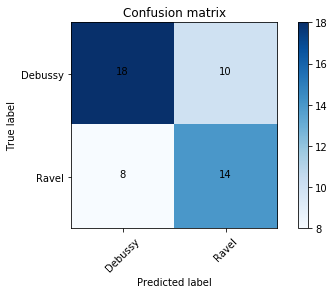

LinearSVC
[[18 10]
 [ 8 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.2108) & 0.8667 (0.2811)
n-gram range (2, 2)
[[19 10]
 [13 11]]


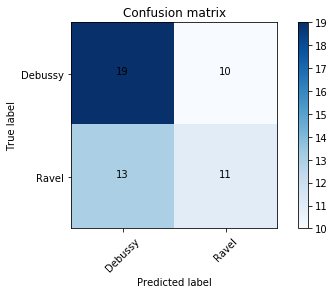

LinearSVC
[[19 10]
 [13 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.1995) & 0.6933 (0.3239)
n-gram range (3, 3)
[[19 12]
 [16 12]]


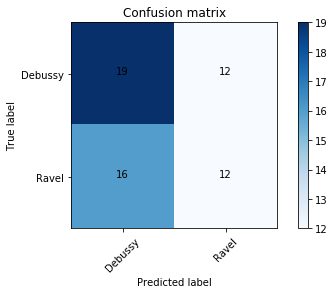

LinearSVC
[[19 12]
 [16 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2629) & 0.6717 (0.3485)
n-gram range (4, 4)
[[19 14]
 [17 15]]


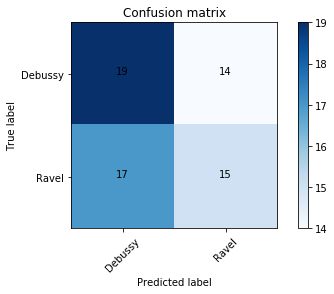

LinearSVC
[[19 14]
 [17 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.254) & 0.765 (0.3207)
n-gram range (1, 2)
[[19 10]
 [10 14]]


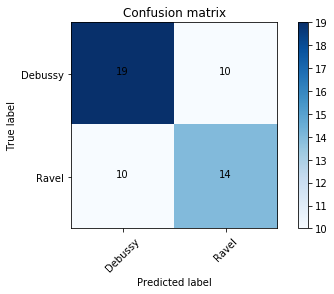

LinearSVC
[[19 10]
 [10 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)
n-gram range (3, 4)
[[19 11]
 [15 11]]


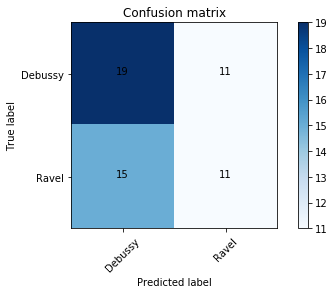

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2629) & 0.6717 (0.3485)
n-gram range (1, 4)
[[19 11]
 [11 15]]


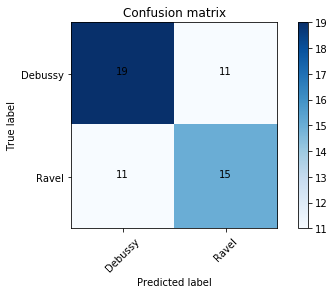

LinearSVC
[[19 11]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)

-----


n-gram range (1, 1)
[[18 11]
 [10 14]]


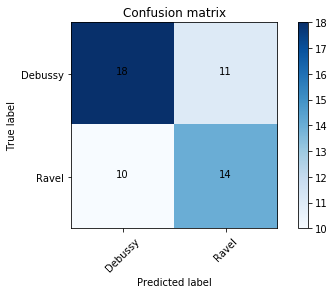

LinearSVC
[[18 11]
 [10 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.161) & 0.8733 (0.2165)
n-gram range (2, 2)
[[20 15]
 [19 17]]


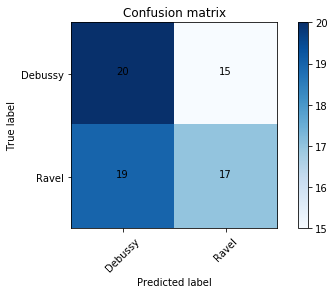

LinearSVC
[[20 15]
 [19 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.254) & 0.7983 (0.3266)
n-gram range (3, 3)
[[19 14]
 [18 14]]


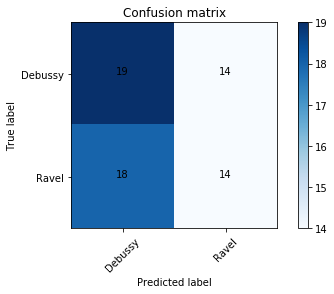

LinearSVC
[[19 14]
 [18 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.3531) & 0.705 (0.3961)
n-gram range (4, 4)
[[19 13]
 [17 13]]


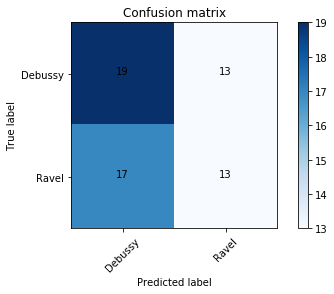

LinearSVC
[[19 13]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.6783 (0.3419)
n-gram range (1, 2)
[[17 10]
 [ 8 12]]


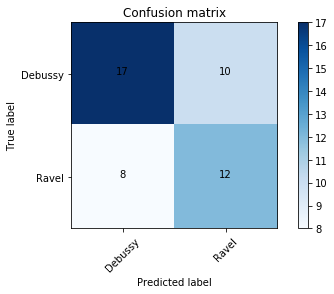

LinearSVC
[[17 10]
 [ 8 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.1995) & 0.78 (0.2966)
n-gram range (3, 4)
[[19 11]
 [15 11]]


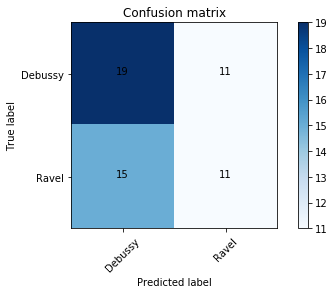

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2108) & 0.6533 (0.3124)
n-gram range (1, 4)
[[19 12]
 [12 16]]


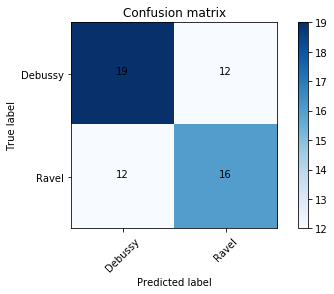

LinearSVC
[[19 12]
 [12 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)

-----


n-gram range (1, 1)
[[19 14]
 [13 19]]


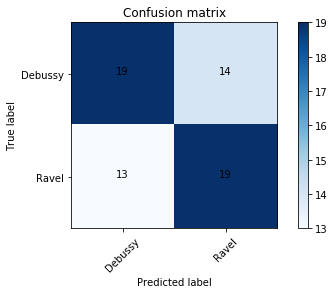

LinearSVC
[[19 14]
 [13 19]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.95 (0.1581) & 0.9333 (0.2108)
n-gram range (2, 2)
[[20 10]
 [13 13]]


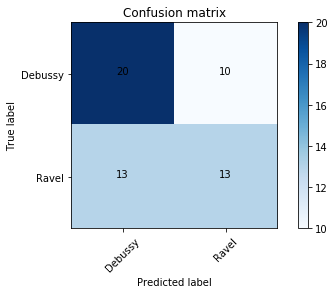

LinearSVC
[[20 10]
 [13 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.8133 (0.3011)
n-gram range (3, 3)
[[19 11]
 [15 11]]


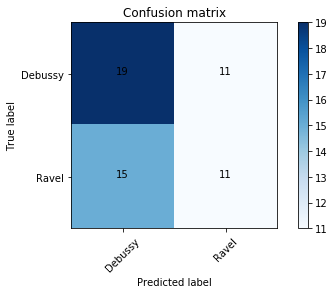

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.6783 (0.3419)
n-gram range (4, 4)
[[19 11]
 [13 13]]


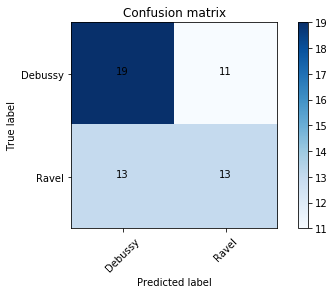

LinearSVC
[[19 11]
 [13 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.1995) & 0.78 (0.2966)
n-gram range (1, 2)
[[18 10]
 [ 9 13]]


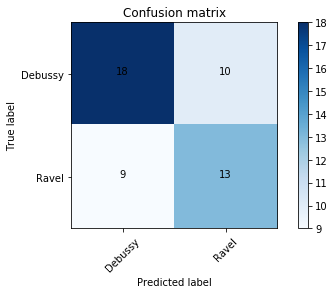

LinearSVC
[[18 10]
 [ 9 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2194) & 0.8333 (0.2833)
n-gram range (3, 4)
[[19  8]
 [12  8]]


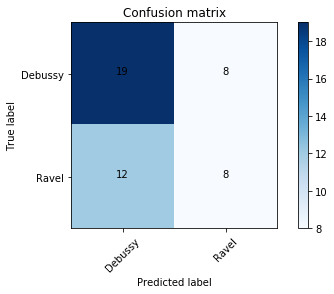

LinearSVC
[[19  8]
 [12  8]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2108) & 0.6267 (0.3223)
n-gram range (1, 4)
[[21 14]
 [14 16]]


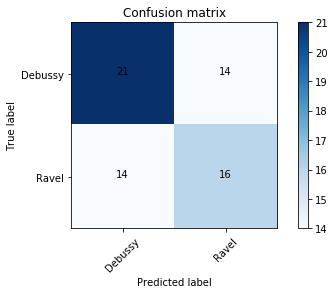

LinearSVC
[[21 14]
 [14 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.88 (0.253)

-----


n-gram range (1, 1)
[[20 15]
 [15 21]]


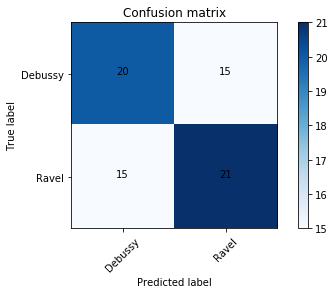

LinearSVC
[[20 15]
 [15 21]]
micro-averaged f-score (std) & macro-averaged f-score (std)
1.0 (0.0) & 1.0 (0.0)
n-gram range (2, 2)
[[20 11]
 [15 13]]


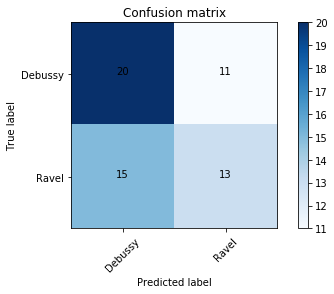

LinearSVC
[[20 11]
 [15 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2331) & 0.805 (0.3166)
n-gram range (3, 3)
[[19 11]
 [15 11]]


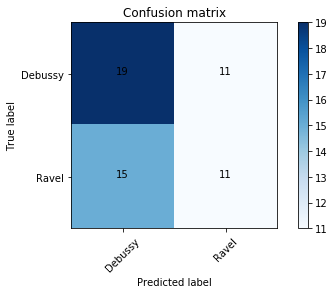

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2108) & 0.6533 (0.3124)
n-gram range (4, 4)
[[19 15]
 [19 15]]


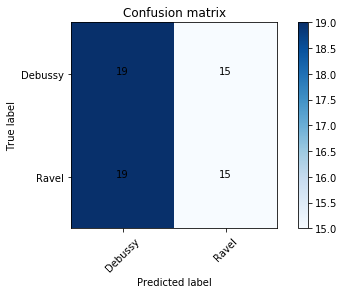

LinearSVC
[[19 15]
 [19 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.3622) & 0.6983 (0.4023)
n-gram range (1, 2)
[[19  9]
 [ 9 13]]


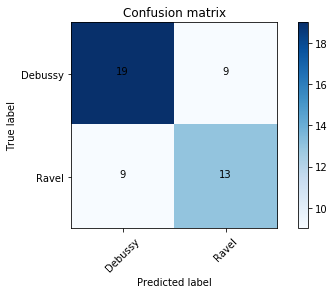

LinearSVC
[[19  9]
 [ 9 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)
n-gram range (3, 4)
[[19 14]
 [18 14]]


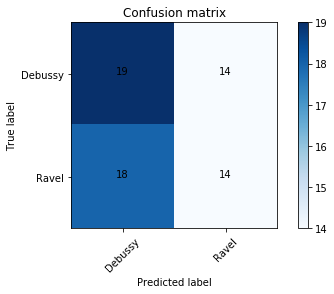

LinearSVC
[[19 14]
 [18 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.3531) & 0.705 (0.3961)
n-gram range (1, 4)
[[19 13]
 [13 17]]


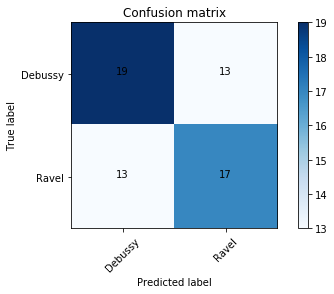

LinearSVC
[[19 13]
 [13 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.2108) & 0.925 (0.2372)

-----


n-gram range (1, 1)
[[20 11]
 [11 17]]


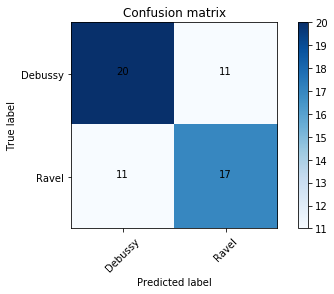

LinearSVC
[[20 11]
 [11 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
1.0 (0.0) & 1.0 (0.0)
n-gram range (2, 2)
[[20 14]
 [18 16]]


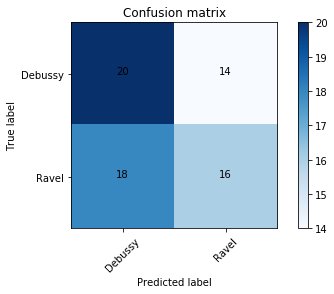

LinearSVC
[[20 14]
 [18 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2222) & 0.7733 (0.3066)
n-gram range (3, 3)
[[18  8]
 [11  7]]


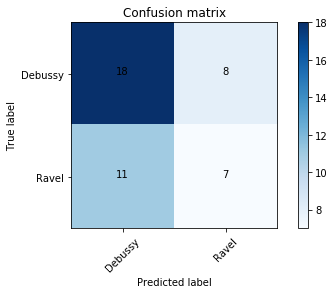

LinearSVC
[[18  8]
 [11  7]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7167 (0.2086) & 0.56 (0.305)
n-gram range (4, 4)
[[18 14]
 [16 14]]


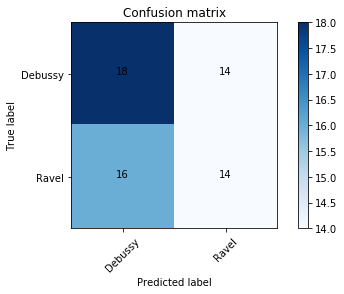

LinearSVC
[[18 14]
 [16 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.705 (0.3279)
n-gram range (1, 2)
[[20 17]
 [16 18]]


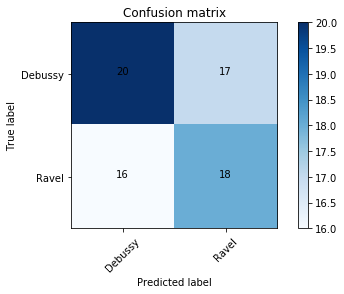

LinearSVC
[[20 17]
 [16 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.8667 (0.2331)
n-gram range (3, 4)
[[19 12]
 [16 12]]


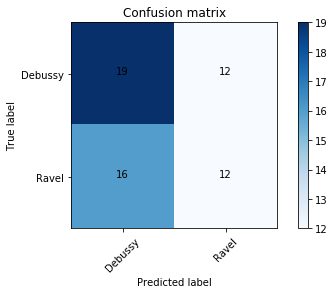

LinearSVC
[[19 12]
 [16 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2331) & 0.7117 (0.3201)
n-gram range (1, 4)
[[20 10]
 [11 15]]


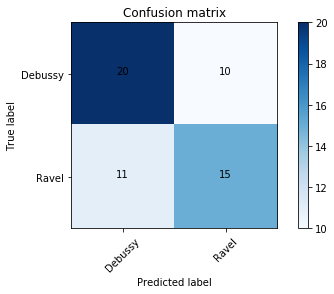

LinearSVC
[[20 10]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.94 (0.1897)

-----


n-gram range (1, 1)
[[19 11]
 [10 16]]


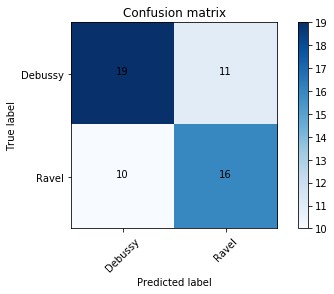

LinearSVC
[[19 11]
 [10 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.9667 (0.1054)
n-gram range (2, 2)
[[20 16]
 [20 18]]


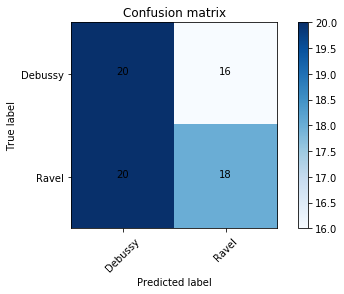

LinearSVC
[[20 16]
 [20 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2722) & 0.7917 (0.3362)
n-gram range (3, 3)
[[19 14]
 [17 15]]


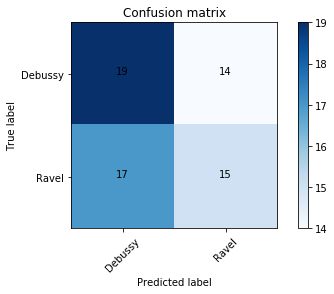

LinearSVC
[[19 14]
 [17 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.3338) & 0.74 (0.3711)
n-gram range (4, 4)
[[19 17]
 [20 18]]


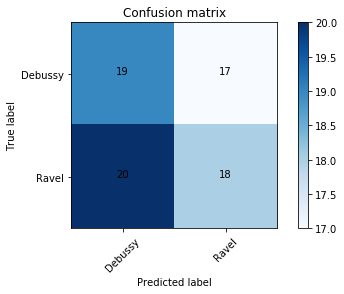

LinearSVC
[[19 17]
 [20 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2699) & 0.7317 (0.3482)
n-gram range (1, 2)
[[19  9]
 [ 9 13]]


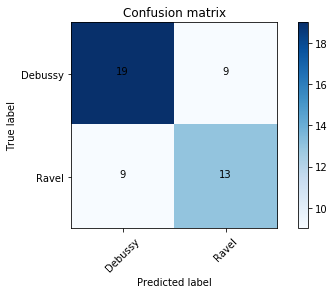

LinearSVC
[[19  9]
 [ 9 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.88 (0.253)
n-gram range (3, 4)
[[19 16]
 [19 17]]


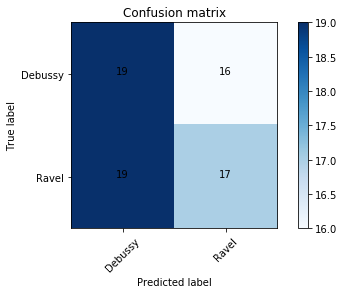

LinearSVC
[[19 16]
 [19 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.322) & 0.7733 (0.3446)
n-gram range (1, 4)
[[19 12]
 [12 16]]


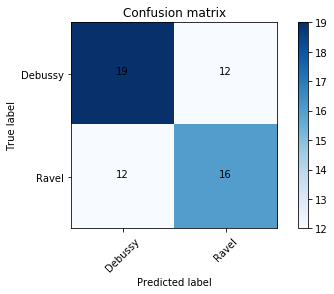

LinearSVC
[[19 12]
 [12 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.9067 (0.2066)

-----


n-gram range (1, 1)
[[18  7]
 [ 5 11]]


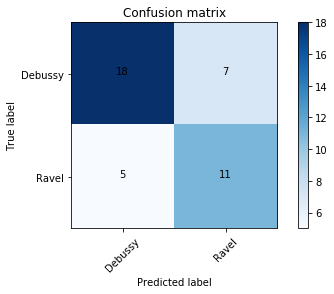

LinearSVC
[[18  7]
 [ 5 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)
n-gram range (2, 2)
[[19  8]
 [11  9]]


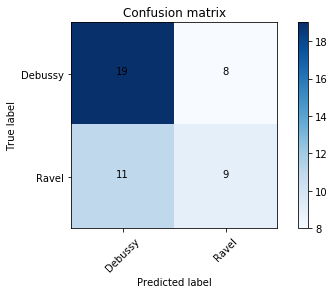

LinearSVC
[[19  8]
 [11  9]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2194) & 0.6867 (0.3312)
n-gram range (3, 3)
[[19 11]
 [15 11]]


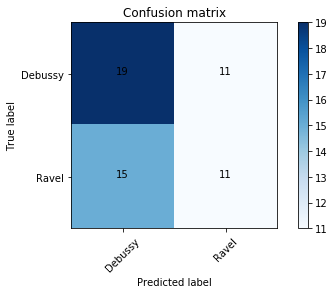

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.6783 (0.3419)
n-gram range (4, 4)
[[19 11]
 [12 14]]


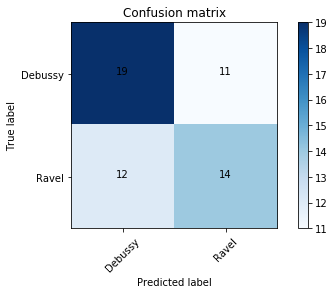

LinearSVC
[[19 11]
 [12 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.84 (0.2707)
n-gram range (1, 2)
[[18 10]
 [ 9 13]]


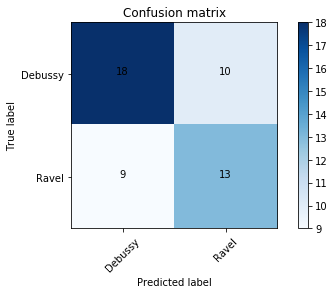

LinearSVC
[[18 10]
 [ 9 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.161) & 0.82 (0.2898)
n-gram range (3, 4)
[[19 13]
 [17 13]]


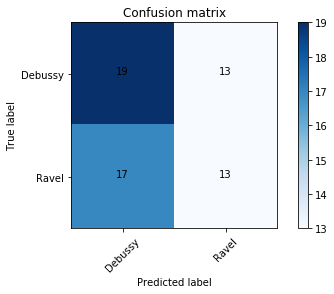

LinearSVC
[[19 13]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.3162) & 0.6867 (0.3666)
n-gram range (1, 4)
[[19  8]
 [ 8 12]]


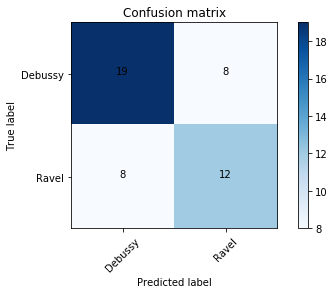

LinearSVC
[[19  8]
 [ 8 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)

-----


n-gram range (1, 1)
[[16 10]
 [ 7 11]]


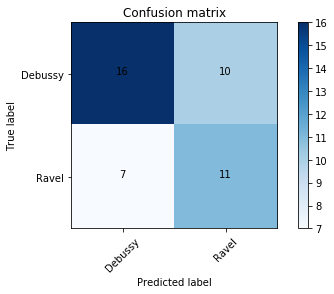

LinearSVC
[[16 10]
 [ 7 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.1995) & 0.7733 (0.2633)
n-gram range (2, 2)
[[20 15]
 [19 17]]


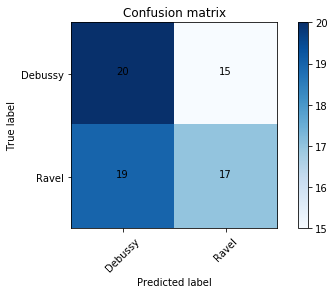

LinearSVC
[[20 15]
 [19 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.3239) & 0.8067 (0.3492)
n-gram range (3, 3)
[[19 13]
 [17 13]]


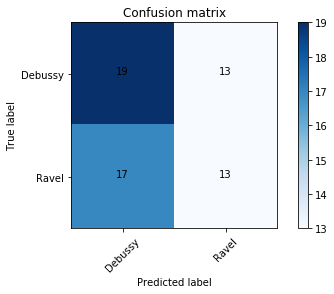

LinearSVC
[[19 13]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2945) & 0.7233 (0.3596)
n-gram range (4, 4)
[[17 10]
 [11  9]]


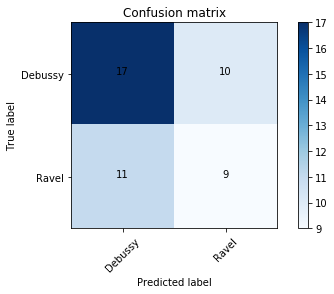

LinearSVC
[[17 10]
 [11  9]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7333 (0.2961) & 0.6567 (0.3644)
n-gram range (1, 2)
[[19  9]
 [ 9 13]]


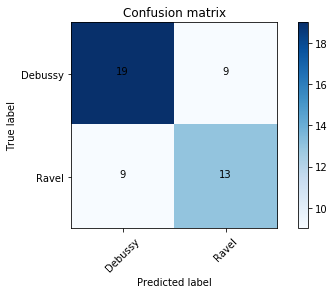

LinearSVC
[[19  9]
 [ 9 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)
n-gram range (3, 4)
[[19 13]
 [17 13]]


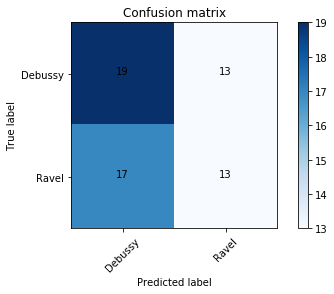

LinearSVC
[[19 13]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.705 (0.3279)
n-gram range (1, 4)
[[18 10]
 [10 12]]


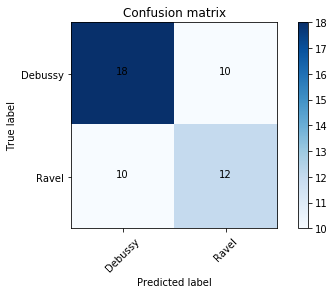

LinearSVC
[[18 10]
 [10 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2331) & 0.805 (0.3166)

-----


n-gram range (1, 1)
[[17  8]
 [ 5 11]]


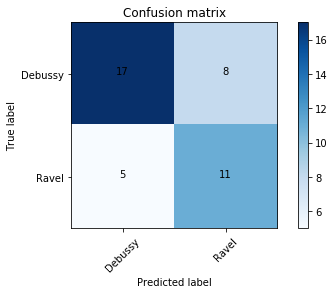

LinearSVC
[[17  8]
 [ 5 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2194) & 0.8333 (0.2833)
n-gram range (2, 2)
[[20 13]
 [16 16]]


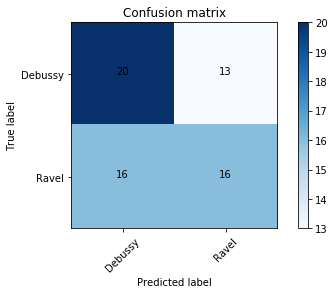

LinearSVC
[[20 13]
 [16 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.8133 (0.3011)
n-gram range (3, 3)
[[18 10]
 [13  9]]


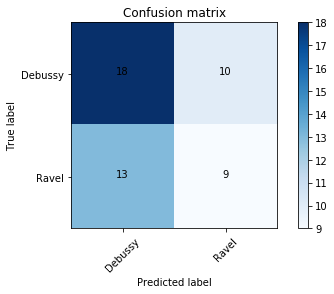

LinearSVC
[[18 10]
 [13  9]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7167 (0.2086) & 0.5867 (0.3011)
n-gram range (4, 4)
[[19 11]
 [14 12]]


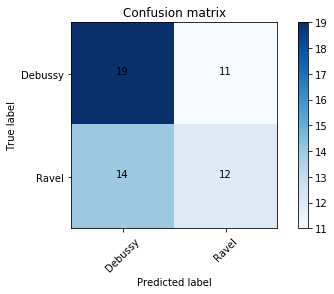

LinearSVC
[[19 11]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.254) & 0.7383 (0.3403)
n-gram range (1, 2)
[[19 14]
 [14 18]]


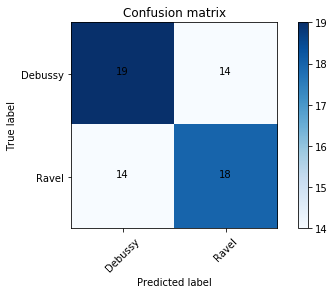

LinearSVC
[[19 14]
 [14 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)
n-gram range (3, 4)
[[19 11]
 [15 11]]


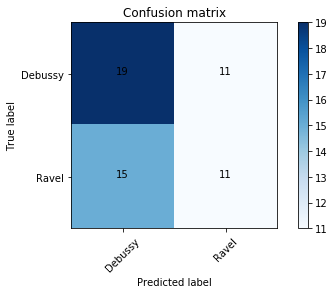

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2108) & 0.6533 (0.3124)
n-gram range (1, 4)
[[19 16]
 [18 18]]


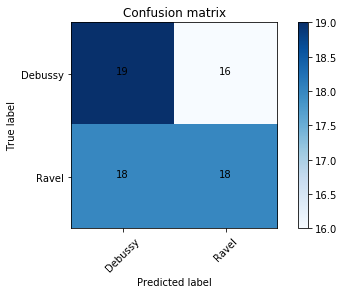

LinearSVC
[[19 16]
 [18 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2331) & 0.8583 (0.2547)

-----


n-gram range (1, 1)
[[21 20]
 [19 20]]


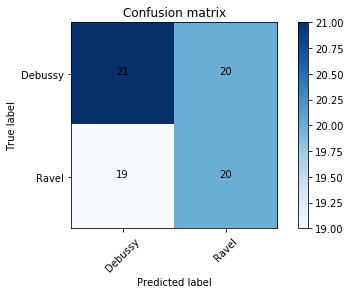

LinearSVC
[[21 20]
 [19 20]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.2491) & 0.8583 (0.2993)
n-gram range (2, 2)
[[20 15]
 [19 17]]


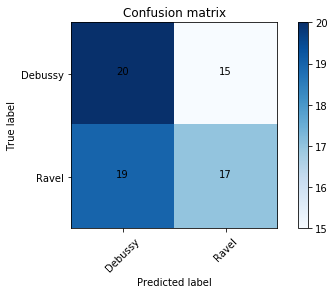

LinearSVC
[[20 15]
 [19 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2331) & 0.8317 (0.2887)
n-gram range (3, 3)
[[19 11]
 [15 11]]


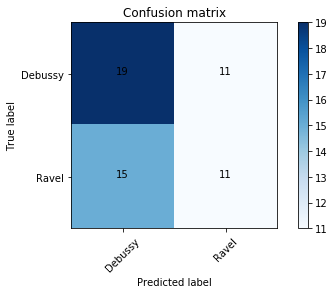

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2108) & 0.6267 (0.3223)
n-gram range (4, 4)
[[19 11]
 [14 12]]


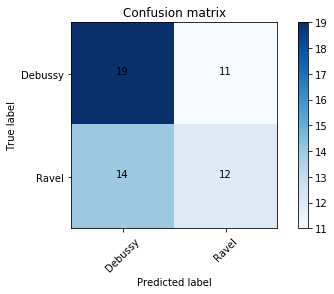

LinearSVC
[[19 11]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.322) & 0.72 (0.3795)
n-gram range (1, 2)
[[18 11]
 [10 14]]


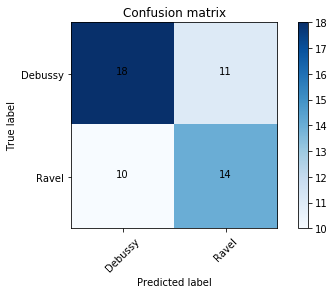

LinearSVC
[[18 11]
 [10 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2194) & 0.8333 (0.2833)
n-gram range (3, 4)
[[19 14]
 [18 14]]


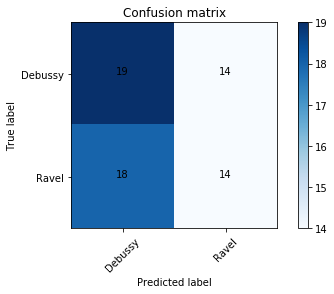

LinearSVC
[[19 14]
 [18 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2629) & 0.6717 (0.3485)
n-gram range (1, 4)
[[18 12]
 [12 14]]


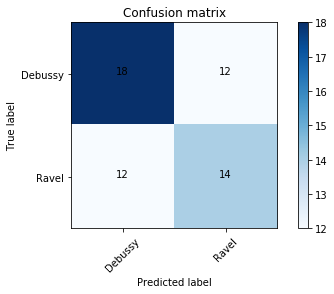

LinearSVC
[[18 12]
 [12 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.1995) & 0.8067 (0.2693)

-----


n-gram range (1, 1)
[[19  9]
 [ 8 14]]


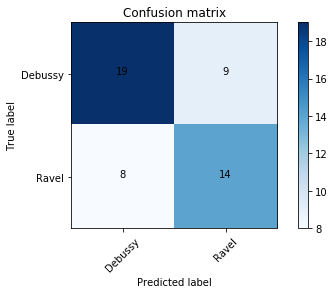

LinearSVC
[[19  9]
 [ 8 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.94 (0.1897)
n-gram range (2, 2)
[[20 11]
 [15 13]]


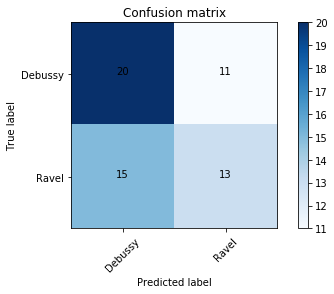

LinearSVC
[[20 11]
 [15 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2222) & 0.7467 (0.3278)
n-gram range (3, 3)
[[18 14]
 [17 13]]


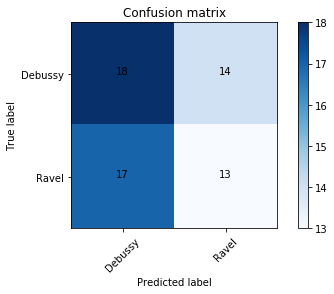

LinearSVC
[[18 14]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.286) & 0.69 (0.3463)
n-gram range (4, 4)
[[19 10]
 [13 11]]


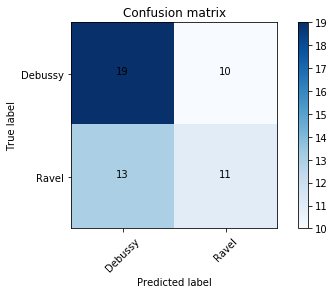

LinearSVC
[[19 10]
 [13 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.254) & 0.7383 (0.3403)
n-gram range (1, 2)
[[19 14]
 [14 18]]


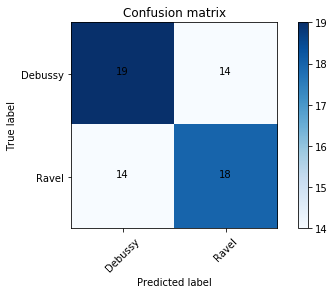

LinearSVC
[[19 14]
 [14 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.2108) & 0.925 (0.2372)
n-gram range (3, 4)
[[19 12]
 [16 12]]


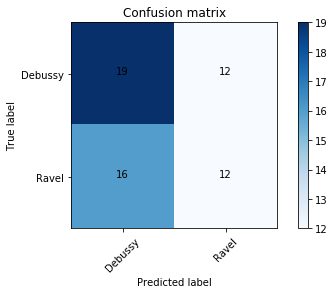

LinearSVC
[[19 12]
 [16 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.2257) & 0.6467 (0.319)
n-gram range (1, 4)
[[19 11]
 [11 15]]


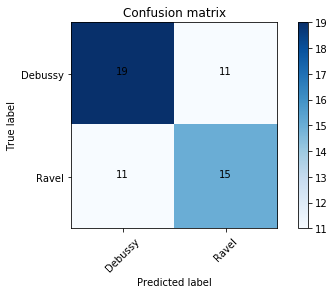

LinearSVC
[[19 11]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.9067 (0.2066)

-----


n-gram range (1, 1)
[[19 14]
 [14 18]]


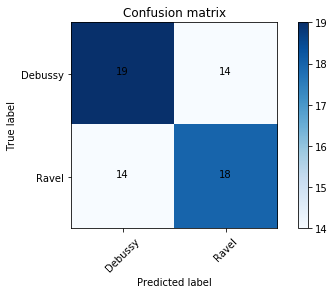

LinearSVC
[[19 14]
 [14 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.9 (0.225)
n-gram range (2, 2)
[[20 10]
 [14 12]]


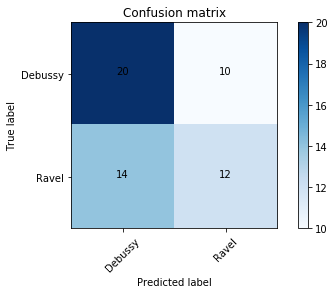

LinearSVC
[[20 10]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2222) & 0.7467 (0.3278)
n-gram range (3, 3)
[[19 12]
 [16 12]]


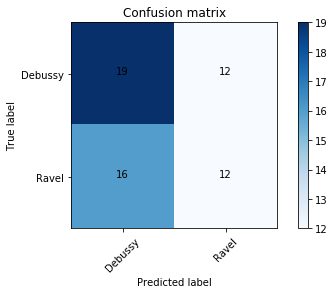

LinearSVC
[[19 12]
 [16 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2331) & 0.7117 (0.3201)
n-gram range (4, 4)
[[19 10]
 [12 12]]


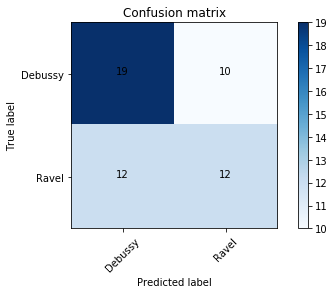

LinearSVC
[[19 10]
 [12 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.1721) & 0.7867 (0.286)
n-gram range (1, 2)
[[21 17]
 [17 19]]


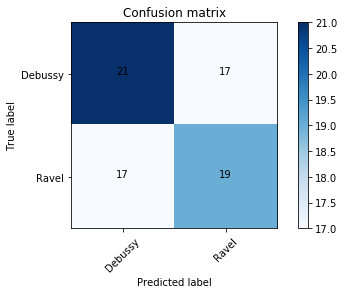

LinearSVC
[[21 17]
 [17 19]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.9 (0.225)
n-gram range (3, 4)
[[19 11]
 [15 11]]


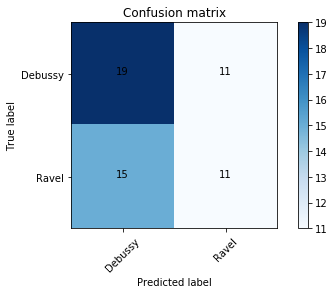

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.6783 (0.3419)
n-gram range (1, 4)
[[19 11]
 [11 15]]


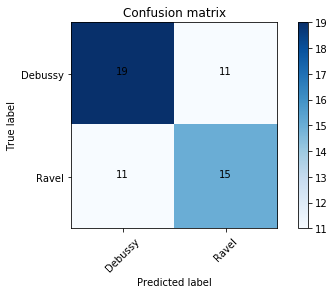

LinearSVC
[[19 11]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)

-----


n-gram range (1, 1)
[[18 12]
 [12 14]]


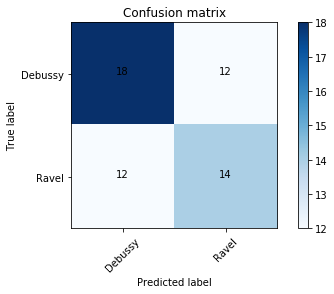

LinearSVC
[[18 12]
 [12 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.3239) & 0.8067 (0.3492)
n-gram range (2, 2)
[[20 13]
 [17 15]]


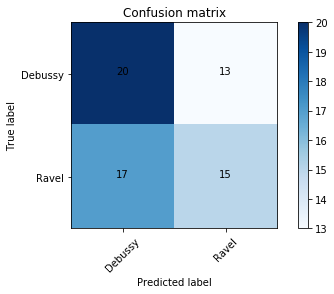

LinearSVC
[[20 13]
 [17 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.1995) & 0.7533 (0.319)
n-gram range (3, 3)
[[19 13]
 [17 13]]


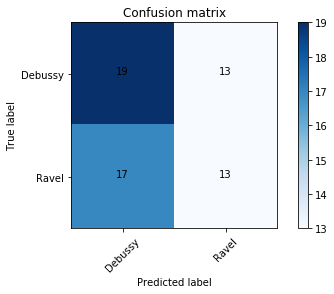

LinearSVC
[[19 13]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2811) & 0.73 (0.3521)
n-gram range (4, 4)
[[19  8]
 [10 10]]


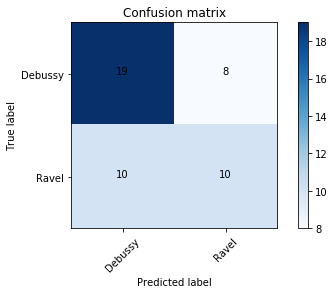

LinearSVC
[[19  8]
 [10 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2222) & 0.7467 (0.3278)
n-gram range (1, 2)
[[18 12]
 [11 15]]


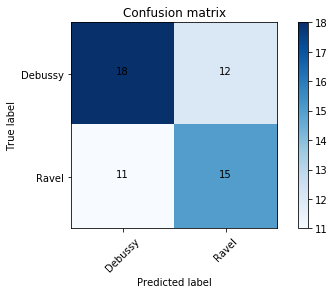

LinearSVC
[[18 12]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.84 (0.2707)
n-gram range (3, 4)
[[19 10]
 [14 10]]


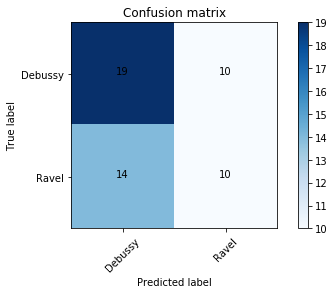

LinearSVC
[[19 10]
 [14 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2331) & 0.685 (0.335)
n-gram range (1, 4)
[[19  9]
 [ 9 13]]


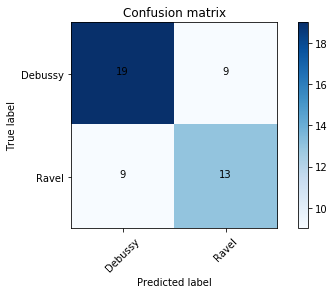

LinearSVC
[[19  9]
 [ 9 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.88 (0.253)

-----


n-gram range (1, 1)
[[20 11]
 [ 9 13]]


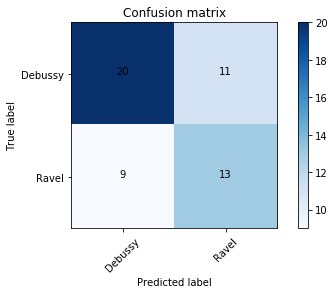

LinearSVC
[[20 11]
 [ 9 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.88 (0.253)
n-gram range (2, 2)
[[20 12]
 [16 14]]


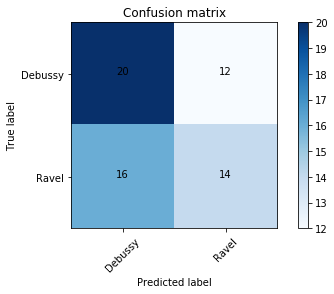

LinearSVC
[[20 12]
 [16 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2331) & 0.805 (0.3166)
n-gram range (3, 3)
[[19 12]
 [16 12]]


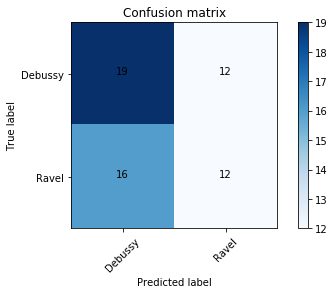

LinearSVC
[[19 12]
 [16 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.275) & 0.665 (0.3549)
n-gram range (4, 4)
[[19  9]
 [12 10]]


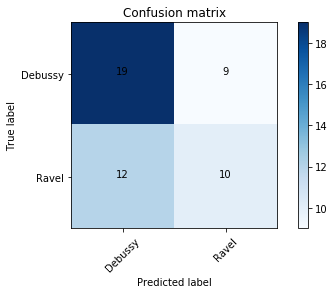

LinearSVC
[[19  9]
 [12 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2194) & 0.6867 (0.3312)
n-gram range (1, 2)
[[18 10]
 [ 9 13]]


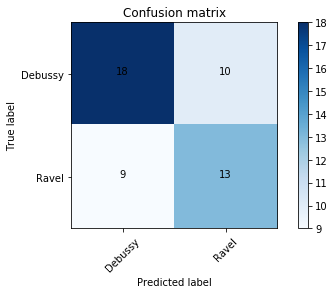

LinearSVC
[[18 10]
 [ 9 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.84 (0.2707)
n-gram range (3, 4)
[[19 14]
 [18 14]]


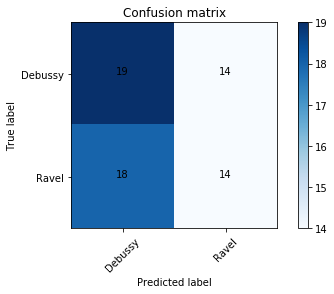

LinearSVC
[[19 14]
 [18 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.3263) & 0.68 (0.3729)
n-gram range (1, 4)
[[21 14]
 [14 16]]


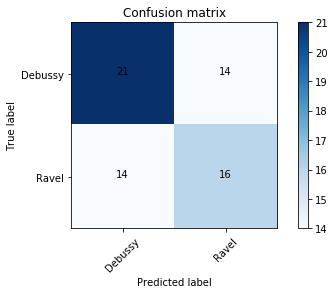

LinearSVC
[[21 14]
 [14 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)

-----


n-gram range (1, 1)
[[19 11]
 [12 14]]


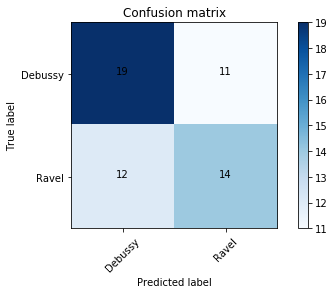

LinearSVC
[[19 11]
 [12 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.225) & 0.865 (0.2868)
n-gram range (2, 2)
[[19 16]
 [19 17]]


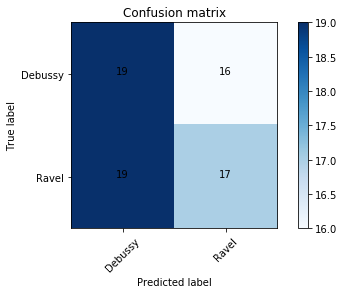

LinearSVC
[[19 16]
 [19 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.254) & 0.7917 (0.2972)
n-gram range (3, 3)
[[19 13]
 [17 13]]


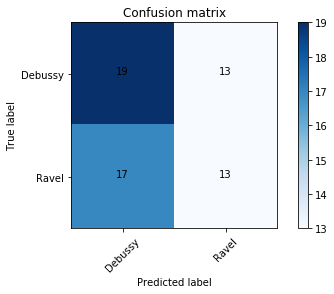

LinearSVC
[[19 13]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.705 (0.3279)
n-gram range (4, 4)
[[19 12]
 [15 13]]


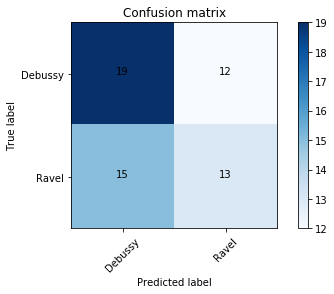

LinearSVC
[[19 12]
 [15 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2194) & 0.7133 (0.3159)
n-gram range (1, 2)
[[19 11]
 [11 15]]


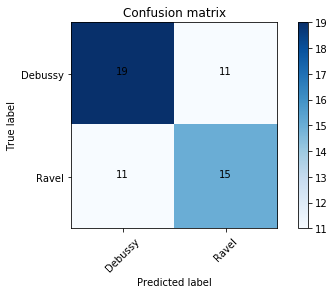

LinearSVC
[[19 11]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)
n-gram range (3, 4)
[[19 10]
 [13 11]]


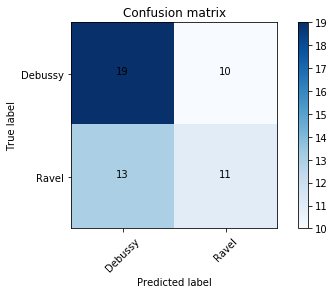

LinearSVC
[[19 10]
 [13 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.254) & 0.7383 (0.3403)
n-gram range (1, 4)
[[19 11]
 [11 15]]


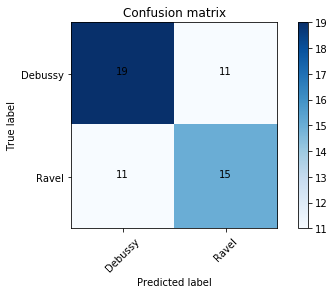

LinearSVC
[[19 11]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)

-----


n-gram range (1, 1)
[[19  9]
 [ 8 14]]


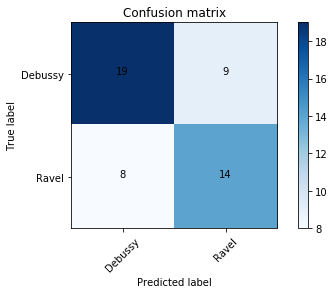

LinearSVC
[[19  9]
 [ 8 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.95 (0.1581) & 0.9333 (0.2108)
n-gram range (2, 2)
[[19 12]
 [15 13]]


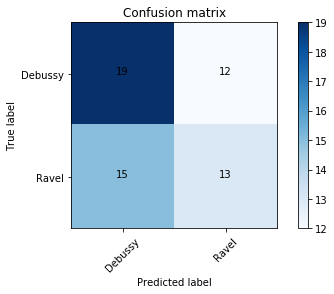

LinearSVC
[[19 12]
 [15 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2357) & 0.745 (0.332)
n-gram range (3, 3)
[[18 11]
 [14 10]]


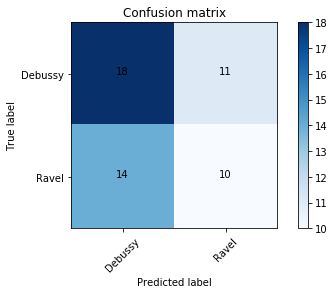

LinearSVC
[[18 11]
 [14 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7167 (0.2612) & 0.605 (0.3425)
n-gram range (4, 4)
[[19 13]
 [15 15]]


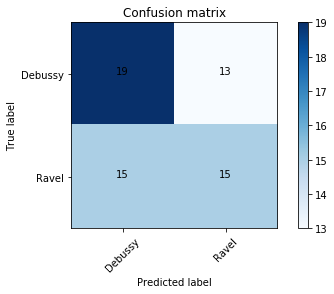

LinearSVC
[[19 13]
 [15 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.1995) & 0.8067 (0.2693)
n-gram range (1, 2)
[[20 13]
 [14 18]]


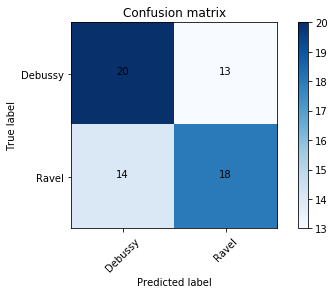

LinearSVC
[[20 13]
 [14 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.9667 (0.1054)
n-gram range (3, 4)
[[19 10]
 [14 10]]


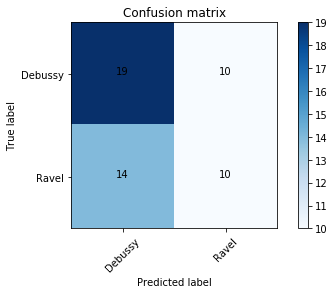

LinearSVC
[[19 10]
 [14 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.1933) & 0.66 (0.3054)
n-gram range (1, 4)
[[19 11]
 [11 15]]


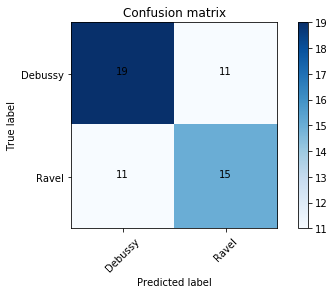

LinearSVC
[[19 11]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)

-----


n-gram range (1, 1)
[[18 12]
 [11 15]]


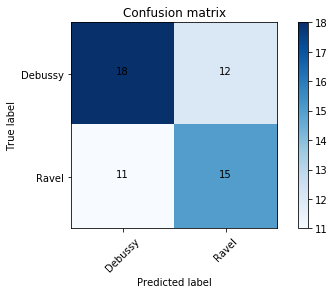

LinearSVC
[[18 12]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.2491) & 0.8583 (0.2993)
n-gram range (2, 2)
[[20  9]
 [13 11]]


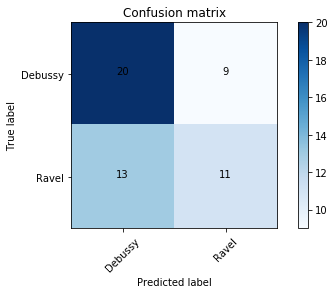

LinearSVC
[[20  9]
 [13 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.1721) & 0.76 (0.3098)
n-gram range (3, 3)
[[20 11]
 [16 12]]


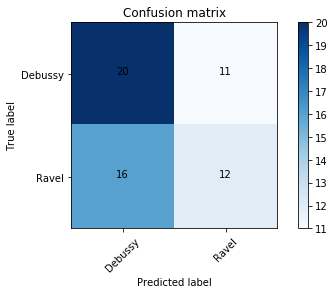

LinearSVC
[[20 11]
 [16 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2357) & 0.745 (0.332)
n-gram range (4, 4)
[[18 12]
 [14 12]]


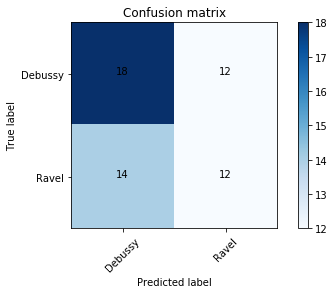

LinearSVC
[[18 12]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.3063) & 0.7167 (0.3668)
n-gram range (1, 2)
[[20 12]
 [13 17]]


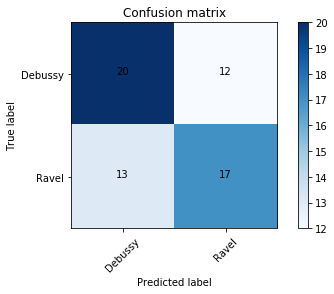

LinearSVC
[[20 12]
 [13 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.94 (0.1897)
n-gram range (3, 4)
[[19 12]
 [15 13]]


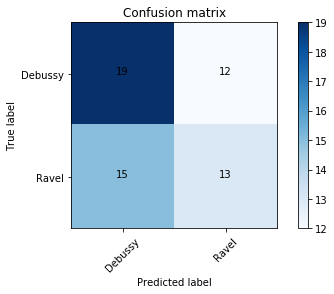

LinearSVC
[[19 12]
 [15 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2364) & 0.7067 (0.3239)
n-gram range (1, 4)
[[20 12]
 [11 13]]


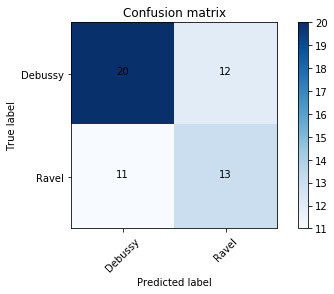

LinearSVC
[[20 12]
 [11 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.161) & 0.82 (0.2898)

-----


n-gram range (1, 1)
[[19 10]
 [11 13]]


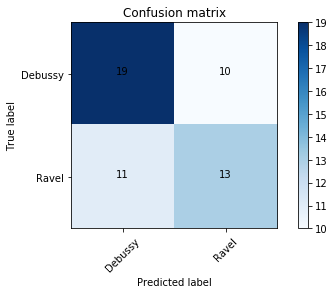

LinearSVC
[[19 10]
 [11 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.225) & 0.865 (0.2868)
n-gram range (2, 2)
[[20 14]
 [18 16]]


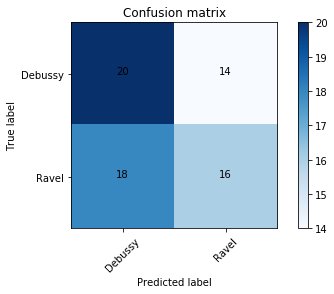

LinearSVC
[[20 14]
 [18 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2331) & 0.8317 (0.2887)
n-gram range (3, 3)
[[19 10]
 [14 10]]


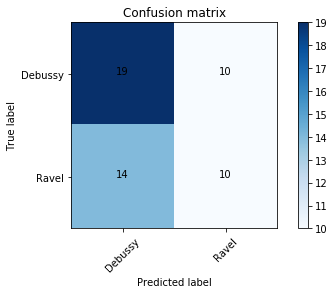

LinearSVC
[[19 10]
 [14 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.1933) & 0.66 (0.3054)
n-gram range (4, 4)
[[19 12]
 [15 13]]


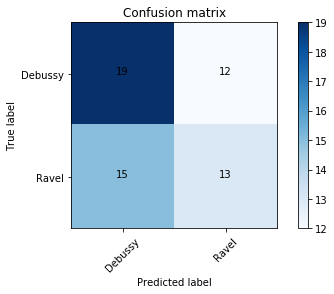

LinearSVC
[[19 12]
 [15 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.3443) & 0.7067 (0.3928)
n-gram range (1, 2)
[[18 10]
 [ 9 13]]


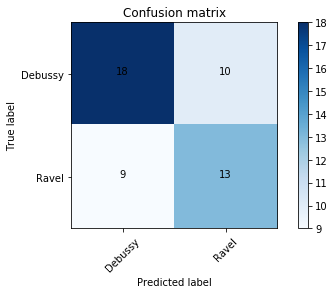

LinearSVC
[[18 10]
 [ 9 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.84 (0.2707)
n-gram range (3, 4)
[[19 11]
 [15 11]]


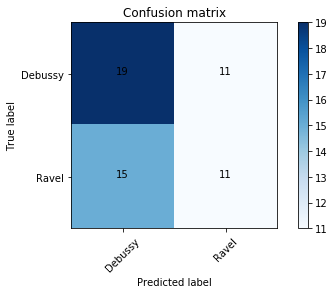

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2108) & 0.6533 (0.3124)
n-gram range (1, 4)
[[17 11]
 [ 9 13]]


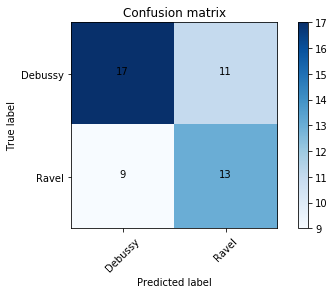

LinearSVC
[[17 11]
 [ 9 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.1995) & 0.78 (0.2966)

-----


n-gram range (1, 1)
[[18 10]
 [ 8 14]]


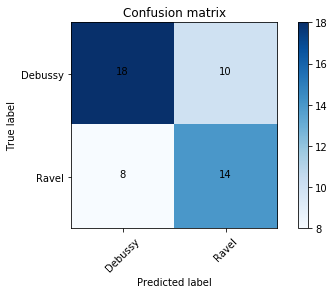

LinearSVC
[[18 10]
 [ 8 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.9067 (0.2066)
n-gram range (2, 2)
[[20 12]
 [16 14]]


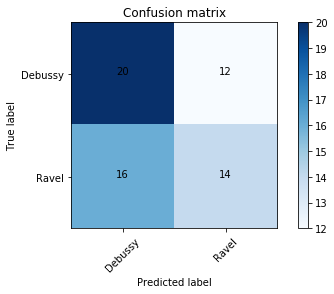

LinearSVC
[[20 12]
 [16 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.1995) & 0.7533 (0.319)
n-gram range (3, 3)
[[19 11]
 [15 11]]


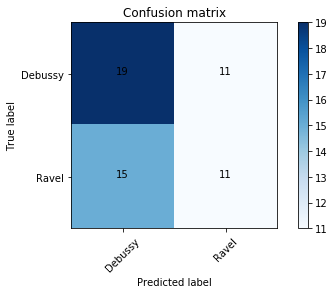

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2629) & 0.6717 (0.3485)
n-gram range (4, 4)
[[19 14]
 [16 16]]


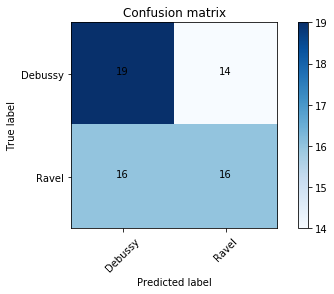

LinearSVC
[[19 14]
 [16 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.36) & 0.825 (0.3736)
n-gram range (1, 2)
[[19 13]
 [13 17]]


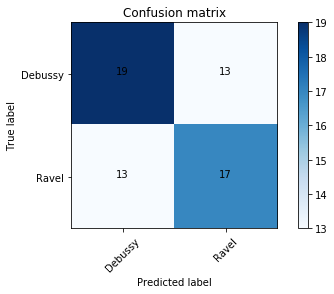

LinearSVC
[[19 13]
 [13 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)
n-gram range (3, 4)
[[19 11]
 [15 11]]


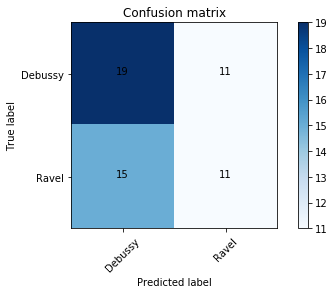

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.6783 (0.3419)
n-gram range (1, 4)
[[20 15]
 [14 16]]


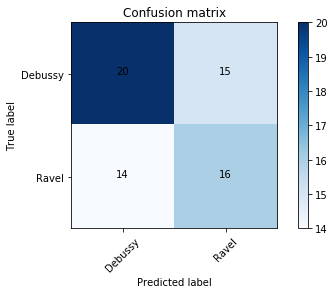

LinearSVC
[[20 15]
 [14 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.84 (0.2707)

-----


n-gram range (1, 1)
[[18 11]
 [ 9 15]]


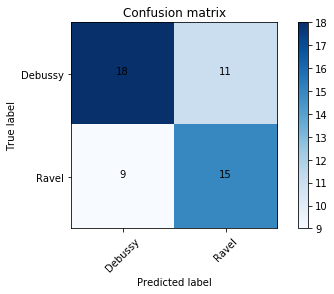

LinearSVC
[[18 11]
 [ 9 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.88 (0.253)
n-gram range (2, 2)
[[20 14]
 [18 16]]


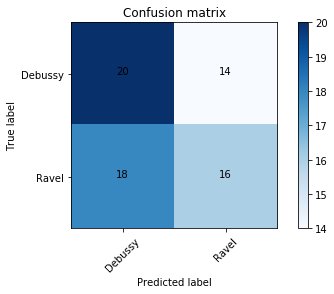

LinearSVC
[[20 14]
 [18 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2722) & 0.7917 (0.3362)
n-gram range (3, 3)
[[19 16]
 [20 16]]


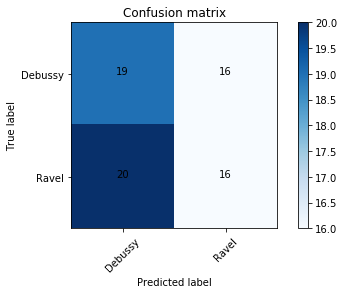

LinearSVC
[[19 16]
 [20 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2945) & 0.7233 (0.3596)
n-gram range (4, 4)
[[17 12]
 [12 12]]


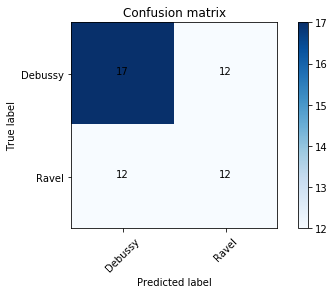

LinearSVC
[[17 12]
 [12 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.705 (0.3279)
n-gram range (1, 2)
[[17 11]
 [10 12]]


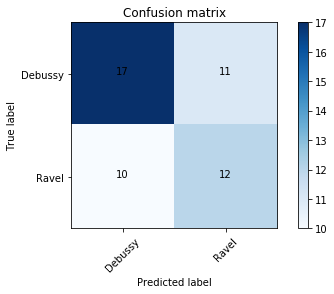

LinearSVC
[[17 11]
 [10 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2357) & 0.745 (0.332)
n-gram range (3, 4)
[[19 11]
 [15 11]]


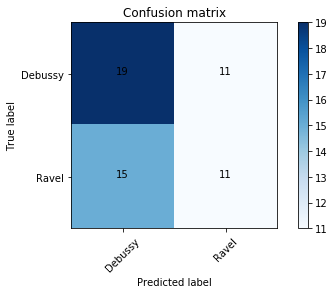

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.6783 (0.3419)
n-gram range (1, 4)
[[19 10]
 [10 14]]


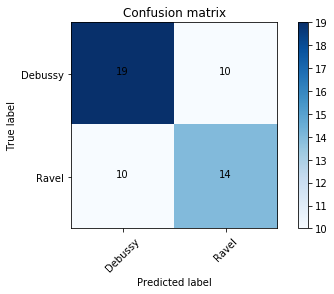

LinearSVC
[[19 10]
 [10 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.9 (0.225)

-----


n-gram range (1, 1)
[[18  9]
 [ 7 13]]


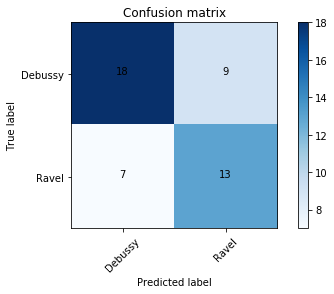

LinearSVC
[[18  9]
 [ 7 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.9067 (0.2066)
n-gram range (2, 2)
[[20 15]
 [20 16]]


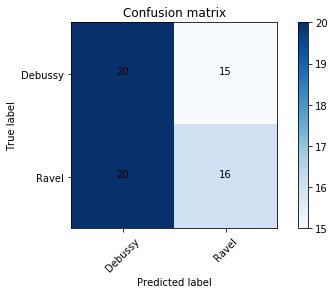

LinearSVC
[[20 15]
 [20 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.254) & 0.765 (0.3207)
n-gram range (3, 3)
[[19 11]
 [15 11]]


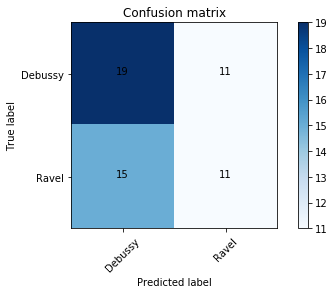

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2629) & 0.6717 (0.3485)
n-gram range (4, 4)
[[19  9]
 [12 10]]


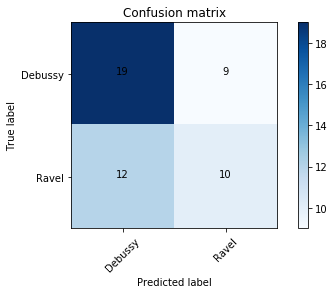

LinearSVC
[[19  9]
 [12 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2194) & 0.6867 (0.3312)
n-gram range (1, 2)
[[18 10]
 [ 9 13]]


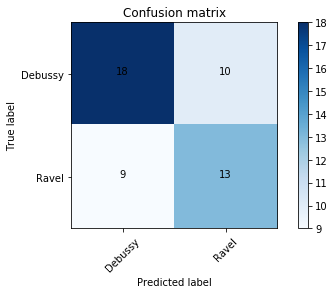

LinearSVC
[[18 10]
 [ 9 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.8133 (0.3011)
n-gram range (3, 4)
[[19 15]
 [19 15]]


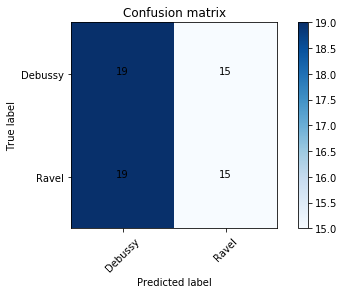

LinearSVC
[[19 15]
 [19 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7333 (0.3352) & 0.6733 (0.379)
n-gram range (1, 4)
[[18 10]
 [ 9 13]]


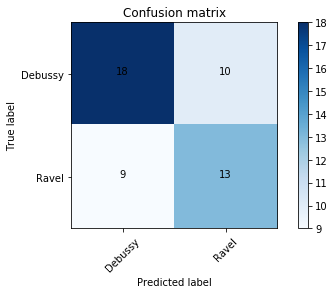

LinearSVC
[[18 10]
 [ 9 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.84 (0.2707)

-----


n-gram range (1, 1)
[[20 12]
 [14 16]]


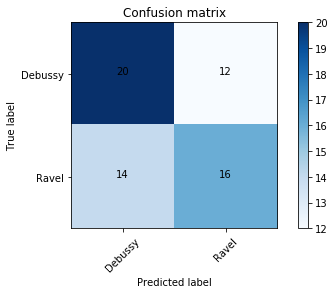

LinearSVC
[[20 12]
 [14 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.2108) & 0.925 (0.2372)
n-gram range (2, 2)
[[19 10]
 [13 11]]


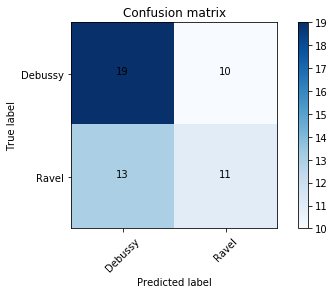

LinearSVC
[[19 10]
 [13 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.1995) & 0.72 (0.3076)
n-gram range (3, 3)
[[19 11]
 [15 11]]


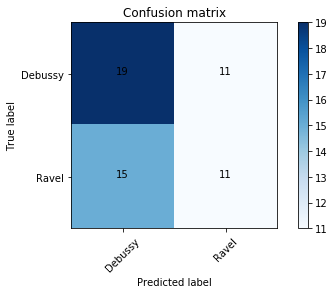

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2629) & 0.6717 (0.3485)
n-gram range (4, 4)
[[19 10]
 [13 11]]


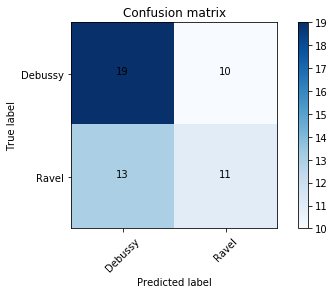

LinearSVC
[[19 10]
 [13 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.1995) & 0.72 (0.3076)
n-gram range (1, 2)
[[19 14]
 [14 18]]


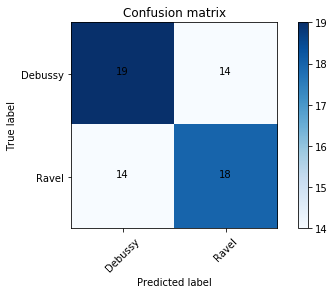

LinearSVC
[[19 14]
 [14 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.9 (0.225)
n-gram range (3, 4)
[[19 12]
 [16 12]]


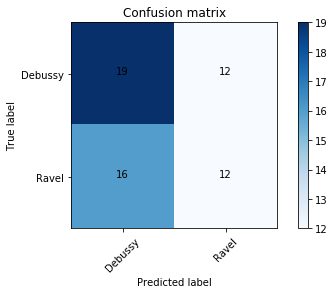

LinearSVC
[[19 12]
 [16 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.275) & 0.665 (0.3549)
n-gram range (1, 4)
[[17 11]
 [10 12]]


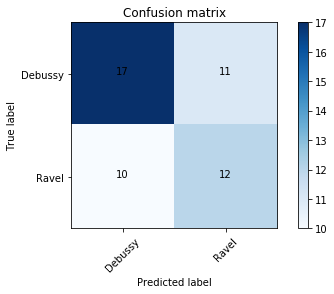

LinearSVC
[[17 11]
 [10 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2699) & 0.7317 (0.3482)

-----


n-gram range (1, 1)
[[19  9]
 [ 8 14]]


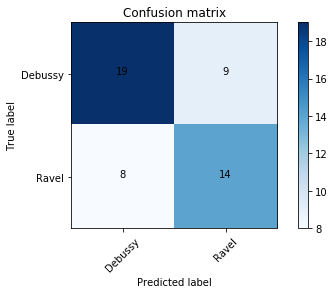

LinearSVC
[[19  9]
 [ 8 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.95 (0.1581) & 0.9333 (0.2108)
n-gram range (2, 2)
[[20 15]
 [18 18]]


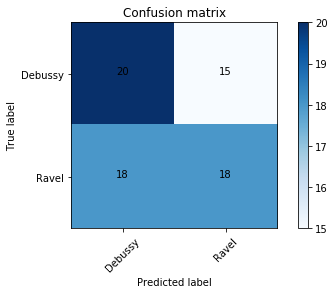

LinearSVC
[[20 15]
 [18 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.225) & 0.8917 (0.2486)
n-gram range (3, 3)
[[19 11]
 [15 11]]


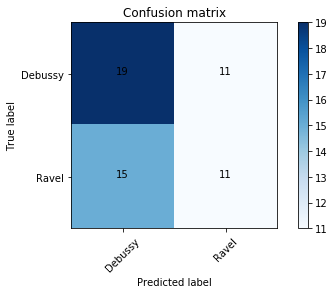

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2108) & 0.6533 (0.3124)
n-gram range (4, 4)
[[18 12]
 [14 12]]


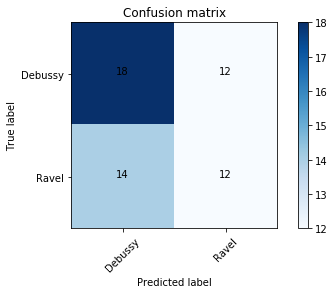

LinearSVC
[[18 12]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.3622) & 0.6983 (0.4023)
n-gram range (1, 2)
[[18 15]
 [16 16]]


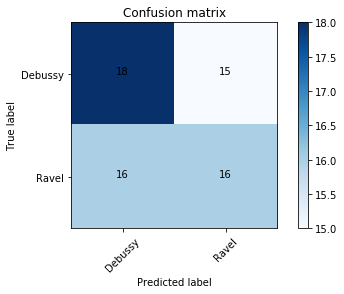

LinearSVC
[[18 15]
 [16 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.254) & 0.765 (0.3207)
n-gram range (3, 4)
[[19  8]
 [11  9]]


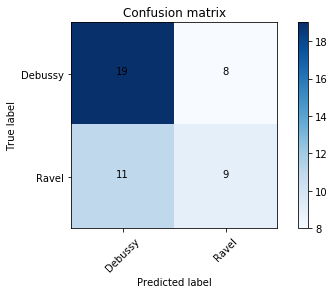

LinearSVC
[[19  8]
 [11  9]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.1995) & 0.6933 (0.3239)
n-gram range (1, 4)
[[19 14]
 [14 18]]


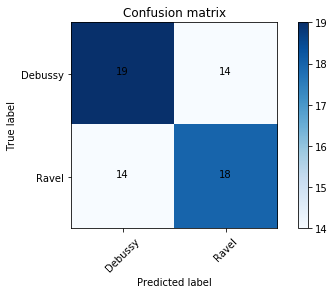

LinearSVC
[[19 14]
 [14 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)

-----


n-gram range (1, 1)
[[19 11]
 [10 16]]


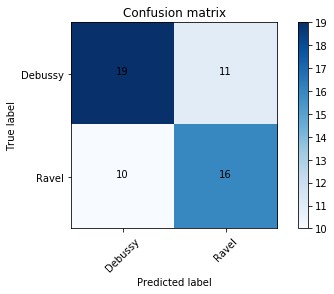

LinearSVC
[[19 11]
 [10 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.9667 (0.1054)
n-gram range (2, 2)
[[19 11]
 [14 12]]


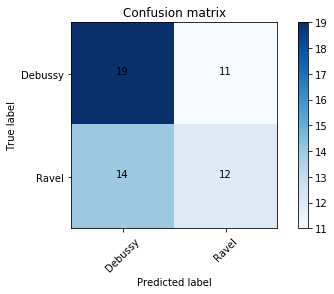

LinearSVC
[[19 11]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2194) & 0.7133 (0.3159)
n-gram range (3, 3)
[[19 11]
 [15 11]]


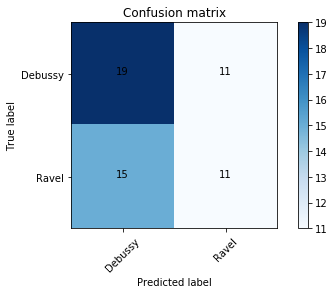

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2629) & 0.6717 (0.3485)
n-gram range (4, 4)
[[19 11]
 [14 12]]


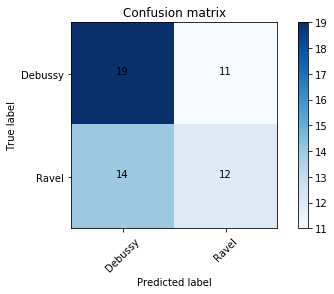

LinearSVC
[[19 11]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2699) & 0.7317 (0.3482)
n-gram range (1, 2)
[[19 12]
 [13 15]]


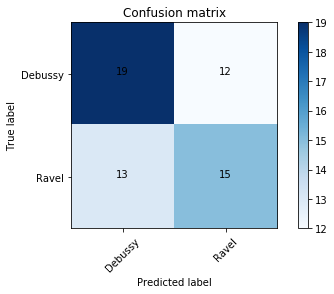

LinearSVC
[[19 12]
 [13 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.84 (0.2707)
n-gram range (3, 4)
[[19 15]
 [19 15]]


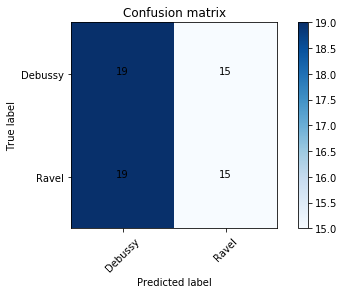

LinearSVC
[[19 15]
 [19 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.3063) & 0.7167 (0.3668)
n-gram range (1, 4)
[[19 13]
 [14 16]]


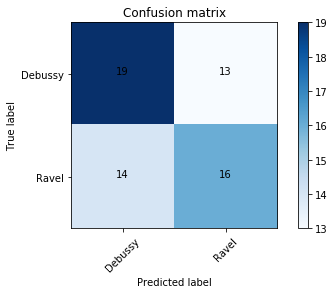

LinearSVC
[[19 13]
 [14 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.2491) & 0.8583 (0.2993)

-----


n-gram range (1, 1)
[[19  9]
 [ 8 14]]


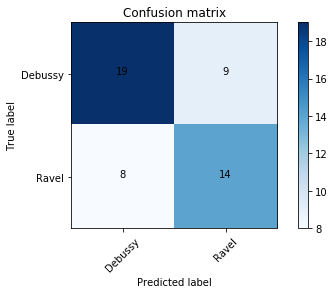

LinearSVC
[[19  9]
 [ 8 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.95 (0.1581) & 0.9333 (0.2108)
n-gram range (2, 2)
[[20 12]
 [16 14]]


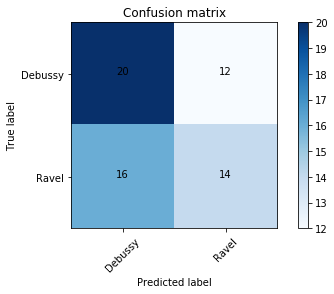

LinearSVC
[[20 12]
 [16 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2331) & 0.805 (0.3166)
n-gram range (3, 3)
[[19 13]
 [17 13]]


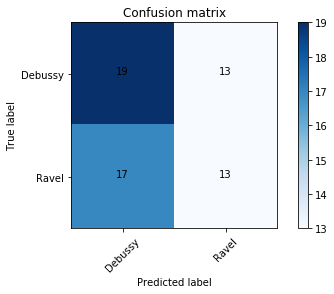

LinearSVC
[[19 13]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.705 (0.3279)
n-gram range (4, 4)
[[18 10]
 [11 11]]


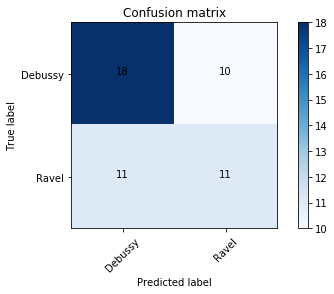

LinearSVC
[[18 10]
 [11 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2699) & 0.7317 (0.3482)
n-gram range (1, 2)
[[20 12]
 [13 17]]


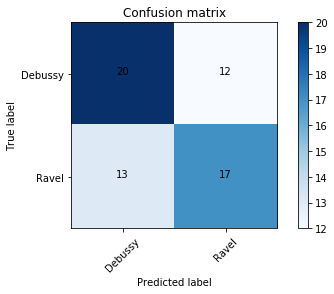

LinearSVC
[[20 12]
 [13 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.95 (0.1581) & 0.9333 (0.2108)
n-gram range (3, 4)
[[19 13]
 [17 13]]


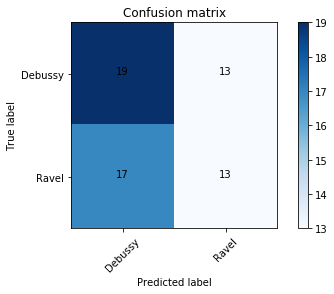

LinearSVC
[[19 13]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.3531) & 0.705 (0.3961)
n-gram range (1, 4)
[[18 10]
 [10 12]]


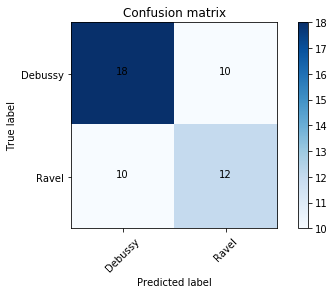

LinearSVC
[[18 10]
 [10 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2331) & 0.8317 (0.2887)

-----


n-gram range (1, 1)
[[19  8]
 [ 7 13]]


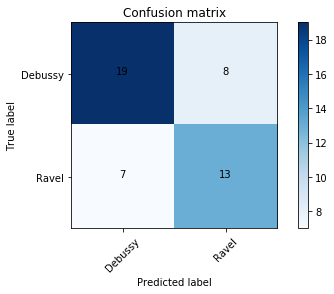

LinearSVC
[[19  8]
 [ 7 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.94 (0.1897)
n-gram range (2, 2)
[[20 12]
 [15 15]]


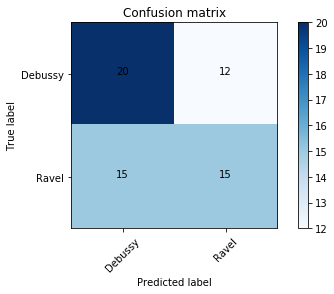

LinearSVC
[[20 12]
 [15 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.84 (0.2707)
n-gram range (3, 3)
[[18 10]
 [13  9]]


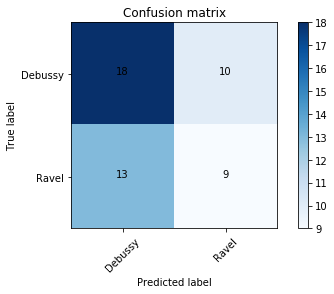

LinearSVC
[[18 10]
 [13  9]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7 (0.322) & 0.5867 (0.3742)
n-gram range (4, 4)
[[19 10]
 [13 11]]


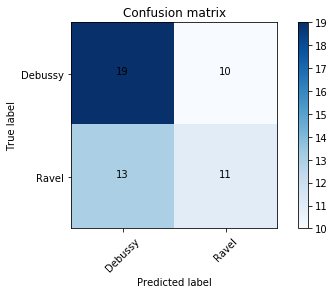

LinearSVC
[[19 10]
 [13 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2364) & 0.68 (0.3382)
n-gram range (1, 2)
[[18  7]
 [ 6 10]]


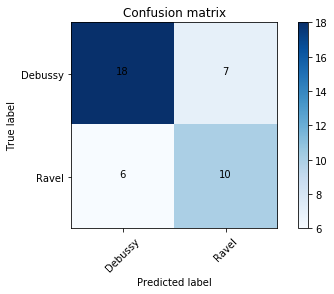

LinearSVC
[[18  7]
 [ 6 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.161) & 0.82 (0.2898)
n-gram range (3, 4)
[[19 11]
 [15 11]]


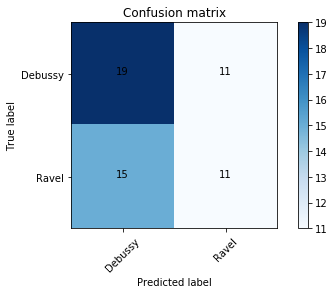

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.6783 (0.3419)
n-gram range (1, 4)
[[19 13]
 [13 17]]


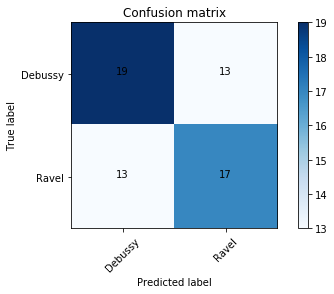

LinearSVC
[[19 13]
 [13 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.2108) & 0.925 (0.2372)

-----


n-gram range (1, 1)
[[18  9]
 [ 7 13]]


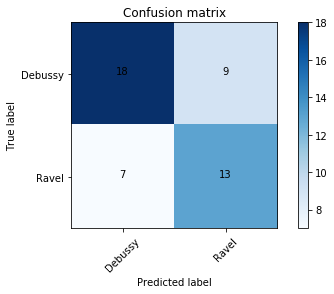

LinearSVC
[[18  9]
 [ 7 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.88 (0.253)
n-gram range (2, 2)
[[17 13]
 [14 12]]


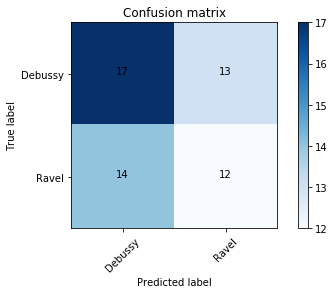

LinearSVC
[[17 13]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.286) & 0.6633 (0.3584)
n-gram range (3, 3)
[[20 13]
 [17 15]]


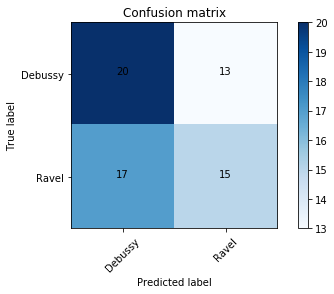

LinearSVC
[[20 13]
 [17 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2222) & 0.7467 (0.3278)
n-gram range (4, 4)
[[19  8]
 [11  9]]


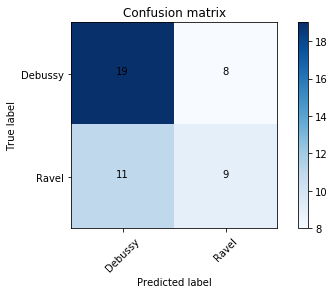

LinearSVC
[[19  8]
 [11  9]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2194) & 0.6867 (0.3312)
n-gram range (1, 2)
[[19 10]
 [10 14]]


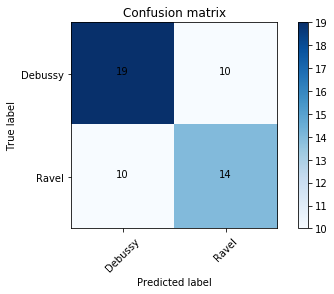

LinearSVC
[[19 10]
 [10 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.88 (0.253)
n-gram range (3, 4)
[[19 12]
 [16 12]]


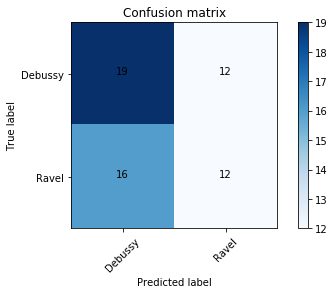

LinearSVC
[[19 12]
 [16 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2331) & 0.7117 (0.3201)
n-gram range (1, 4)
[[19 10]
 [10 14]]


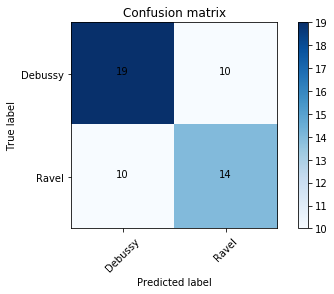

LinearSVC
[[19 10]
 [10 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)

-----


n-gram range (1, 1)
[[20 15]
 [13 17]]


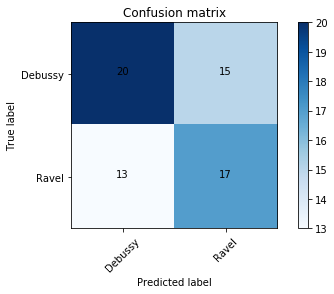

LinearSVC
[[20 15]
 [13 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)
n-gram range (2, 2)
[[19  7]
 [10  8]]


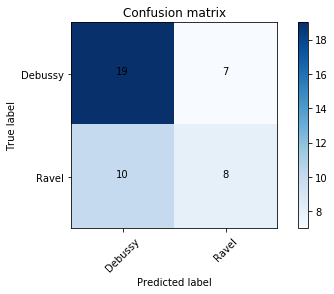

LinearSVC
[[19  7]
 [10  8]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.1757) & 0.7 (0.3162)
n-gram range (3, 3)
[[19  8]
 [12  8]]


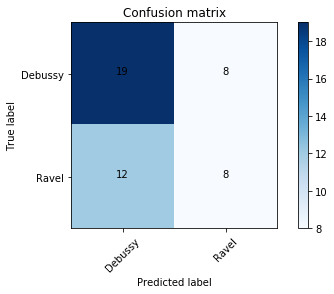

LinearSVC
[[19  8]
 [12  8]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2108) & 0.6267 (0.3223)
n-gram range (4, 4)
[[19  8]
 [11  9]]


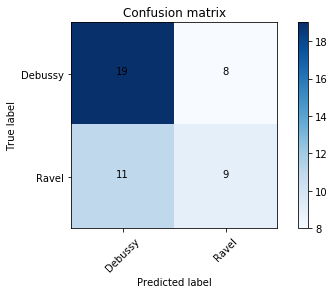

LinearSVC
[[19  8]
 [11  9]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.1995) & 0.6933 (0.3239)
n-gram range (1, 2)
[[20 14]
 [16 18]]


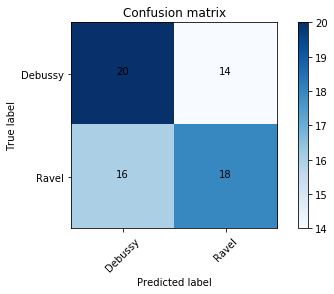

LinearSVC
[[20 14]
 [16 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.9 (0.225)
n-gram range (3, 4)
[[19  8]
 [12  8]]


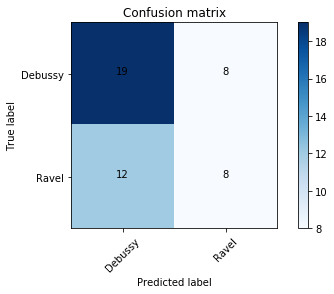

LinearSVC
[[19  8]
 [12  8]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2108) & 0.6267 (0.3223)
n-gram range (1, 4)
[[19 14]
 [17 15]]


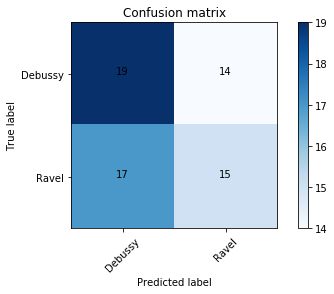

LinearSVC
[[19 14]
 [17 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.2987) & 0.7833 (0.3496)

-----


n-gram range (1, 1)
[[19 11]
 [10 16]]


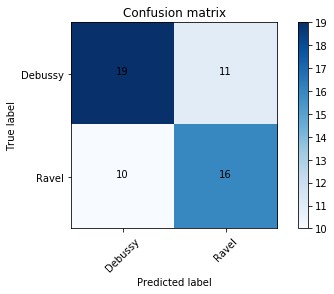

LinearSVC
[[19 11]
 [10 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.94 (0.1897)
n-gram range (2, 2)
[[18 12]
 [13 13]]


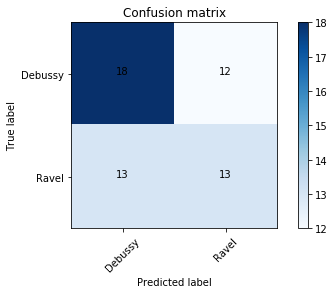

LinearSVC
[[18 12]
 [13 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.322) & 0.72 (0.3795)
n-gram range (3, 3)
[[19 13]
 [17 13]]


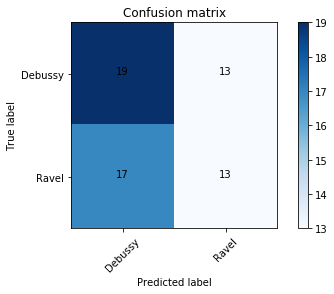

LinearSVC
[[19 13]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.6783 (0.3419)
n-gram range (4, 4)
[[19 14]
 [17 15]]


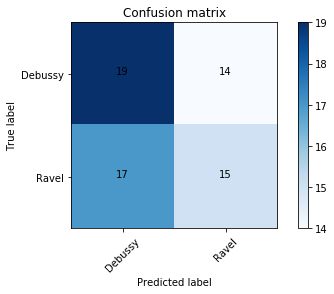

LinearSVC
[[19 14]
 [17 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.2987) & 0.7833 (0.3496)
n-gram range (1, 2)
[[21 18]
 [17 18]]


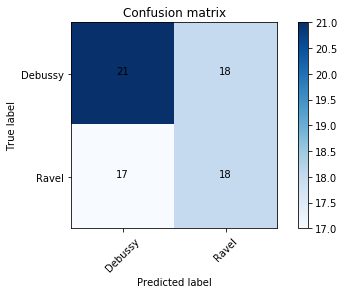

LinearSVC
[[21 18]
 [17 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.84 (0.2707)
n-gram range (3, 4)
[[19 10]
 [14 10]]


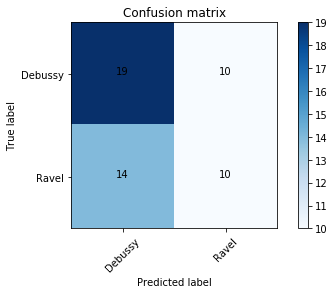

LinearSVC
[[19 10]
 [14 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.6783 (0.3419)
n-gram range (1, 4)
[[19  8]
 [ 8 12]]


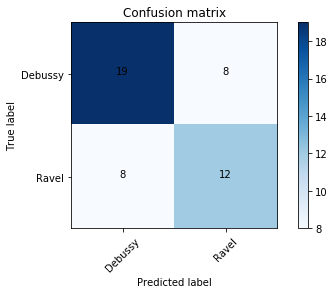

LinearSVC
[[19  8]
 [ 8 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)

-----


n-gram range (1, 1)
[[20 11]
 [11 17]]


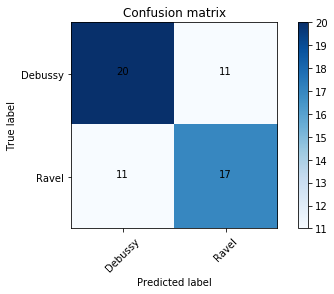

LinearSVC
[[20 11]
 [11 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
1.0 (0.0) & 1.0 (0.0)
n-gram range (2, 2)
[[20  9]
 [13 11]]


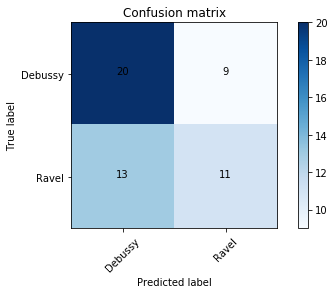

LinearSVC
[[20  9]
 [13 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.1995) & 0.7533 (0.319)
n-gram range (3, 3)
[[19 10]
 [13 11]]


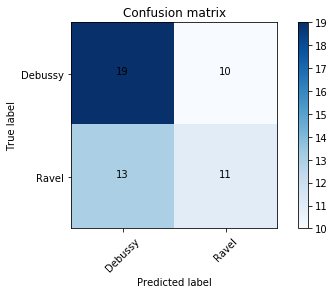

LinearSVC
[[19 10]
 [13 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2357) & 0.745 (0.332)
n-gram range (4, 4)
[[19 12]
 [15 13]]


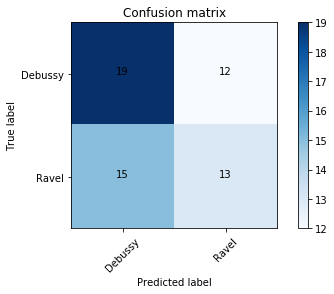

LinearSVC
[[19 12]
 [15 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2194) & 0.7133 (0.3159)
n-gram range (1, 2)
[[19 11]
 [11 15]]


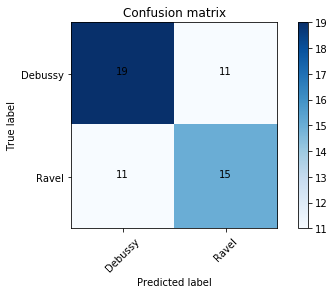

LinearSVC
[[19 11]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.9067 (0.2066)
n-gram range (3, 4)
[[19 11]
 [14 12]]


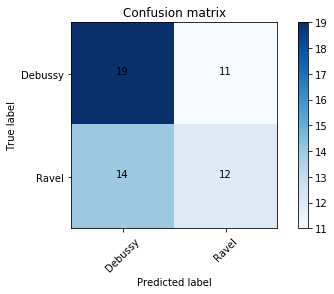

LinearSVC
[[19 11]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.254) & 0.7383 (0.3403)
n-gram range (1, 4)
[[19 11]
 [11 15]]


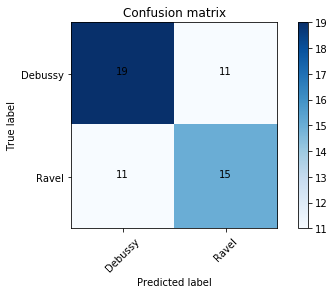

LinearSVC
[[19 11]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.9 (0.225)

-----


n-gram range (1, 1)
[[18 14]
 [14 16]]


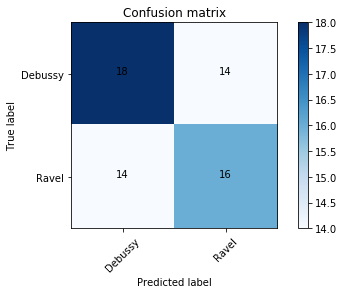

LinearSVC
[[18 14]
 [14 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.254) & 0.825 (0.3003)
n-gram range (2, 2)
[[19 10]
 [13 11]]


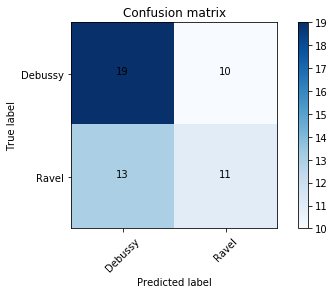

LinearSVC
[[19 10]
 [13 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2364) & 0.68 (0.3382)
n-gram range (3, 3)
[[20 10]
 [15 11]]


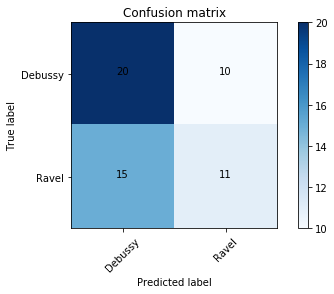

LinearSVC
[[20 10]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2194) & 0.6867 (0.3312)
n-gram range (4, 4)
[[19 11]
 [15 11]]


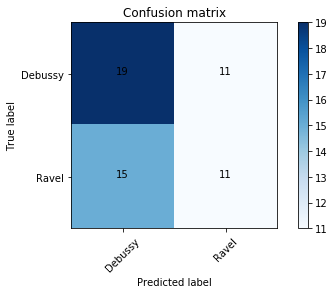

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.6783 (0.3419)
n-gram range (1, 2)
[[19  8]
 [ 8 12]]


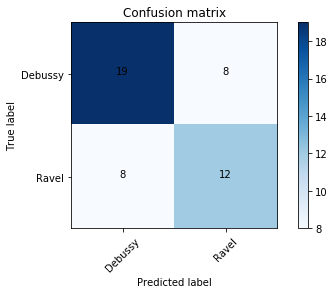

LinearSVC
[[19  8]
 [ 8 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)
n-gram range (3, 4)
[[19 11]
 [15 11]]


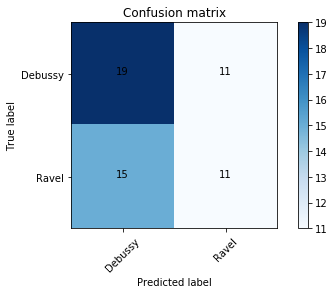

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.6783 (0.3419)
n-gram range (1, 4)
[[19 14]
 [17 15]]


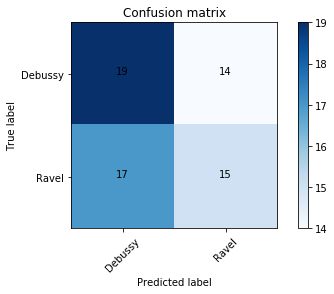

LinearSVC
[[19 14]
 [17 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.2987) & 0.7833 (0.3496)

-----


n-gram range (1, 1)
[[18  9]
 [ 7 13]]


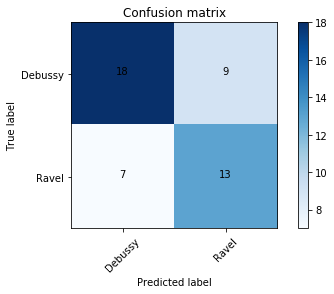

LinearSVC
[[18  9]
 [ 7 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.88 (0.253)
n-gram range (2, 2)
[[20 15]
 [19 17]]


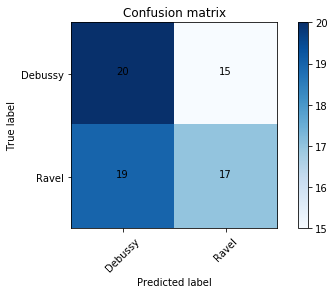

LinearSVC
[[20 15]
 [19 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.1995) & 0.8067 (0.2693)
n-gram range (3, 3)
[[19  8]
 [12  8]]


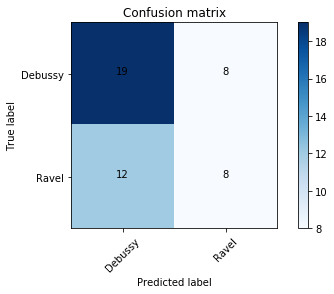

LinearSVC
[[19  8]
 [12  8]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.1933) & 0.6333 (0.3162)
n-gram range (4, 4)
[[19 10]
 [13 11]]


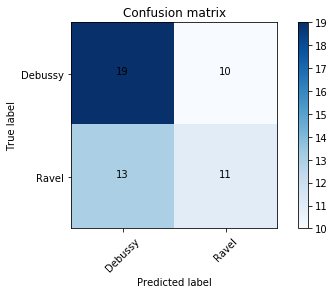

LinearSVC
[[19 10]
 [13 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.1995) & 0.72 (0.3076)
n-gram range (1, 2)
[[19 14]
 [14 18]]


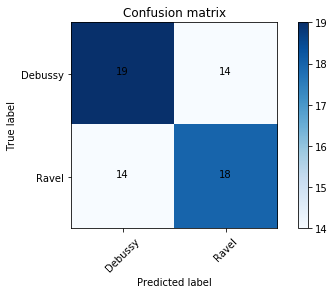

LinearSVC
[[19 14]
 [14 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)
n-gram range (3, 4)
[[19 12]
 [16 12]]


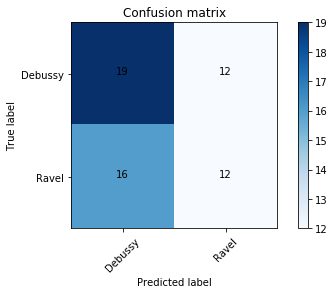

LinearSVC
[[19 12]
 [16 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7333 (0.3352) & 0.6467 (0.3888)
n-gram range (1, 4)
[[19 11]
 [11 15]]


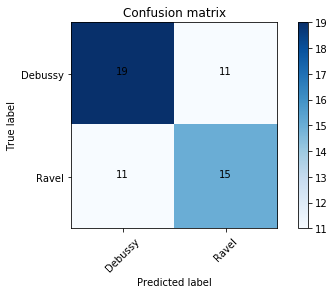

LinearSVC
[[19 11]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)

-----


n-gram range (1, 1)
[[18 15]
 [14 18]]


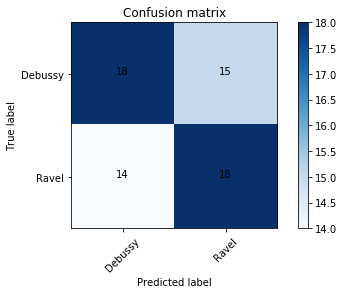

LinearSVC
[[18 15]
 [14 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.8667 (0.2331)
n-gram range (2, 2)
[[20 10]
 [13 13]]


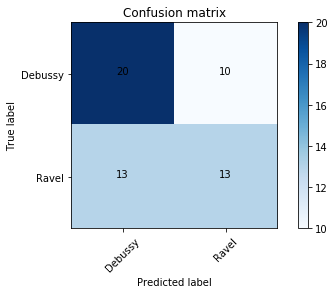

LinearSVC
[[20 10]
 [13 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2194) & 0.8067 (0.3118)
n-gram range (3, 3)
[[19 12]
 [16 12]]


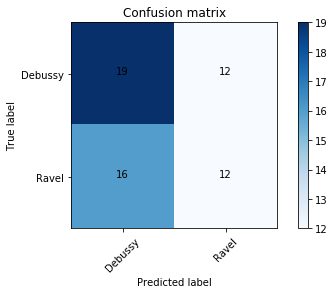

LinearSVC
[[19 12]
 [16 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2629) & 0.6717 (0.3485)
n-gram range (4, 4)
[[19  9]
 [12 10]]


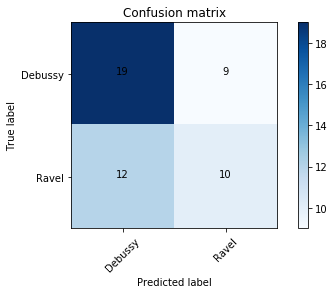

LinearSVC
[[19  9]
 [12 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2194) & 0.6867 (0.3312)
n-gram range (1, 2)
[[21 14]
 [12 12]]


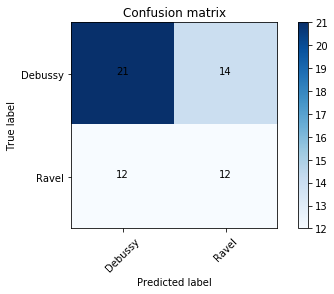

LinearSVC
[[21 14]
 [12 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.1721) & 0.76 (0.3098)
n-gram range (3, 4)
[[19 10]
 [14 10]]


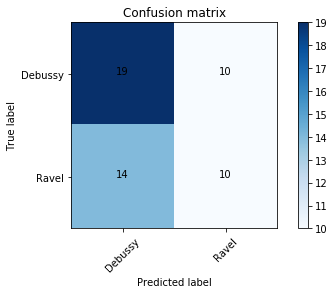

LinearSVC
[[19 10]
 [14 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.3162) & 0.66 (0.3777)
n-gram range (1, 4)
[[19 11]
 [12 14]]


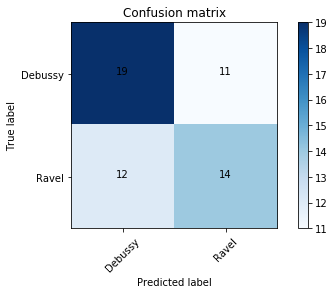

LinearSVC
[[19 11]
 [12 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.2491) & 0.8583 (0.2993)

-----


n-gram range (1, 1)
[[19 14]
 [14 18]]


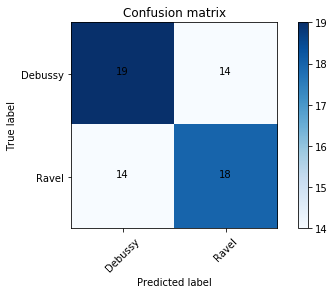

LinearSVC
[[19 14]
 [14 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.9 (0.225)
n-gram range (2, 2)
[[20 14]
 [19 15]]


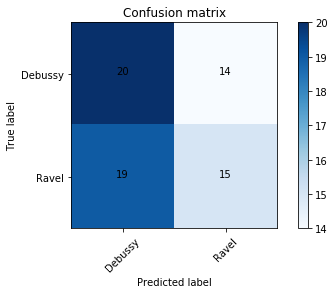

LinearSVC
[[20 14]
 [19 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2833) & 0.79 (0.3406)
n-gram range (3, 3)
[[18 11]
 [14 10]]


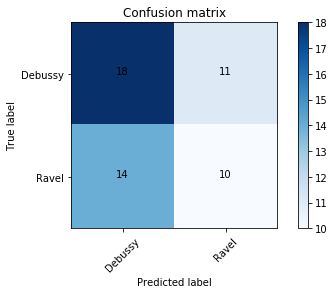

LinearSVC
[[18 11]
 [14 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.286) & 0.6633 (0.3584)
n-gram range (4, 4)
[[19 17]
 [20 18]]


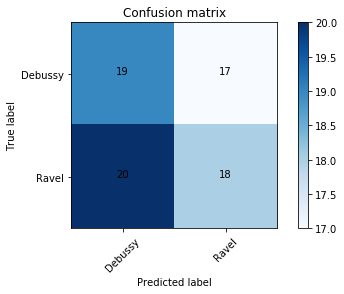

LinearSVC
[[19 17]
 [20 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.3583) & 0.765 (0.3902)
n-gram range (1, 2)
[[19 11]
 [11 15]]


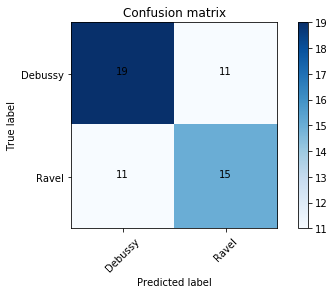

LinearSVC
[[19 11]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.9 (0.225)
n-gram range (3, 4)
[[19 11]
 [15 11]]


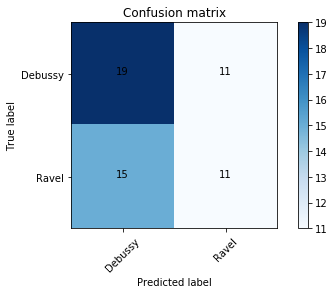

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2108) & 0.6533 (0.3124)
n-gram range (1, 4)
[[21 17]
 [17 19]]


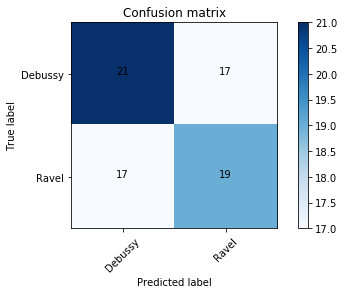

LinearSVC
[[21 17]
 [17 19]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.9067 (0.2066)

-----


n-gram range (1, 1)
[[19 13]
 [13 17]]


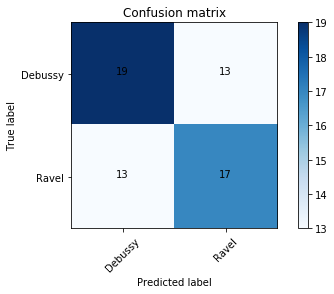

LinearSVC
[[19 13]
 [13 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.9067 (0.2066)
n-gram range (2, 2)
[[20 17]
 [21 19]]


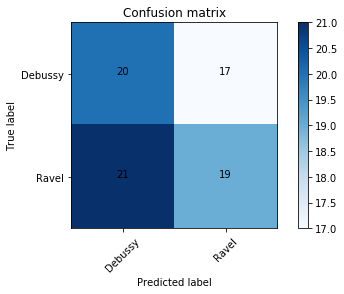

LinearSVC
[[20 17]
 [21 19]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2811) & 0.85 (0.3162)
n-gram range (3, 3)
[[19 12]
 [16 12]]


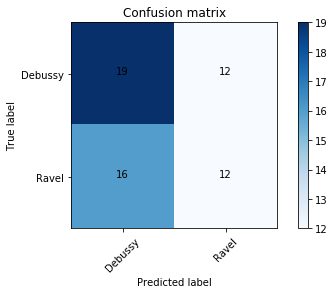

LinearSVC
[[19 12]
 [16 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2629) & 0.6717 (0.3485)
n-gram range (4, 4)
[[19 11]
 [14 12]]


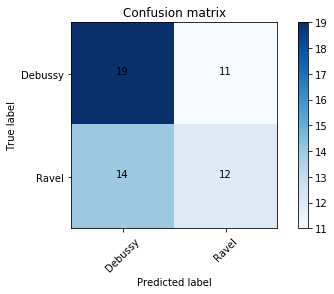

LinearSVC
[[19 11]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2194) & 0.7133 (0.3159)
n-gram range (1, 2)
[[19 11]
 [11 15]]


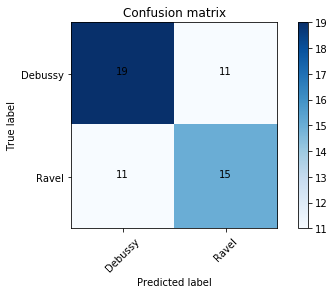

LinearSVC
[[19 11]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.2108) & 0.8667 (0.2811)
n-gram range (3, 4)
[[19 10]
 [14 10]]


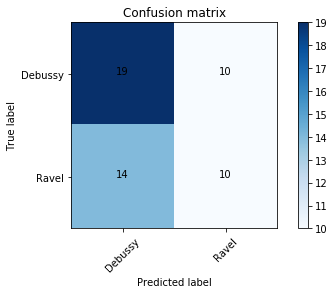

LinearSVC
[[19 10]
 [14 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.6783 (0.3419)
n-gram range (1, 4)
[[18 11]
 [10 14]]


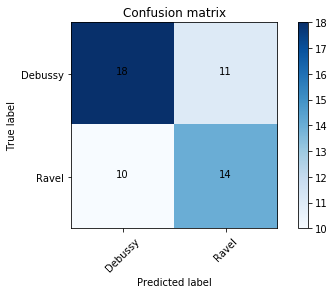

LinearSVC
[[18 11]
 [10 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.8133 (0.3011)

-----


n-gram range (1, 1)
[[17 11]
 [ 8 14]]


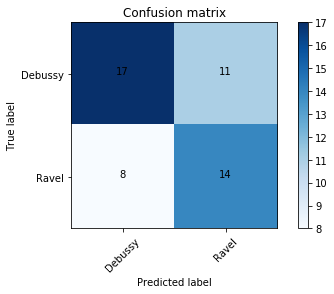

LinearSVC
[[17 11]
 [ 8 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.84 (0.2707)
n-gram range (2, 2)
[[19 13]
 [16 14]]


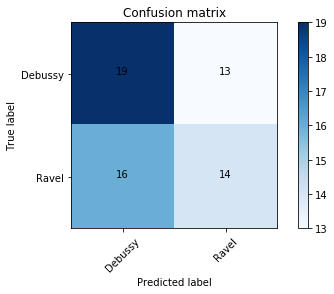

LinearSVC
[[19 13]
 [16 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2509) & 0.6733 (0.3449)
n-gram range (3, 3)
[[20 12]
 [17 13]]


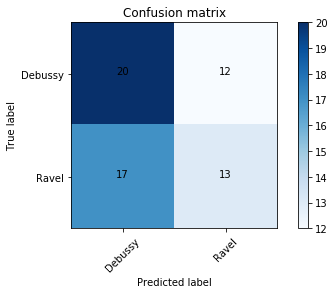

LinearSVC
[[20 12]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.254) & 0.7383 (0.3403)
n-gram range (4, 4)
[[19 13]
 [16 14]]


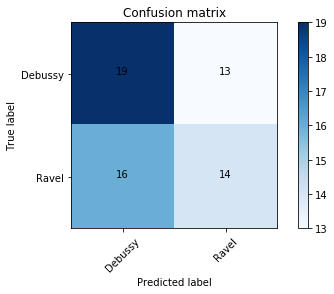

LinearSVC
[[19 13]
 [16 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.322) & 0.7467 (0.3635)
n-gram range (1, 2)
[[20 11]
 [12 16]]


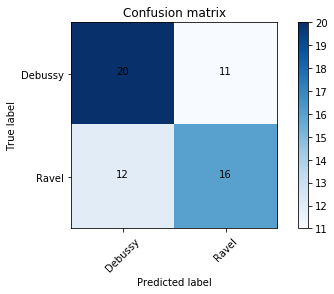

LinearSVC
[[20 11]
 [12 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.94 (0.1897)
n-gram range (3, 4)
[[19  8]
 [12  8]]


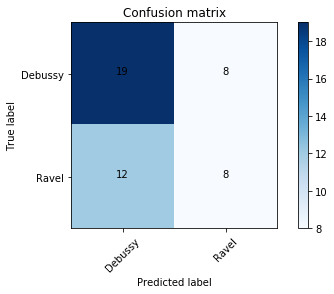

LinearSVC
[[19  8]
 [12  8]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2108) & 0.6267 (0.3223)
n-gram range (1, 4)
[[18 13]
 [12 16]]


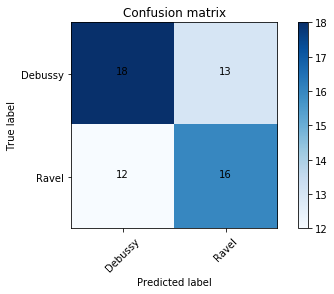

LinearSVC
[[18 13]
 [12 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.84 (0.2707)

-----


n-gram range (1, 1)
[[19 13]
 [13 17]]


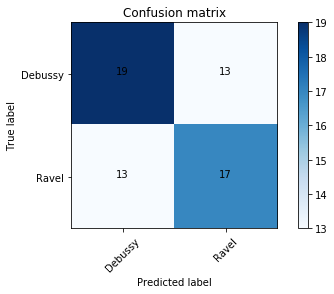

LinearSVC
[[19 13]
 [13 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.3162) & 0.9 (0.3162)
n-gram range (2, 2)
[[20 10]
 [14 12]]


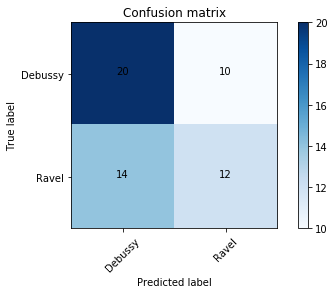

LinearSVC
[[20 10]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2222) & 0.7467 (0.3278)
n-gram range (3, 3)
[[19 13]
 [17 13]]


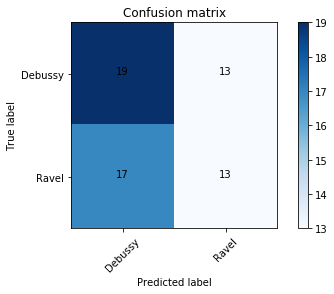

LinearSVC
[[19 13]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2945) & 0.7233 (0.3596)
n-gram range (4, 4)
[[19 12]
 [15 13]]


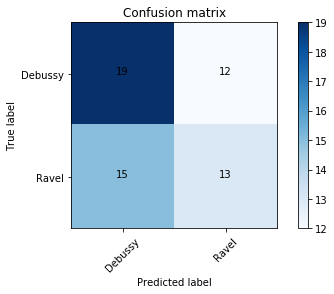

LinearSVC
[[19 12]
 [15 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2194) & 0.7133 (0.3159)
n-gram range (1, 2)
[[20 10]
 [11 15]]


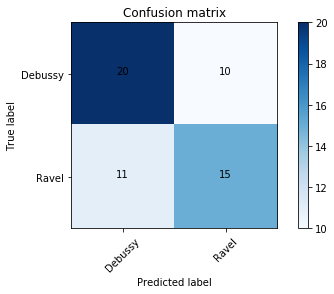

LinearSVC
[[20 10]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.95 (0.1581) & 0.9333 (0.2108)
n-gram range (3, 4)
[[19 12]
 [16 12]]


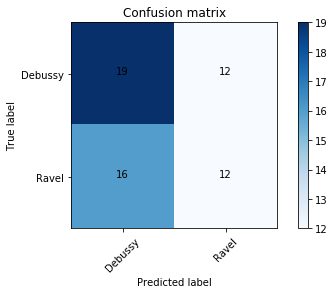

LinearSVC
[[19 12]
 [16 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.3263) & 0.6533 (0.3834)
n-gram range (1, 4)
[[19 12]
 [12 16]]


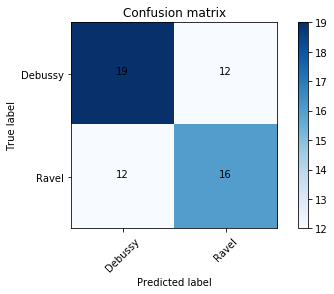

LinearSVC
[[19 12]
 [12 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.9 (0.225)

-----


n-gram range (1, 1)
[[19 11]
 [10 16]]


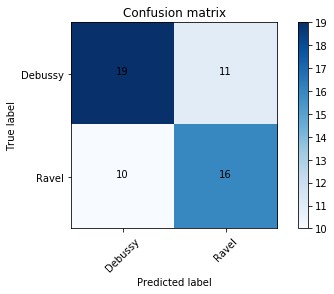

LinearSVC
[[19 11]
 [10 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.95 (0.1581) & 0.9333 (0.2108)
n-gram range (2, 2)
[[20 12]
 [16 14]]


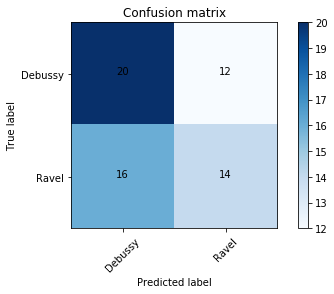

LinearSVC
[[20 12]
 [16 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.1721) & 0.7867 (0.286)
n-gram range (3, 3)
[[18 14]
 [17 13]]


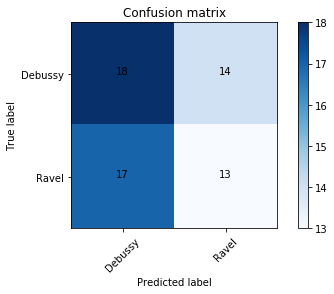

LinearSVC
[[18 14]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7333 (0.3784) & 0.69 (0.4115)
n-gram range (4, 4)
[[19 13]
 [16 14]]


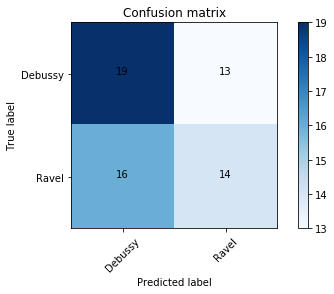

LinearSVC
[[19 13]
 [16 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.1995) & 0.7467 (0.2877)
n-gram range (1, 2)
[[19  9]
 [ 9 13]]


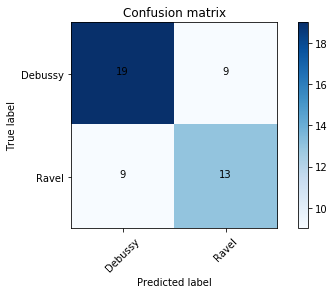

LinearSVC
[[19  9]
 [ 9 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.2108) & 0.8667 (0.2811)
n-gram range (3, 4)
[[19 14]
 [18 14]]


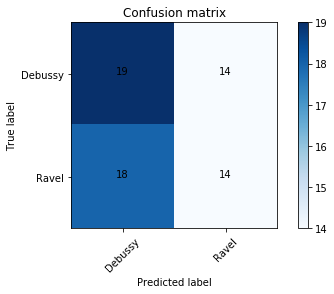

LinearSVC
[[19 14]
 [18 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.3622) & 0.6983 (0.4023)
n-gram range (1, 4)
[[18  9]
 [ 8 12]]


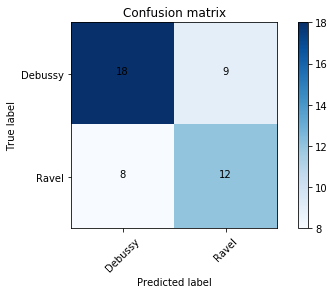

LinearSVC
[[18  9]
 [ 8 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.8133 (0.3011)

-----


n-gram range (1, 1)
[[18  9]
 [ 7 13]]


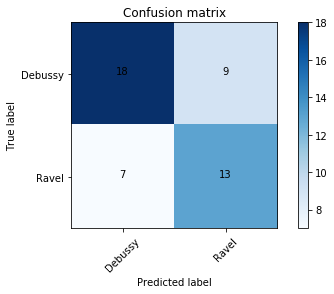

LinearSVC
[[18  9]
 [ 7 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.9067 (0.2066)
n-gram range (2, 2)
[[19 10]
 [13 11]]


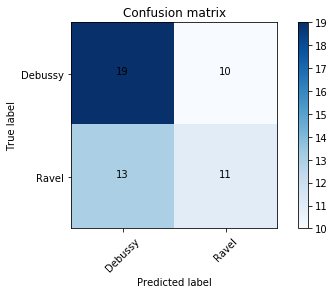

LinearSVC
[[19 10]
 [13 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.1757) & 0.7267 (0.2989)
n-gram range (3, 3)
[[19  7]
 [11  7]]


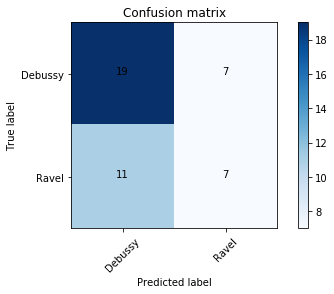

LinearSVC
[[19  7]
 [11  7]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.1721) & 0.64 (0.3098)
n-gram range (4, 4)
[[18 10]
 [12 10]]


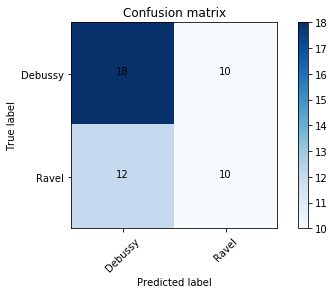

LinearSVC
[[18 10]
 [12 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2629) & 0.6717 (0.3485)
n-gram range (1, 2)
[[17 10]
 [10 10]]


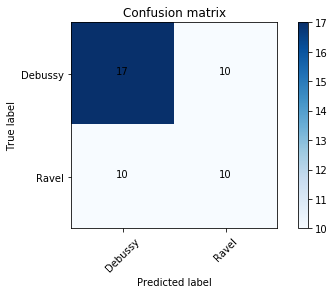

LinearSVC
[[17 10]
 [10 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.3263) & 0.68 (0.3729)
n-gram range (3, 4)
[[19 11]
 [14 12]]


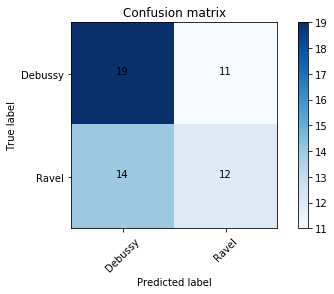

LinearSVC
[[19 11]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.3338) & 0.7133 (0.3862)
n-gram range (1, 4)
[[18 17]
 [17 19]]


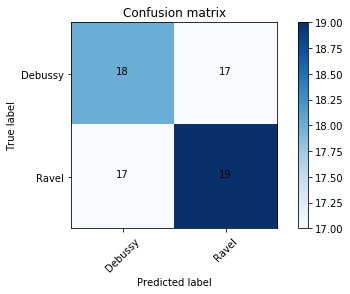

LinearSVC
[[18 17]
 [17 19]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.254) & 0.825 (0.3003)

-----


n-gram range (1, 1)
[[19 13]
 [13 17]]


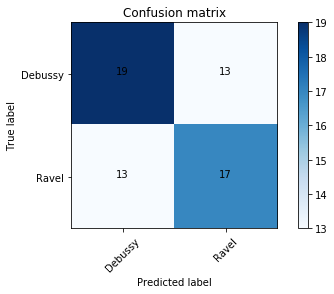

LinearSVC
[[19 13]
 [13 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.9067 (0.2066)
n-gram range (2, 2)
[[20 10]
 [14 12]]


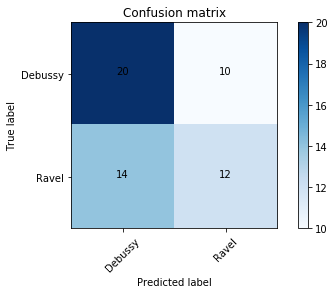

LinearSVC
[[20 10]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.1995) & 0.7533 (0.319)
n-gram range (3, 3)
[[19  7]
 [11  7]]


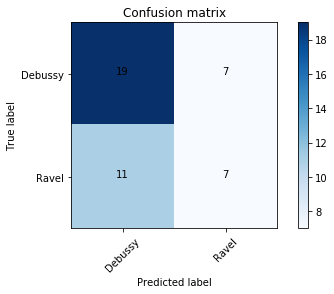

LinearSVC
[[19  7]
 [11  7]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.1933) & 0.6333 (0.3162)
n-gram range (4, 4)
[[17 14]
 [13 15]]


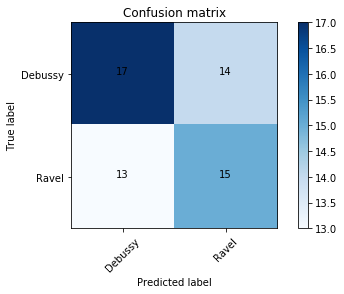

LinearSVC
[[17 14]
 [13 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2357) & 0.7717 (0.3113)
n-gram range (1, 2)
[[20 11]
 [12 16]]


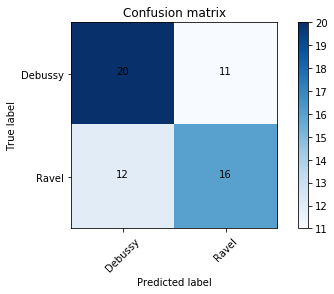

LinearSVC
[[20 11]
 [12 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.94 (0.1897)
n-gram range (3, 4)
[[19  8]
 [12  8]]


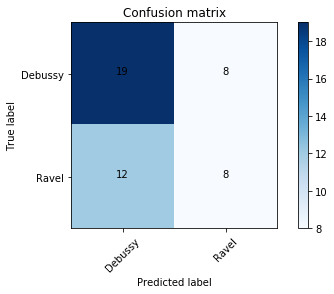

LinearSVC
[[19  8]
 [12  8]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2108) & 0.6267 (0.3223)
n-gram range (1, 4)
[[18 12]
 [11 15]]


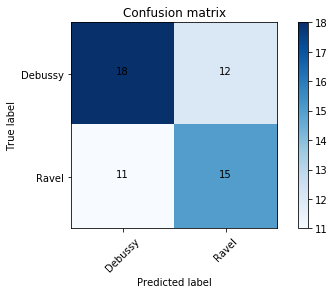

LinearSVC
[[18 12]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.8133 (0.3011)

-----


n-gram range (1, 1)
[[19 12]
 [14 14]]


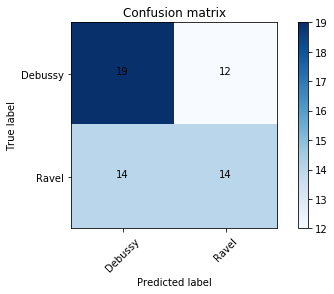

LinearSVC
[[19 12]
 [14 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2811) & 0.85 (0.3162)
n-gram range (2, 2)
[[20 12]
 [16 14]]


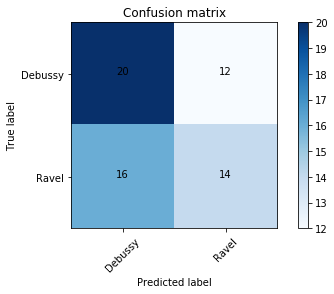

LinearSVC
[[20 12]
 [16 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.1995) & 0.78 (0.2966)
n-gram range (3, 3)
[[19 14]
 [18 14]]


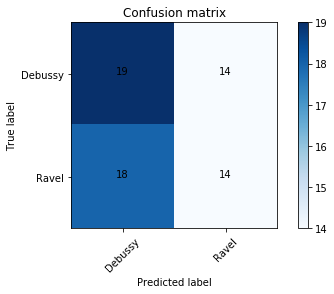

LinearSVC
[[19 14]
 [18 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.3263) & 0.68 (0.3729)
n-gram range (4, 4)
[[19 11]
 [14 12]]


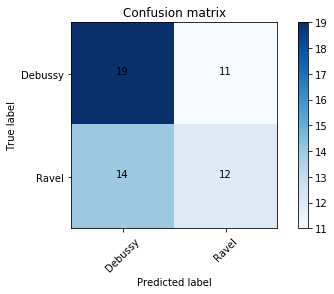

LinearSVC
[[19 11]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2194) & 0.6867 (0.3312)
n-gram range (1, 2)
[[18 12]
 [11 15]]


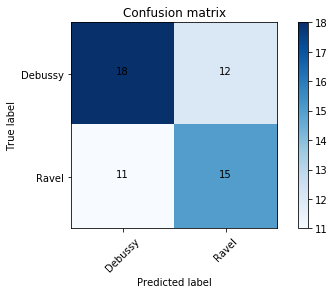

LinearSVC
[[18 12]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.84 (0.2707)
n-gram range (3, 4)
[[19 15]
 [19 15]]


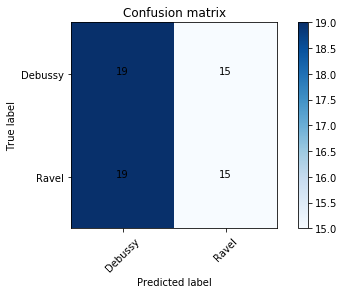

LinearSVC
[[19 15]
 [19 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.275) & 0.6917 (0.3426)
n-gram range (1, 4)
[[18 11]
 [11 13]]


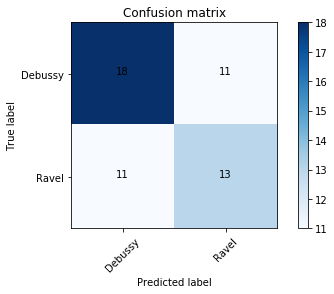

LinearSVC
[[18 11]
 [11 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.254) & 0.7983 (0.3266)

-----


n-gram range (1, 1)
[[19 13]
 [14 16]]


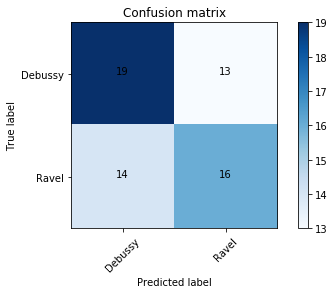

LinearSVC
[[19 13]
 [14 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.322) & 0.84 (0.3502)
n-gram range (2, 2)
[[20 12]
 [15 15]]


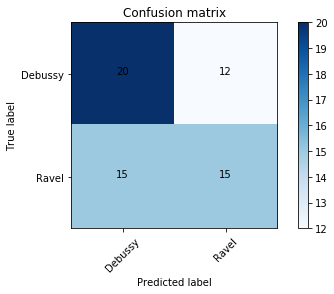

LinearSVC
[[20 12]
 [15 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.161) & 0.8467 (0.2573)
n-gram range (3, 3)
[[19 11]
 [15 11]]


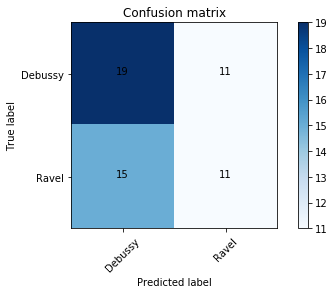

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.6783 (0.3419)
n-gram range (4, 4)
[[17 11]
 [12 10]]


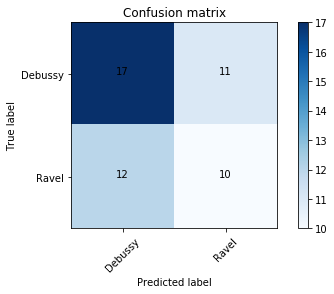

LinearSVC
[[17 11]
 [12 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7333 (0.2509) & 0.6383 (0.3291)
n-gram range (1, 2)
[[22 15]
 [16 18]]


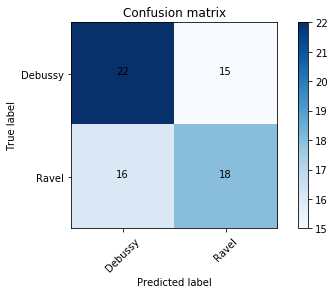

LinearSVC
[[22 15]
 [16 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.95 (0.1581) & 0.9333 (0.2108)
n-gram range (3, 4)
[[19 13]
 [16 14]]


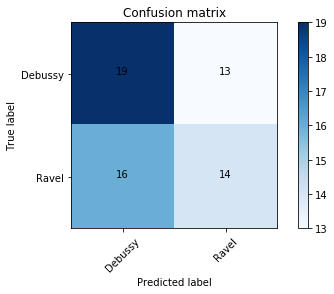

LinearSVC
[[19 13]
 [16 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.254) & 0.765 (0.3207)
n-gram range (1, 4)
[[19 16]
 [18 18]]


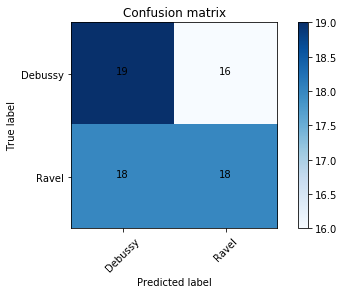

LinearSVC
[[19 16]
 [18 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.322) & 0.8667 (0.322)

-----


n-gram range (1, 1)
[[21 13]
 [12 16]]


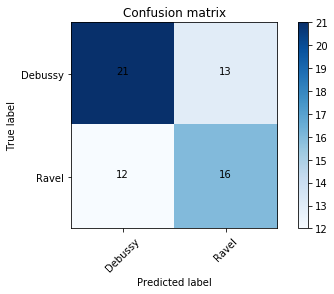

LinearSVC
[[21 13]
 [12 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.94 (0.1897)
n-gram range (2, 2)
[[20 11]
 [15 13]]


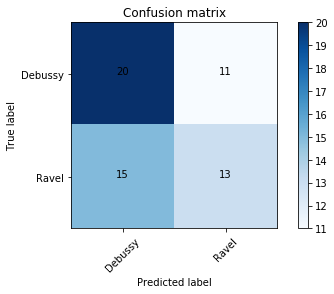

LinearSVC
[[20 11]
 [15 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2222) & 0.7467 (0.3278)
n-gram range (3, 3)
[[19  9]
 [13  9]]


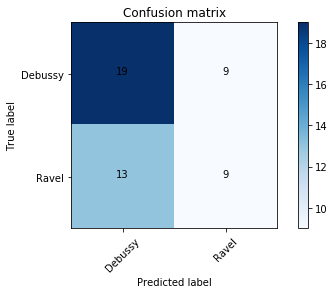

LinearSVC
[[19  9]
 [13  9]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.2257) & 0.62 (0.3282)
n-gram range (4, 4)
[[19 10]
 [12 12]]


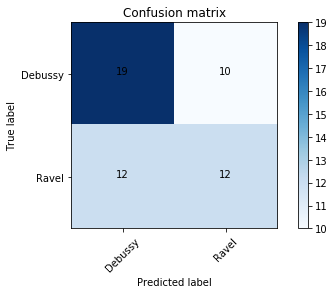

LinearSVC
[[19 10]
 [12 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.1995) & 0.78 (0.2966)
n-gram range (1, 2)
[[21 17]
 [17 19]]


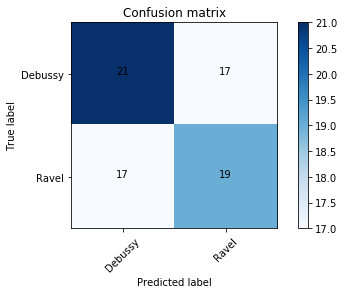

LinearSVC
[[21 17]
 [17 19]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.9 (0.225)
n-gram range (3, 4)
[[19 17]
 [21 17]]


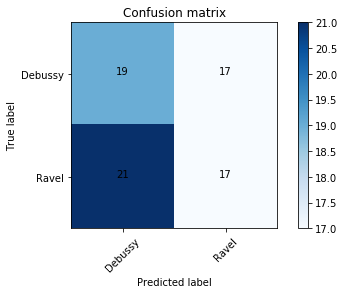

LinearSVC
[[19 17]
 [21 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.3622) & 0.6983 (0.4023)
n-gram range (1, 4)
[[19 14]
 [16 16]]


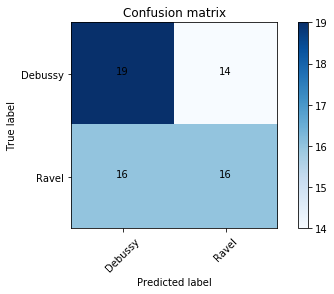

LinearSVC
[[19 14]
 [16 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2811) & 0.85 (0.3162)

-----


n-gram range (1, 1)
[[18 14]
 [14 16]]


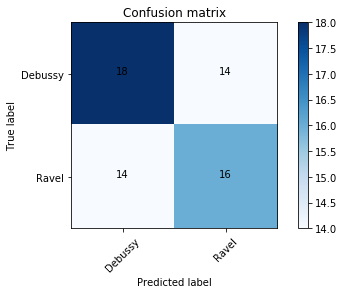

LinearSVC
[[18 14]
 [14 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.254) & 0.825 (0.3003)
n-gram range (2, 2)
[[20 15]
 [19 17]]


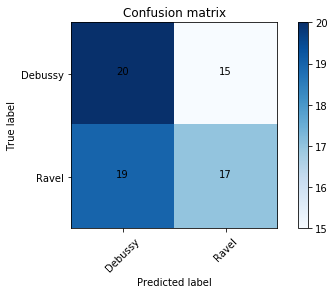

LinearSVC
[[20 15]
 [19 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.254) & 0.7983 (0.3266)
n-gram range (3, 3)
[[19 11]
 [15 11]]


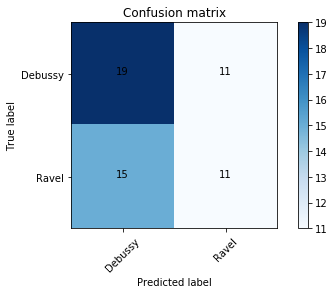

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2108) & 0.6533 (0.3124)
n-gram range (4, 4)
[[19 10]
 [12 12]]


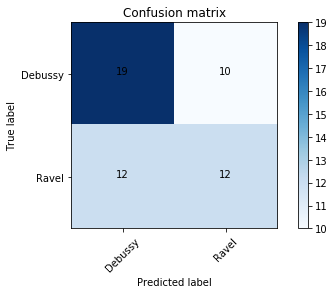

LinearSVC
[[19 10]
 [12 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.1995) & 0.78 (0.2966)
n-gram range (1, 2)
[[21 17]
 [18 18]]


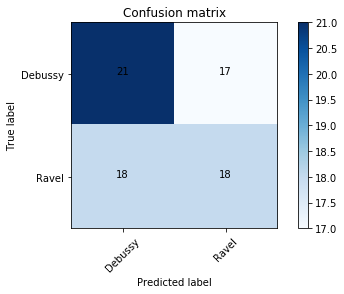

LinearSVC
[[21 17]
 [18 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.2491) & 0.8583 (0.2993)
n-gram range (3, 4)
[[18 12]
 [15 11]]


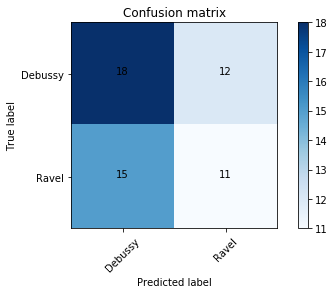

LinearSVC
[[18 12]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7333 (0.2961) & 0.6567 (0.3644)
n-gram range (1, 4)
[[18 11]
 [10 14]]


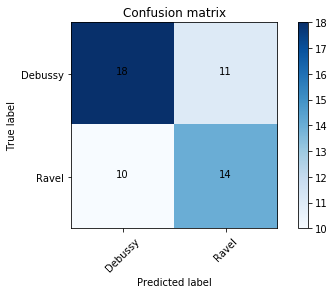

LinearSVC
[[18 11]
 [10 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.2415) & 0.8 (0.322)

-----


n-gram range (1, 1)
[[18 11]
 [ 9 15]]


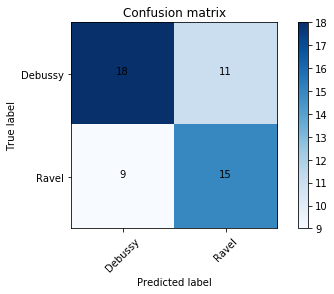

LinearSVC
[[18 11]
 [ 9 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.9 (0.225)
n-gram range (2, 2)
[[20 12]
 [16 14]]


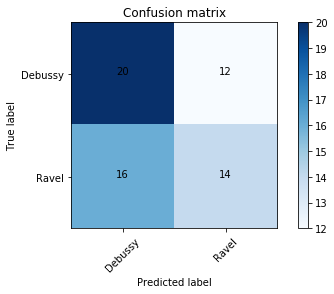

LinearSVC
[[20 12]
 [16 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.1995) & 0.78 (0.2966)
n-gram range (3, 3)
[[20 14]
 [19 15]]


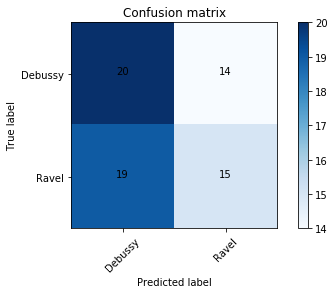

LinearSVC
[[20 14]
 [19 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2357) & 0.7717 (0.3113)
n-gram range (4, 4)
[[19 11]
 [14 12]]


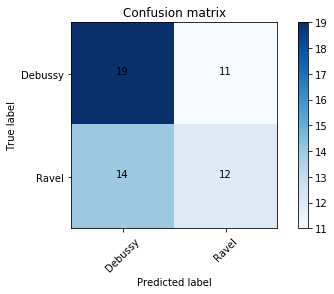

LinearSVC
[[19 11]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.254) & 0.7383 (0.3403)
n-gram range (1, 2)
[[20 12]
 [11 13]]


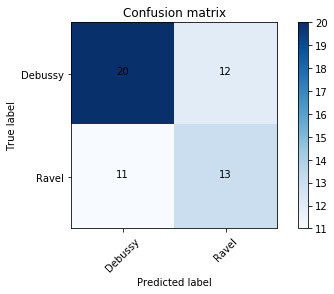

LinearSVC
[[20 12]
 [11 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.8133 (0.3011)
n-gram range (3, 4)
[[19 14]
 [18 14]]


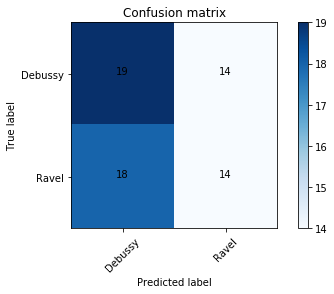

LinearSVC
[[19 14]
 [18 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.3063) & 0.7167 (0.3668)
n-gram range (1, 4)
[[19 10]
 [10 14]]


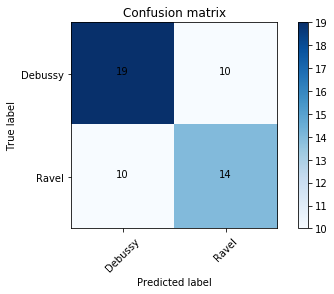

LinearSVC
[[19 10]
 [10 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.9067 (0.2066)

-----


n-gram range (1, 1)
[[18  7]
 [ 5 11]]


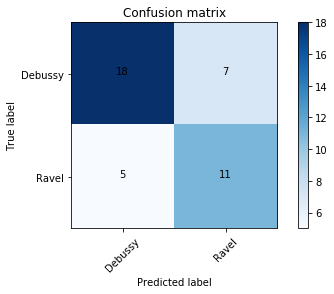

LinearSVC
[[18  7]
 [ 5 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)
n-gram range (2, 2)
[[20 17]
 [21 19]]


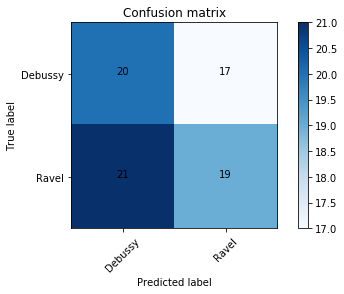

LinearSVC
[[20 17]
 [21 19]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.322) & 0.84 (0.3502)
n-gram range (3, 3)
[[19 11]
 [15 11]]


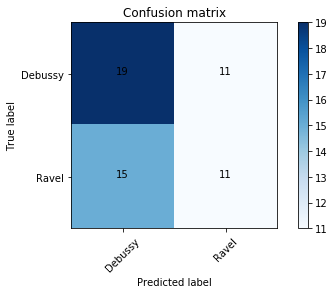

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2629) & 0.6717 (0.3485)
n-gram range (4, 4)
[[18 12]
 [14 12]]


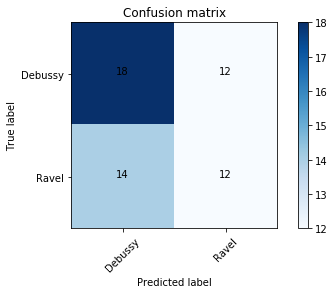

LinearSVC
[[18 12]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.6783 (0.3419)
n-gram range (1, 2)
[[20  9]
 [10 14]]


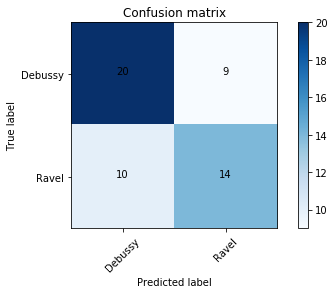

LinearSVC
[[20  9]
 [10 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.94 (0.1897)
n-gram range (3, 4)
[[19 10]
 [14 10]]


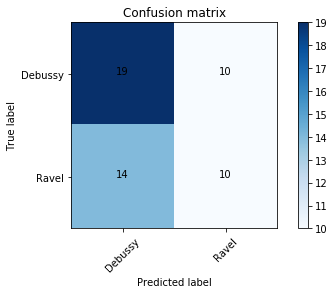

LinearSVC
[[19 10]
 [14 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.2257) & 0.62 (0.3282)
n-gram range (1, 4)
[[18 11]
 [10 14]]


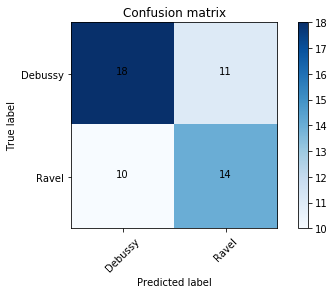

LinearSVC
[[18 11]
 [10 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.225) & 0.865 (0.2868)

-----


n-gram range (1, 1)
[[18 10]
 [ 8 14]]


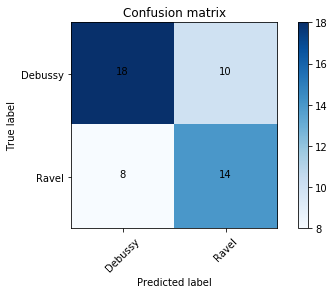

LinearSVC
[[18 10]
 [ 8 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9167 (0.18) & 0.8733 (0.2675)
n-gram range (2, 2)
[[20 10]
 [14 12]]


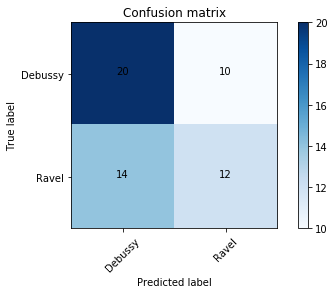

LinearSVC
[[20 10]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2222) & 0.7467 (0.3278)
n-gram range (3, 3)
[[20 13]
 [17 15]]


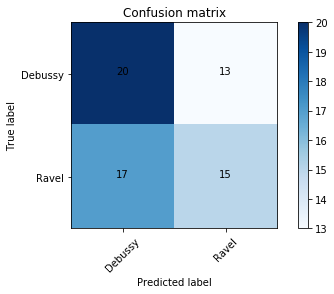

LinearSVC
[[20 13]
 [17 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8167 (0.3375) & 0.7733 (0.3787)
n-gram range (4, 4)
[[19 11]
 [14 12]]


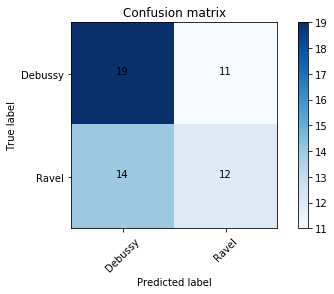

LinearSVC
[[19 11]
 [14 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.322) & 0.72 (0.3795)
n-gram range (1, 2)
[[17  8]
 [ 6 10]]


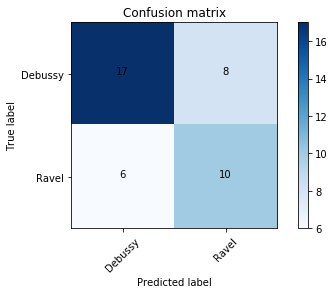

LinearSVC
[[17  8]
 [ 6 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.1995) & 0.78 (0.2966)
n-gram range (3, 4)
[[19  9]
 [13  9]]


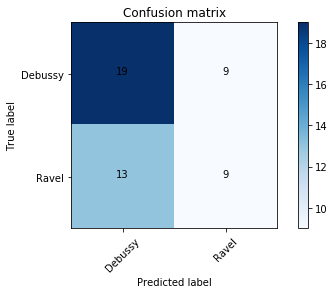

LinearSVC
[[19  9]
 [13  9]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2331) & 0.685 (0.335)
n-gram range (1, 4)
[[18 15]
 [15 17]]


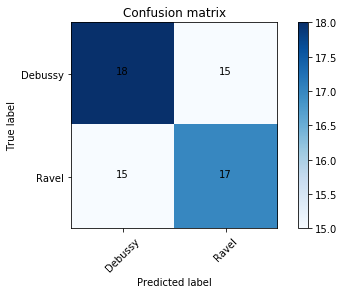

LinearSVC
[[18 15]
 [15 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2722) & 0.7917 (0.3362)

-----


n-gram range (1, 1)
[[17 10]
 [ 7 13]]


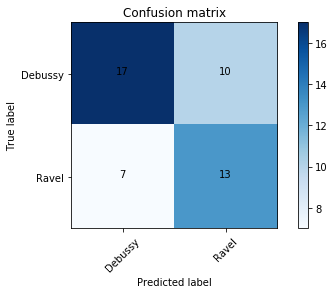

LinearSVC
[[17 10]
 [ 7 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.161) & 0.8733 (0.2165)
n-gram range (2, 2)
[[18 10]
 [12 10]]


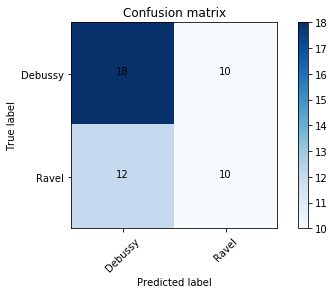

LinearSVC
[[18 10]
 [12 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2108) & 0.6533 (0.3124)
n-gram range (3, 3)
[[20 13]
 [18 14]]


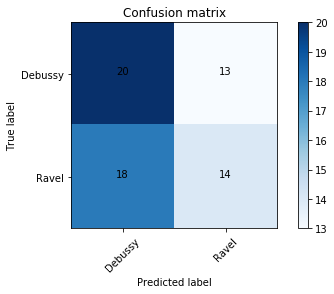

LinearSVC
[[20 13]
 [18 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2699) & 0.7317 (0.3482)
n-gram range (4, 4)
[[19 12]
 [14 14]]


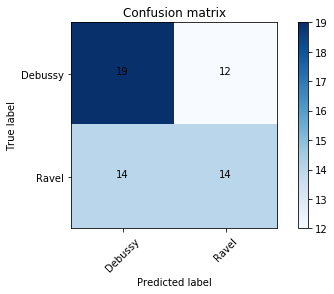

LinearSVC
[[19 12]
 [14 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.1721) & 0.8133 (0.2569)
n-gram range (1, 2)
[[18 10]
 [ 9 13]]


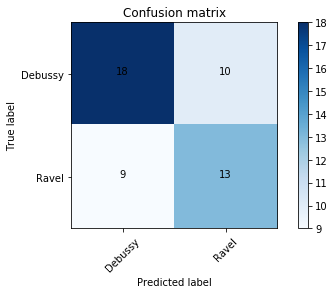

LinearSVC
[[18 10]
 [ 9 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.161) & 0.8467 (0.2573)
n-gram range (3, 4)
[[19 10]
 [14 10]]


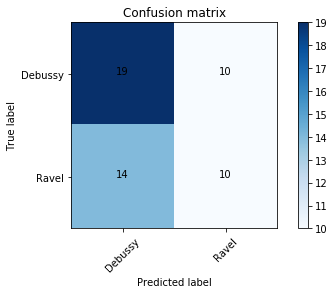

LinearSVC
[[19 10]
 [14 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.6783 (0.3419)
n-gram range (1, 4)
[[18  9]
 [ 8 12]]


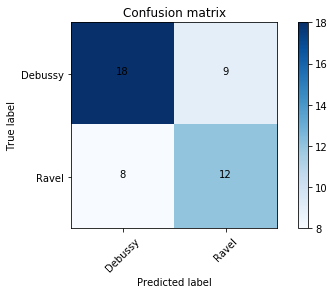

LinearSVC
[[18  9]
 [ 8 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.84 (0.2707)

-----


n-gram range (1, 1)
[[18 12]
 [11 15]]


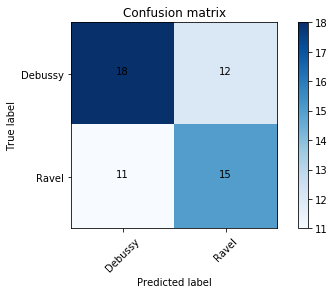

LinearSVC
[[18 12]
 [11 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.84 (0.2707)
n-gram range (2, 2)
[[19 14]
 [17 15]]


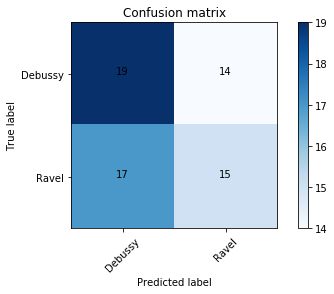

LinearSVC
[[19 14]
 [17 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.3583) & 0.765 (0.3902)
n-gram range (3, 3)
[[19 11]
 [15 11]]


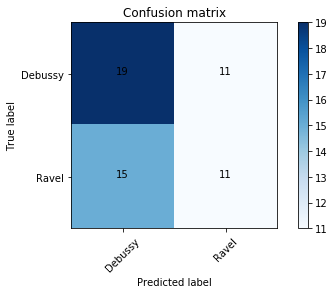

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.6783 (0.3419)
n-gram range (4, 4)
[[19 15]
 [17 17]]


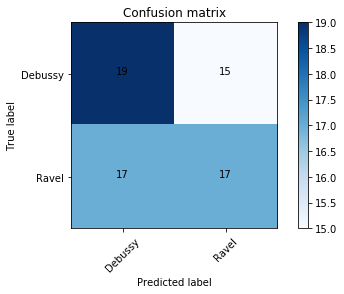

LinearSVC
[[19 15]
 [17 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2222) & 0.8 (0.2811)
n-gram range (1, 2)
[[21 17]
 [17 19]]


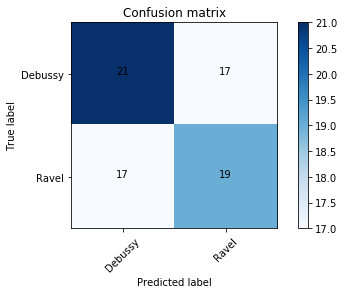

LinearSVC
[[21 17]
 [17 19]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.9067 (0.2066)
n-gram range (3, 4)
[[19 12]
 [16 12]]


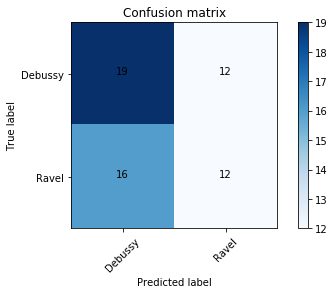

LinearSVC
[[19 12]
 [16 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.275) & 0.665 (0.3549)
n-gram range (1, 4)
[[20 15]
 [15 15]]


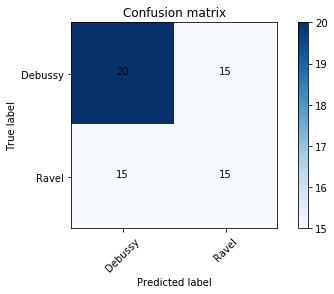

LinearSVC
[[20 15]
 [15 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.1995) & 0.78 (0.2966)

-----


n-gram range (1, 1)
[[20 20]
 [19 21]]


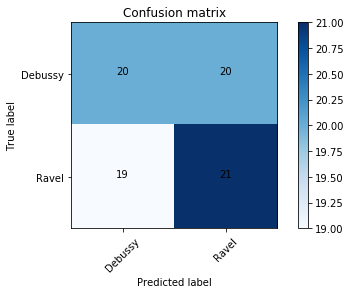

LinearSVC
[[20 20]
 [19 21]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8833 (0.1933) & 0.8667 (0.2331)
n-gram range (2, 2)
[[20 14]
 [18 16]]


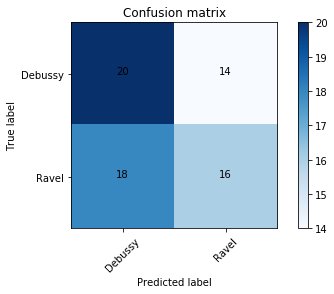

LinearSVC
[[20 14]
 [18 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2331) & 0.805 (0.3166)
n-gram range (3, 3)
[[19  8]
 [12  8]]


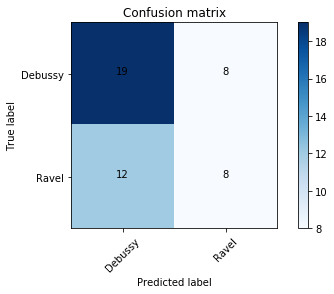

LinearSVC
[[19  8]
 [12  8]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2108) & 0.6267 (0.3223)
n-gram range (4, 4)
[[19 14]
 [18 14]]


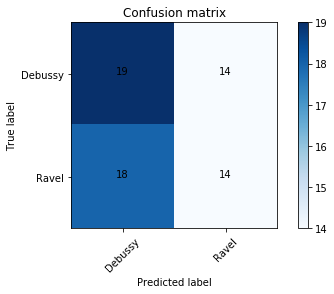

LinearSVC
[[19 14]
 [18 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2629) & 0.6717 (0.3485)
n-gram range (1, 2)
[[17 11]
 [ 9 13]]


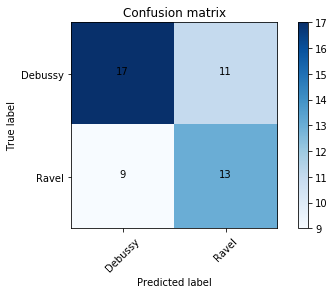

LinearSVC
[[17 11]
 [ 9 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.1995) & 0.78 (0.2966)
n-gram range (3, 4)
[[19  8]
 [12  8]]


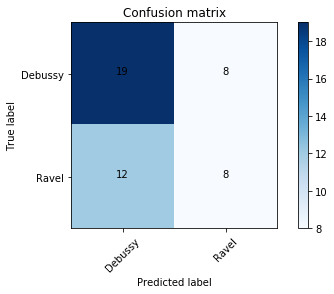

LinearSVC
[[19  8]
 [12  8]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2108) & 0.6267 (0.3223)
n-gram range (1, 4)
[[17 12]
 [10 14]]


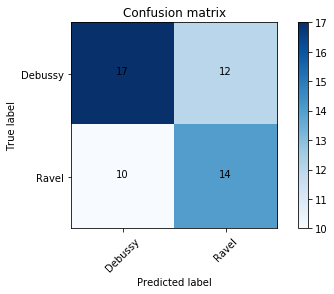

LinearSVC
[[17 12]
 [10 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.1995) & 0.8067 (0.2693)

-----


n-gram range (1, 1)
[[19 11]
 [10 16]]


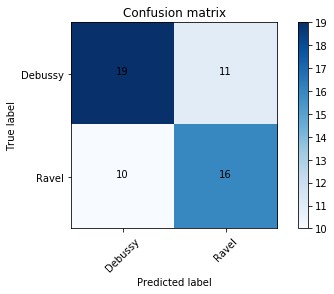

LinearSVC
[[19 11]
 [10 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.95 (0.1581) & 0.9333 (0.2108)
n-gram range (2, 2)
[[20 15]
 [19 17]]


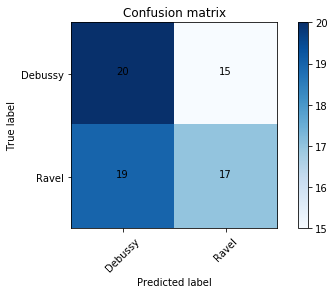

LinearSVC
[[20 15]
 [19 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.36) & 0.825 (0.3736)
n-gram range (3, 3)
[[19 13]
 [17 13]]


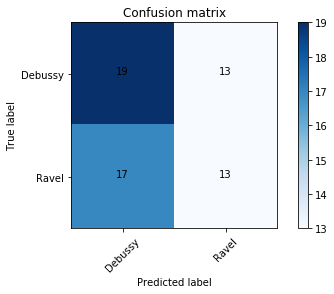

LinearSVC
[[19 13]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2945) & 0.7233 (0.3596)
n-gram range (4, 4)
[[19  9]
 [12 10]]


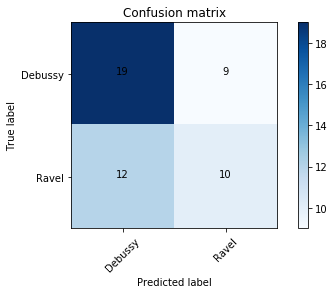

LinearSVC
[[19  9]
 [12 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2194) & 0.6867 (0.3312)
n-gram range (1, 2)
[[19 10]
 [10 14]]


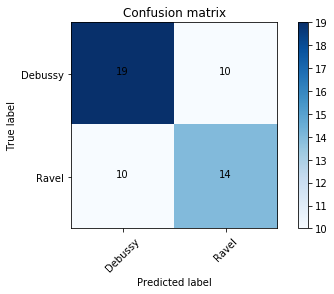

LinearSVC
[[19 10]
 [10 14]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.2108) & 0.8667 (0.2811)
n-gram range (3, 4)
[[19 12]
 [16 12]]


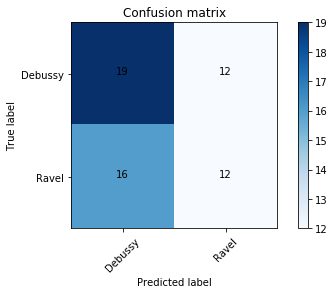

LinearSVC
[[19 12]
 [16 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8 (0.2331) & 0.7117 (0.3201)
n-gram range (1, 4)
[[21 16]
 [16 18]]


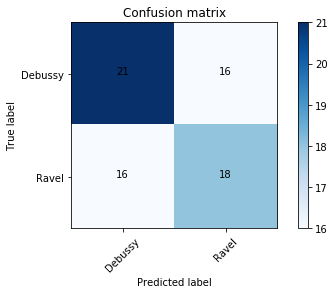

LinearSVC
[[21 16]
 [16 18]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.88 (0.253)

-----


n-gram range (1, 1)
[[19 10]
 [ 9 15]]


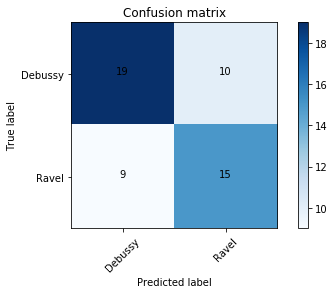

LinearSVC
[[19 10]
 [ 9 15]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.9667 (0.1054)
n-gram range (2, 2)
[[18 10]
 [12 10]]


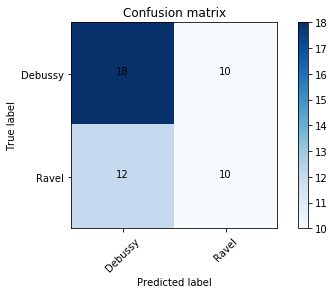

LinearSVC
[[18 10]
 [12 10]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2629) & 0.6717 (0.3485)
n-gram range (3, 3)
[[19 12]
 [16 12]]


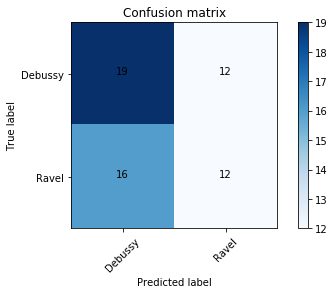

LinearSVC
[[19 12]
 [16 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7333 (0.3352) & 0.6467 (0.3888)
n-gram range (4, 4)
[[19 11]
 [13 13]]


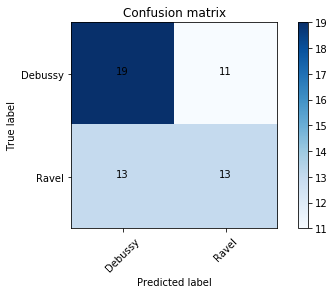

LinearSVC
[[19 11]
 [13 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.85 (0.1995) & 0.78 (0.2966)
n-gram range (1, 2)
[[19  9]
 [ 9 13]]


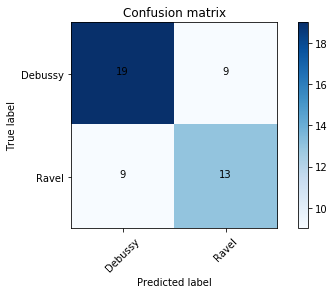

LinearSVC
[[19  9]
 [ 9 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.88 (0.253)
n-gram range (3, 4)
[[19 11]
 [15 11]]


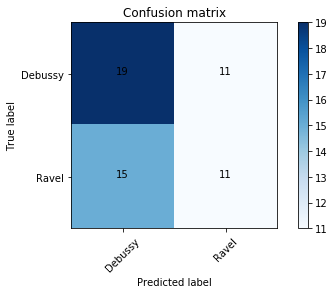

LinearSVC
[[19 11]
 [15 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7667 (0.2108) & 0.6533 (0.3124)
n-gram range (1, 4)
[[19 13]
 [13 17]]


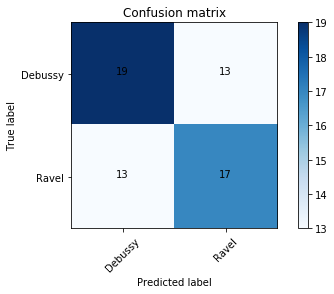

LinearSVC
[[19 13]
 [13 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9333 (0.1405) & 0.88 (0.253)

-----


n-gram range (1, 1)
[[19 11]
 [10 16]]


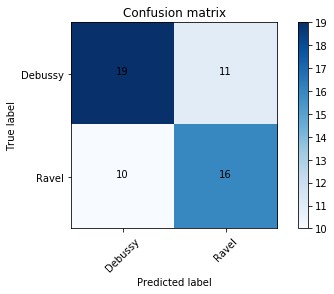

LinearSVC
[[19 11]
 [10 16]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9667 (0.1054) & 0.94 (0.1897)
n-gram range (2, 2)
[[20 11]
 [15 13]]


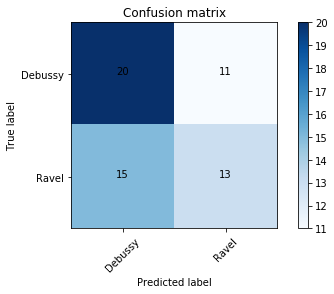

LinearSVC
[[20 11]
 [15 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8333 (0.2222) & 0.7467 (0.3278)
n-gram range (3, 3)
[[19 13]
 [17 13]]


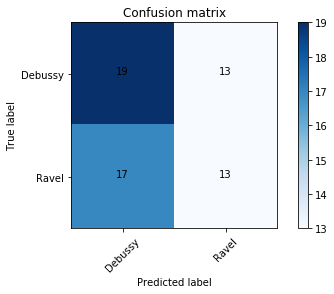

LinearSVC
[[19 13]
 [17 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2491) & 0.705 (0.3279)
n-gram range (4, 4)
[[19 12]
 [15 13]]


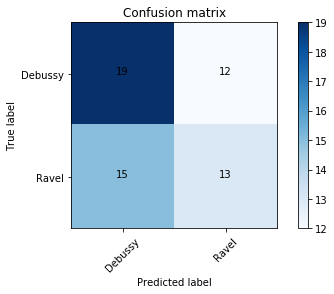

LinearSVC
[[19 12]
 [15 13]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.7833 (0.2364) & 0.7067 (0.3239)
n-gram range (1, 2)
[[18  8]
 [ 7 11]]


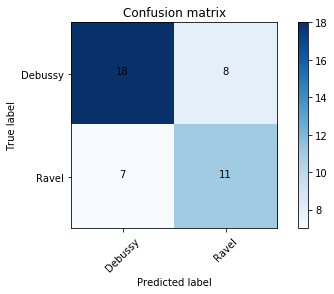

LinearSVC
[[18  8]
 [ 7 11]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.8667 (0.2194) & 0.8067 (0.3118)
n-gram range (3, 4)
[[19 12]
 [16 12]]


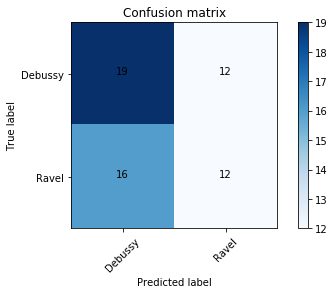

LinearSVC
[[19 12]
 [16 12]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.75 (0.2257) & 0.6467 (0.319)
n-gram range (1, 4)
[[19 14]
 [15 17]]


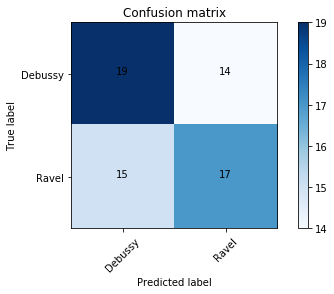

LinearSVC
[[19 14]
 [15 17]]
micro-averaged f-score (std) & macro-averaged f-score (std)
0.9 (0.225) & 0.8917 (0.2486)

-----



[('ravel_xml3.xml', 620),
 ('debussy_xml5.xml', 486),
 ('ravel_xml4.xml', 430),
 ('ravel_xml2.xml', 408),
 ('ravel_xml0.xml', 370),
 ('ravel_xml5.xml', 225),
 ('debussy_xml0.xml', 196),
 ('debussy_xml18.xml', 41),
 ('debussy_xml12.xml', 23),
 ('debussy_xml14.xml', 14),
 ('debussy_xml1.xml', 10),
 ('debussy_xml10.xml', 10),
 ('debussy_xml4.xml', 7)]

In [76]:
NGRAMRANGES = [(1,1),(2,2),(3,3),(4,4),(1,2),(3,4),(1,4)]
COMPOSERS = [DEBUSSY, RAVEL]
CLASSIFIERS = [svm.LinearSVC(penalty='l2', C=5, loss='hinge')] # 
appendix = []
for i in tqdm(range(100)):
    appendix += benchmark_classifiers(COMPOSERS,NGRAMRANGES,CLASSIFIERS,VECTORIZER)
Counter(appendix).most_common()

In [77]:
flatten = lambda l: [item for sublist in l for item in sublist]
with open('debussy-durations.txt', 'r') as f:
    debussy_ = [line.strip() for line in f.readlines()]
with open('ravel-durations.txt', 'r') as f:
    ravel_ = [line.strip() for line in f.readlines()]

    
debussy_TYPELENGTH = [piece.split(';') for piece in debussy_]
ravel_TYPELENGTH = [piece.split(';') for piece in ravel_]


typelengths = list(set(flatten(debussy_TYPELENGTH+ravel_TYPELENGTH)))
typelength_dict = {typelengths[i]: str(i+300) for i in range(len(typelengths))}
debussy_T = [(' '.join([typelength_dict[dur] for dur in piece]),'temp') for piece in debussy_TYPELENGTH]
ravel_T = [(' '.join([typelength_dict[dur] for dur in piece]),'temp') for piece in ravel_TYPELENGTH]


In [78]:
def crossvalidate_twofeaturesets(X_tuple1, X_tuple2, y, classifiers, vectorizer, range1, range2, K=10):    
    for clf in tqdm(classifiers):
        clf.cm_sum = np.zeros([len(set(y)),len(set(y))], dtype='int16')
        clf.accuracies, clf.fones, clf.misclassified, clf.runningtime = [], [], [], []
        clf.fones_micro, clf.fones_macro = [], []
        clf.name = str(clf).split('(')[0]

    X1 = np.array([piece[0] for piece in X_tuple1])
    X2 = np.array([piece[0] for piece in X_tuple2])
    filenames = np.array([piece[1] for piece in X_tuple2])
    kf = KFold(n_splits=K, shuffle=True)
    for train_index, test_index in kf.split(y):
        y_train, y_test = y[train_index], y[test_index]
        X_train_new, X_test_new = X1[train_index], X1[test_index]
        vct1 = vectorizer.set_params(ngram_range=range1)
        X_train, X_test = X2[train_index], X2[test_index] 
        vct2 = vectorizer.set_params(ngram_range=range2)
   
        X_train_new_tfidf = vct1.fit_transform(X_train_new) # use two separate vectorizers for each feature set
        X_test_new_tfidf = sp.vstack([vct1.transform(np.array([piece])) for piece in X_test_new])
        X_train_tfidf = vct2.fit_transform(X_train)
        X_test_tfidf = sp.vstack([vct2.transform(np.array([piece])) for piece in X_test])
        
        X_train_tfidf = sp.hstack((X_train_tfidf, X_train_new_tfidf)) # Merge the two feature sets
        X_test_tfidf = sp.hstack((X_test_tfidf, X_test_new_tfidf))
        
        for clf in classifiers:
            t = datetime.now()
            clf.fit(X_train_tfidf, y_train)
            y_pred = clf.predict(X_test_tfidf)
            clf.runningtime.append((datetime.now()-t).total_seconds())
            clf.cm_sum += confusion_matrix(y_test, y_pred)
            clf.misclassified.append(test_index[np.where(y_test != y_pred)]) # http://stackoverflow.com/a/25570632
            clf.accuracies.append(accuracy_score(y_test, y_pred))
            clf.fones.append(f1_score(y_test, y_pred, average='weighted'))
            clf.fones_micro.append(f1_score(y_test, y_pred, average='micro'))
            clf.fones_macro.append(f1_score(y_test, y_pred, average='macro'))

    result = dict()
    for clf in tqdm(classifiers):
        clf.misclassified = np.sort(np.hstack(clf.misclassified))
        result[clf.name] = [clf.cm_sum, clf.accuracies, clf.fones, clf.misclassified, filenames[clf.misclassified], clf.runningtime, clf.fones_micro, clf.fones_macro]
    return result

In [79]:
def benchmark_classifiers_twofeaturesets(composers1, composers2, range1, range2, classifiers, vectorizer, n=1, retrieve_title=True):
    misclassified_list = []
    print('duration n-gram range:', range1, 'chord n-gram range:', range2)
    X1, y = build_Xy(composers1, size=n)
    X2, y = build_Xy(composers2, size=n)
    cv_result = crossvalidate_twofeaturesets(X1, X2, y, classifiers, vectorizer, range1, range2)
    for clf, results in cv_result.items():
        print(clf)
        cm = results[0]
        print(cm)
        acc = results[1]
        fones = results[2]
        misclassified = results[3]
        misclassified_filenames = results[4]
        misclassified_list += list(misclassified_filenames)
        print('misclassified',[(misclassified[i], misclassified_filenames[i]) for i in range(len(misclassified))])
        runningtime = results[5]
        print('running time', np.sum(runningtime))
        fones_micro = results[6]
        fones_macro = results[7]
        print('F-measures')
        print(round(np.mean(fones_micro),4), '({})'.format(round(np.std(fones_micro, ddof=1),4)), '&', round(np.mean(fones_macro),4), '({})'.format(round(np.std(fones_macro, ddof=1),4)))
    print('-----')
    return misclassified_list

In [80]:
CLASSIFIERS = [svm.LinearSVC(penalty='l2', C=5, loss='hinge'),
               linear_model.LogisticRegression(penalty='l2', C=100, tol=1, multi_class='multinomial', solver='sag'),
               neighbors.KNeighborsClassifier(weights='distance'),
               naive_bayes.MultinomialNB(alpha=0.00001, fit_prior=False),
               neural_network.MLPClassifier(solver='lbfgs',hidden_layer_sizes=(10,))]
VECTORIZER = TfidfVectorizer(sublinear_tf=True, lowercase=False, token_pattern=u"(?u)\\b\\w+\\b")

COMPOSERS1 = [debussy_T,ravel_T]
COMPOSERS2 = [DEBUSSY, RAVEL]

In [81]:
benchmark_classifiers_twofeaturesets(COMPOSERS1, COMPOSERS2, (1,1), (1,2), CLASSIFIERS, VECTORIZER)

duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 13]
 [15 17]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.049859
F-measures
0.9167 (0.18) & 0.9 (0.225)
LogisticRegression
[[19 11]
 [15 11]]
misclassified [(11, 'debussy_xml19.xml'), (20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml'), (22, 'ravel_xml2.xml'), (24, 'ravel_xml4.xml'), (25, 'ravel_xml5.xml')]
running time 0.055922
F-measures
0.7667 (0.2108) & 0.6533 (0.3124)
KNeighborsClassifier
[[20 13]
 [17 15]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml'), (24, 'ravel_xml4.xml'), (25, 'ravel_xml5.xml')]
running time 0.071752
F-measures
0.8333 (0.2222) & 0.7733 (0.3066)
MultinomialNB
[[20 13]
 [15 17]]
misclassified [(21, 'ravel_xml1.xml'), (23, 'ravel_xml3.xml')]
running time 0.054617
F-measures
0.9333 (0.2108) & 0.925 (0.2372)
MLPClassifier
[[20 13]
 [16 16]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml'), (23, 'ravel_xml3.xml')]
running time 2.6265240000000003
F-measures
0.8833 (0.2491) & 0.8583 (0.2993)
--

['ravel_xml0.xml',
 'ravel_xml1.xml',
 'debussy_xml19.xml',
 'ravel_xml0.xml',
 'ravel_xml1.xml',
 'ravel_xml2.xml',
 'ravel_xml4.xml',
 'ravel_xml5.xml',
 'ravel_xml0.xml',
 'ravel_xml1.xml',
 'ravel_xml4.xml',
 'ravel_xml5.xml',
 'ravel_xml1.xml',
 'ravel_xml3.xml',
 'ravel_xml0.xml',
 'ravel_xml1.xml',
 'ravel_xml3.xml']

In [82]:
# Identify the often-misclassified files, using both feature sets
# do the experiment 100 times with the best classifier, SVM
# then find pieces that are misclassified more than 50% of the time
COMPOSERS1 = [debussy_T,ravel_T]
COMPOSERS2 = [DEBUSSY, RAVEL]
CLASSIFIERS = [svm.LinearSVC(penalty='l2', C=5, loss='hinge')] # 
appendix = []
for i in tqdm(range(100)):
    appendix += benchmark_classifiers_twofeaturesets(COMPOSERS1, COMPOSERS2, (1,1), (1,2), CLASSIFIERS, VECTORIZER)
Counter(appendix).most_common()

duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 13]
 [15 17]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.052448
F-measures
0.9333 (0.1405) & 0.9067 (0.2066)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 14]
 [16 18]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.044289999999999996
F-measures
0.9 (0.3162) & 0.9 (0.3162)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 11]
 [13 15]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.070126
F-measures
0.9333 (0.1405) & 0.9067 (0.2066)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 13]
 [15 17]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.04891
F-measures
0.9333 (0.1405) & 0.9067 (0.2066)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 12]
 [14 16]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.044133000000000006
F-measures
0.9333 (0.1405) & 0.88 (0.253)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 10]
 [12 14]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.043681000000000005
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 15]
 [19 17]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml'), (24, 'ravel_xml4.xml'), (25, 'ravel_xml5.xml')]
running time 0.040868
F-measures
0.85 (0.254) & 0.825 (0.3003)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 14]
 [16 18]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.04790400000000001
F-measures
0.9333 (0.1405) & 0.9067 (0.2066)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 13]
 [15 17]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.042948
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[22 17]
 [19 19]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.043533999999999996
F-measures
0.9333 (0.1405) & 0.9067 (0.2066)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 13]
 [15 17]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.036128
F-measures
0.9333 (0.1405) & 0.9067 (0.2066)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 14]
 [16 18]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.035419000000000006
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 12]
 [14 16]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.040531
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 14]
 [16 18]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.051946
F-measures
0.9167 (0.18) & 0.9 (0.225)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[22 15]
 [17 17]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.039833
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 12]
 [14 16]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.039068000000000006
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 11]
 [13 15]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.039014999999999994
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 12]
 [14 16]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.039612
F-measures
0.9167 (0.18) & 0.9 (0.225)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 10]
 [12 14]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.03919
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 15]
 [17 19]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.040977000000000006
F-measures
0.9333 (0.1405) & 0.88 (0.253)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 17]
 [19 21]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.039764999999999995
F-measures
0.9333 (0.2108) & 0.925 (0.2372)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 12]
 [16 14]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml'), (24, 'ravel_xml4.xml'), (25, 'ravel_xml5.xml')]
running time 0.03933600000000001
F-measures
0.8667 (0.2331) & 0.805 (0.3166)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 13]
 [15 17]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.038741
F-measures
0.9333 (0.1405) & 0.88 (0.253)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 13]
 [17 15]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml'), (24, 'ravel_xml4.xml'), (25, 'ravel_xml5.xml')]
running time 0.039973999999999996
F-measures
0.85 (0.254) & 0.7983 (0.3266)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 16]
 [18 20]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.040385000000000004
F-measures
0.9167 (0.18) & 0.9 (0.225)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 12]
 [14 16]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.038776
F-measures
0.9333 (0.1405) & 0.9067 (0.2066)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20  9]
 [11 13]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.039763999999999994
F-measures
0.9333 (0.1405) & 0.88 (0.253)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 10]
 [12 14]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.033687999999999996
F-measures
0.9333 (0.1405) & 0.88 (0.253)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 11]
 [13 15]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.033929
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[22 18]
 [20 20]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.036948
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 12]
 [14 16]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.05260000000000001
F-measures
0.9333 (0.2108) & 0.925 (0.2372)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 10]
 [12 14]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.043825
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 13]
 [15 17]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.04838
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 14]
 [16 18]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.046349999999999995
F-measures
0.9333 (0.1405) & 0.9067 (0.2066)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 11]
 [13 15]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.045323
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 12]
 [15 15]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml'), (22, 'ravel_xml2.xml')]
running time 0.042342
F-measures
0.8833 (0.2491) & 0.8583 (0.2993)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 11]
 [13 15]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.043160000000000004
F-measures
0.9333 (0.1405) & 0.88 (0.253)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 14]
 [17 17]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml'), (23, 'ravel_xml3.xml')]
running time 0.04699
F-measures
0.9 (0.225) & 0.865 (0.2868)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 12]
 [15 15]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml'), (22, 'ravel_xml2.xml')]
running time 0.04229
F-measures
0.9 (0.225) & 0.865 (0.2868)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 10]
 [12 14]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.055501999999999996
F-measures
0.9333 (0.1405) & 0.88 (0.253)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 12]
 [14 16]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.053937
F-measures
0.9333 (0.1405) & 0.88 (0.253)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 11]
 [13 15]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.047949
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 10]
 [12 14]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.056004
F-measures
0.9333 (0.1405) & 0.88 (0.253)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[22 16]
 [18 18]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.047073
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 14]
 [16 18]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.042618
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 10]
 [12 14]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.045798
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 12]
 [14 16]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.047568
F-measures
0.9333 (0.1405) & 0.9067 (0.2066)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[22 18]
 [20 20]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.039138
F-measures
0.9333 (0.1405) & 0.9067 (0.2066)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 14]
 [16 18]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.035675
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[22 20]
 [24 20]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml'), (24, 'ravel_xml4.xml'), (25, 'ravel_xml5.xml')]
running time 0.047267
F-measures
0.8667 (0.322) & 0.84 (0.3502)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 12]
 [16 14]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml'), (24, 'ravel_xml4.xml'), (25, 'ravel_xml5.xml')]
running time 0.045228
F-measures
0.85 (0.254) & 0.7983 (0.3266)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 13]
 [15 17]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.038728
F-measures
0.9167 (0.18) & 0.9 (0.225)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 11]
 [13 15]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.03920699999999999
F-measures
0.9333 (0.1405) & 0.88 (0.253)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 15]
 [20 16]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml'), (23, 'ravel_xml3.xml'), (24, 'ravel_xml4.xml'), (25, 'ravel_xml5.xml')]
running time 0.039698000000000004
F-measures
0.8333 (0.3239) & 0.78 (0.3706)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 12]
 [14 16]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.039539000000000005
F-measures
0.9333 (0.1405) & 0.9067 (0.2066)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 15]
 [19 17]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml'), (24, 'ravel_xml4.xml'), (25, 'ravel_xml5.xml')]
running time 0.03898100000000001
F-measures
0.85 (0.254) & 0.7983 (0.3266)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 13]
 [17 15]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml'), (24, 'ravel_xml4.xml'), (25, 'ravel_xml5.xml')]
running time 0.039119
F-measures
0.85 (0.254) & 0.7983 (0.3266)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 15]
 [17 19]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.041304
F-measures
0.9167 (0.18) & 0.9 (0.225)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 13]
 [15 17]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.039005
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 12]
 [14 16]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.049393000000000006
F-measures
0.9167 (0.18) & 0.9 (0.225)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 15]
 [17 19]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.039464
F-measures
0.9333 (0.1405) & 0.9067 (0.2066)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 16]
 [18 20]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.039334
F-measures
0.9167 (0.18) & 0.9 (0.225)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 12]
 [14 16]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.036649999999999995
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 14]
 [18 16]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml'), (24, 'ravel_xml4.xml'), (25, 'ravel_xml5.xml')]
running time 0.03339
F-measures
0.8667 (0.2331) & 0.8317 (0.2887)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[22 15]
 [17 17]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.031839
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 11]
 [13 15]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.044644
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 10]
 [12 14]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.048723999999999996
F-measures
0.9333 (0.1405) & 0.88 (0.253)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 13]
 [15 17]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.053031999999999996
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 10]
 [12 14]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.042608999999999994
F-measures
0.9333 (0.1405) & 0.88 (0.253)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 16]
 [18 20]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.044182000000000006
F-measures
0.9167 (0.18) & 0.9 (0.225)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 13]
 [15 17]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.041998
F-measures
0.9167 (0.18) & 0.9 (0.225)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[22 15]
 [17 17]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.041937999999999996
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 10]
 [12 14]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.050926000000000006
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 11]
 [13 15]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.046403
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 12]
 [14 16]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.04426999999999999
F-measures
0.9333 (0.1405) & 0.9067 (0.2066)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 13]
 [15 17]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.058790999999999996
F-measures
0.9167 (0.18) & 0.9 (0.225)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 12]
 [14 16]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.06441999999999999
F-measures
0.9333 (0.1405) & 0.9067 (0.2066)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 12]
 [14 16]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.047089
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 12]
 [14 16]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.050001000000000004
F-measures
0.9333 (0.1405) & 0.9067 (0.2066)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 13]
 [16 16]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml'), (22, 'ravel_xml2.xml')]
running time 0.043475
F-measures
0.8833 (0.2491) & 0.8583 (0.2993)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 14]
 [16 18]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.04620599999999999
F-measures
0.9167 (0.18) & 0.9 (0.225)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20  9]
 [11 13]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.050313000000000004
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20  9]
 [11 13]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.053364
F-measures
0.9333 (0.1405) & 0.88 (0.253)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 12]
 [14 16]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.048718000000000004
F-measures
0.9333 (0.1405) & 0.9067 (0.2066)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20  8]
 [10 12]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.03494
F-measures
0.9333 (0.1405) & 0.88 (0.253)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 15]
 [17 19]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.034242
F-measures
0.9 (0.3162) & 0.9 (0.3162)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 12]
 [14 16]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.03875
F-measures
0.9333 (0.1405) & 0.88 (0.253)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 13]
 [17 15]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml'), (24, 'ravel_xml4.xml'), (25, 'ravel_xml5.xml')]
running time 0.038516999999999996
F-measures
0.85 (0.254) & 0.7983 (0.3266)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20  9]
 [11 13]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.042332999999999996
F-measures
0.9333 (0.1405) & 0.88 (0.253)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 11]
 [13 15]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.039024
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 10]
 [12 14]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.038452
F-measures
0.9333 (0.1405) & 0.88 (0.253)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 14]
 [16 18]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.039853
F-measures
0.9167 (0.18) & 0.9 (0.225)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 14]
 [17 17]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml'), (22, 'ravel_xml2.xml')]
running time 0.0416
F-measures
0.8833 (0.2491) & 0.8583 (0.2993)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 10]
 [12 14]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.040871
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 12]
 [14 16]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.039365
F-measures
0.9333 (0.2108) & 0.925 (0.2372)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 12]
 [14 16]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.03865299999999999
F-measures
0.9333 (0.2108) & 0.925 (0.2372)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 10]
 [12 14]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.039270000000000006
F-measures
0.9333 (0.1405) & 0.88 (0.253)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 10]
 [12 14]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.040317
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[22 15]
 [17 17]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml')]
running time 0.038791000000000006
F-measures
0.9167 (0.18) & 0.8733 (0.2675)
-----
duration n-gram range: (1, 1) chord n-gram range: (1, 2)



LinearSVC
[[20 15]
 [20 16]]
misclassified [(20, 'ravel_xml0.xml'), (21, 'ravel_xml1.xml'), (22, 'ravel_xml2.xml'), (24, 'ravel_xml4.xml'), (25, 'ravel_xml5.xml')]
running time 0.038627999999999996
F-measures
0.8167 (0.3375) & 0.7733 (0.3787)
-----



[('ravel_xml0.xml', 100),
 ('ravel_xml1.xml', 100),
 ('ravel_xml4.xml', 11),
 ('ravel_xml5.xml', 11),
 ('ravel_xml2.xml', 5),
 ('ravel_xml3.xml', 2)]

In [83]:
import pickle

In [89]:
filename = 'Binary_Classifier_D-v-R.sav'
VECTORIZER = TfidfVectorizer(sublinear_tf=True)

model_1 = svm.LinearSVC(penalty='l2', C=5, loss='hinge')


In [98]:
pickle.dump(model_1, open(filename, 'wb'))
loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model
print(result)


LinearSVC(C=5, class_weight=None, dual=True, fit_intercept=True,
          intercept_scaling=1, loss='hinge', max_iter=1000, multi_class='ovr',
          penalty='l2', random_state=None, tol=0.0001, verbose=0)
